In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['dataset']


In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

!pip install tensorflow-gpu==2.0.0-beta1
import tensorflow as tf

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

     |████████████████████████████████| 348.9MB 129kB/s  eta 0:00:01�███████████▎       | 264.4MB 54.0MB/s eta 0:00:02
     |████████████████████████████████| 61kB 19.5MB/s eta 0:00:01
     |████████████████████████████████| 3.1MB 42.8MB/s eta 0:00:01
     |████████████████████████████████| 501kB 45.1MB/s eta 0:00:01


In [3]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [4]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

checking


In [5]:
path='../input/dataset/facades'

In [6]:
facade_train=[f for f in os.listdir(os.path.join(path, 'train'))]

In [7]:
len(facade_train)

400

In [8]:
import scipy.misc
import scipy.ndimage

In [9]:
input_images=[]
real_images=[]

In [10]:
import scipy.misc
import scipy.ndimage

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

for img in facade_train:
    final_path=os.path.join('../input/dataset/facades/train',img)
    inp, re = load(final_path)
    inp=rgb2gray(inp)
    inp=np.array(inp)
    input_images.append(inp)
    re=rgb2gray(re)
    re=np.array(re)
    real_images.append(re)
    

In [12]:
def visualize_bw_image(img):
    """
    Visualize a black and white image
    """
    img= img.squeeze()

    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(img, cmap='gray', interpolation='nearest')
    ax.axis("off")
    ax.set_title("Image")
    plt.show()

In [13]:
real_images=np.stack(real_images)

In [14]:
real_images.shape

(400, 256, 256)

In [15]:
real_images=real_images.reshape((400, 256, 256, 1))

In [16]:
real_images.shape

(400, 256, 256, 1)

In [17]:
input_images=np.stack(input_images)

In [18]:
input_images=input_images.reshape((400, 256, 256, 1))

In [19]:
real_images[0].shape

(256, 256, 1)

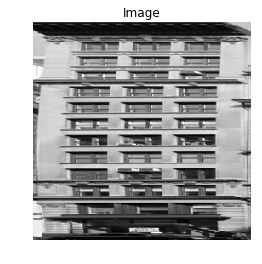

In [20]:
visualize_bw_image(real_images[0]/255)

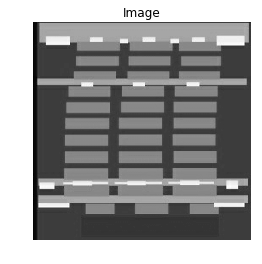

In [21]:
visualize_bw_image(input_images[0]/255.0)

In [22]:
training_facade_photos=real_images
training_facade_labels=input_images

In [23]:
path='../input/dataset/facades'
facade_test=[f for f in os.listdir(os.path.join(path, 'test'))]

In [24]:
input_images=[]
real_images=[]

In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

for img in facade_test:
    final_path=os.path.join('../input/dataset/facades/test',img)
    inp, re = load(final_path)
    inp=np.array(inp)
    inp=rgb2gray(inp)
    input_images.append(inp)
    re=np.array(re)
    re=rgb2gray(re)
    real_images.append(re)

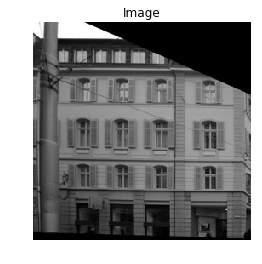

In [26]:
visualize_bw_image(real_images[0]/255)

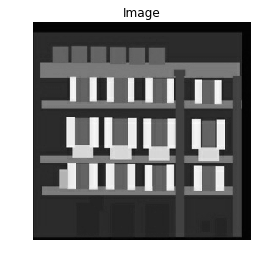

In [27]:
visualize_bw_image(input_images[0]/255.0)

In [28]:
real_images=np.stack(real_images)

In [29]:
input_images=np.stack(input_images)

In [30]:
real_images.shape
input_images.shape

(106, 256, 256)

In [31]:
input_images.shape

(106, 256, 256)

In [32]:
real_images=real_images.reshape((106, 256, 256, 1))
input_images=input_images.reshape((106, 256, 256, 1))

In [33]:
test_facade_photos=real_images
test_facade_labels=input_images

In [34]:
path='../input/dataset/facades'
facade_val=[f for f in os.listdir(os.path.join(path, 'val'))]

In [35]:
input_images=[]
real_images=[]

In [36]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

for img in facade_val:
    final_path=os.path.join('../input/dataset/facades/val',img)
    inp, re = load(final_path)
    inp=np.array(inp)
    inp=rgb2gray(inp)
    input_images.append(inp)
    re=np.array(re)
    re=rgb2gray(re)
    real_images.append(re)

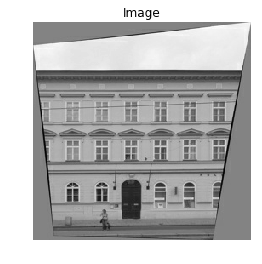

In [37]:
visualize_bw_image(real_images[0]/255)

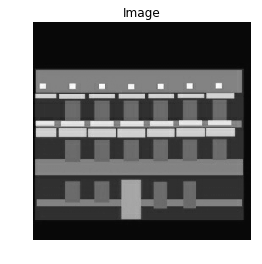

In [38]:
visualize_bw_image(input_images[0]/255.0)

In [39]:
real_images=np.stack(real_images)

In [40]:
input_images=np.stack(input_images)

In [41]:
real_images.shape

(100, 256, 256)

In [42]:
real_images=real_images.reshape((100, 256, 256, 1))
input_images=input_images.reshape((100, 256, 256, 1))

In [43]:
real_images.shape

(100, 256, 256, 1)

In [44]:
validation_facade_photos=real_images
validation_facade_labels=input_images

In [45]:
#!pip install tensorflow==1.13.1
#!pip install keras==2.0.9

In [46]:
#!pip install -q tensorflow==2.0.0-alpha0

In [47]:
# !pip install absl-py==0.4.1
# !pip install astor==0.7.1
# !pip install cycler==0.10.0
# !pip install gast==0.2.0
# !pip install graphviz==0.9

# !pip install grpcio==1.15.0

# !pip install Keras==2.2.2

# !pip install Keras-Applications==1.0.4

# !pip install Keras-Preprocessing==1.0.2

# !pip install kiwisolver==1.0.1

# !pip install Markdown==2.6.11

# !pip install matplotlib==3.0.0

# !pip install numpy==1.14.5

# !pip install opencv-python==3.4.3.18

# !pip install pkg-resources==0.0.0

# !pip install protobuf==3.6.1

# !pip install pydot==1.2.4

# !pip install pyparsing==2.2.1
# !pip install python-dateutil==2.7.3

# !pip install PyYAML==3.13

# !pip install scipy==1.1.0

# !pip install six==1.11.0

# !pip install tensorboard==1.10.0

# !pip install tensorflow==1.10.1

# !pip install termcolor==1.1.0

# !pip install Werkzeug==0.14.1


In [48]:
!pip install tensorboard==1.13.0

     |████████████████████████████████| 3.2MB 9.4MB/s eta 0:00:01
  Found existing installation: tensorboard 1.13.1
    Uninstalling tensorboard-1.13.1:
      Successfully uninstalled tensorboard-1.13.1


In [49]:
import tensorflow as tf

In [50]:
import os
import time

import h5py
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt
import numpy as np
from cv2 import imwrite
from tensorflow.keras import Input, Model
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Convolution2D, LeakyReLU, BatchNormalization, UpSampling2D, Dropout, Activation, Flatten,  Dense, Lambda, Reshape, concatenate
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

In [51]:
# import os
# import time
# import h5py
# import tensorflow.keras.backend as K
# import matplotlib.pyplot as plt
# import numpy as np
# from cv2 import imwrite
# from keras import Input, Model
# from tensorflow.keras.layers import Convolution2D, LeakyReLU, BatchNormalization, UpSampling2D, Dropout
# from tensorflow.keras.optimizers import Adam

In [52]:
def build_unet_generator():
    """
    Create the U-Net Generator using the hyperparameter values defined below
    """
    kernel_size = 4
    strides = 2
    leakyrelu_alpha = 0.2
    upsampling_size = 2
    dropout = 0.5
    output_channels = 1
    input_shape = (256, 256, 1)

    input_layer = Input(shape=input_shape)

    # Encoder Network

    # 1st Convolutional block in the encoder network
    encoder1 = Convolution2D(filters=64, kernel_size=kernel_size, padding='same',
                             strides=strides)(input_layer)
    encoder1 = LeakyReLU(alpha=leakyrelu_alpha)(encoder1)

    # 2nd Convolutional block in the encoder network
    encoder2 = Convolution2D(filters=128, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder1)
    encoder2 = BatchNormalization()(encoder2)
    encoder2 = LeakyReLU(alpha=leakyrelu_alpha)(encoder2)

    # 3rd Convolutional block in the encoder network
    encoder3 = Convolution2D(filters=256, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder2)
    encoder3 = BatchNormalization()(encoder3)
    encoder3 = LeakyReLU(alpha=leakyrelu_alpha)(encoder3)

    # 4th Convolutional block in the encoder network
    encoder4 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder3)
    encoder4 = BatchNormalization()(encoder4)
    encoder4 = LeakyReLU(alpha=leakyrelu_alpha)(encoder4)

    # 5th Convolutional block in the encoder network
    encoder5 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder4)
    encoder5 = BatchNormalization()(encoder5)
    encoder5 = LeakyReLU(alpha=leakyrelu_alpha)(encoder5)

    # 6th Convolutional block in the encoder network
    encoder6 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder5)
    encoder6 = BatchNormalization()(encoder6)
    encoder6 = LeakyReLU(alpha=leakyrelu_alpha)(encoder6)

    # 7th Convolutional block in the encoder network
    encoder7 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder6)
    encoder7 = BatchNormalization()(encoder7)
    encoder7 = LeakyReLU(alpha=leakyrelu_alpha)(encoder7)

    # 8th Convolutional block in the encoder network
    encoder8 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same',
                             strides=strides)(encoder7)
    encoder8 = BatchNormalization()(encoder8)
    encoder8 = LeakyReLU(alpha=leakyrelu_alpha)(encoder8)

    # Decoder Network

    # 1st Upsampling Convolutional Block in the decoder network
    decoder1 = UpSampling2D(size=upsampling_size)(encoder8)
    decoder1 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same')(decoder1)
    decoder1 = BatchNormalization()(decoder1)
    decoder1 = Dropout(dropout)(decoder1)
    decoder1 = concatenate([decoder1, encoder7], axis=3)
    decoder1 = Activation('relu')(decoder1)

    # 2nd Upsampling Convolutional block in the decoder network
    decoder2 = UpSampling2D(size=upsampling_size)(decoder1)
    decoder2 = Convolution2D(filters=1024, kernel_size=kernel_size, padding='same')(decoder2)
    decoder2 = BatchNormalization()(decoder2)
    decoder2 = Dropout(dropout)(decoder2)
    decoder2 = concatenate([decoder2, encoder6])
    decoder2 = Activation('relu')(decoder2)

    # 3rd Upsampling Convolutional block in the decoder network
    decoder3 = UpSampling2D(size=upsampling_size)(decoder2)
    decoder3 = Convolution2D(filters=1024, kernel_size=kernel_size, padding='same')(decoder3)
    decoder3 = BatchNormalization()(decoder3)
    decoder3 = Dropout(dropout)(decoder3)
    decoder3 = concatenate([decoder3, encoder5])
    decoder3 = Activation('relu')(decoder3)

    # 4th Upsampling Convolutional block in the decoder network
    decoder4 = UpSampling2D(size=upsampling_size)(decoder3)
    decoder4 = Convolution2D(filters=1024, kernel_size=kernel_size, padding='same')(decoder4)
    decoder4 = BatchNormalization()(decoder4)
    decoder4 = concatenate([decoder4, encoder4])
    decoder4 = Activation('relu')(decoder4)

    # 5th Upsampling Convolutional block in the decoder network
    decoder5 = UpSampling2D(size=upsampling_size)(decoder4)
    decoder5 = Convolution2D(filters=1024, kernel_size=kernel_size, padding='same')(decoder5)
    decoder5 = BatchNormalization()(decoder5)
    decoder5 = concatenate([decoder5, encoder3])
    decoder5 = Activation('relu')(decoder5)

    # 6th Upsampling Convolutional block in the decoder network
    decoder6 = UpSampling2D(size=upsampling_size)(decoder5)
    decoder6 = Convolution2D(filters=512, kernel_size=kernel_size, padding='same')(decoder6)
    decoder6 = BatchNormalization()(decoder6)
    decoder6 = concatenate([decoder6, encoder2])
    decoder6 = Activation('relu')(decoder6)

    # 7th Upsampling Convolutional block in the decoder network
    decoder7 = UpSampling2D(size=upsampling_size)(decoder6)
    decoder7 = Convolution2D(filters=256, kernel_size=kernel_size, padding='same')(decoder7)
    decoder7 = BatchNormalization()(decoder7)
    decoder7 = concatenate([decoder7, encoder1])
    decoder7 = Activation('relu')(decoder7)

    # Last Convolutional layer
    decoder8 = UpSampling2D(size=upsampling_size)(decoder7)
    decoder8 = Convolution2D(filters=output_channels, kernel_size=kernel_size, padding='same')(decoder8)
    decoder8 = Activation('tanh')(decoder8)

    model = Model(inputs=[input_layer], outputs=[decoder8])
    return model


In [53]:
def build_patchgan_discriminator():
    """
    Create the PatchGAN discriminator using the hyperparameter values defined below
    """
    kernel_size = 4
    strides = 2
    leakyrelu_alpha = 0.2
    padding = 'same'
    num_filters_start = 64  # Number of filters to start with
    num_kernels = 100
    kernel_dim = 5
    patchgan_output_dim = (256, 256, 1)
    patchgan_patch_dim = (256, 256, 1)
    number_patches = int(
        (patchgan_output_dim[0] / patchgan_patch_dim[0]) * (patchgan_output_dim[1] / patchgan_patch_dim[1]))

    input_layer = Input(shape=patchgan_patch_dim)

    des = Convolution2D(filters=64, kernel_size=kernel_size, padding=padding, strides=strides)(input_layer)
    des = LeakyReLU(alpha=leakyrelu_alpha)(des)

    # Calculate the number of convolutional layers
    total_conv_layers = int(np.floor(np.log(patchgan_output_dim[1]) / np.log(2)))
    list_filters = [num_filters_start * min(total_conv_layers, (2 ** i)) for i in range(total_conv_layers)]

    # Next 7 Convolutional blocks
    for filters in list_filters[1:]:
        des = Convolution2D(filters=filters, kernel_size=kernel_size, padding=padding, strides=strides)(des)
        des = BatchNormalization()(des)
        des = LeakyReLU(alpha=leakyrelu_alpha)(des)

    # Add a flatten layer
    flatten_layer = Flatten()(des)

    # Add the final dense layer
    dense_layer = Dense(units=2, activation='softmax')(flatten_layer)

    # Create the PatchGAN model
    model_patch_gan = Model(inputs=[input_layer], outputs=[dense_layer, flatten_layer])

    # Create a list of input layers equal to the number of patches
    list_input_layers = [Input(shape=patchgan_patch_dim) for _ in range(number_patches)]

    # Pass the patches through the PatchGAN network
    output1 = [model_patch_gan(patch)[0] for patch in list_input_layers]
    output2 = [model_patch_gan(patch)[1] for patch in list_input_layers]

    # In case of multiple patches, concatenate outputs to calculate perceptual loss
    if len(output1) > 1:
        output1 = concatenate(output1)
    else:
        output1 = output1[0]

    # In case of multiple patches, merge output2 as well
    if len(output2) > 1:
        output2 = concatenate(output2)
    else:
        output2 = output2[0]

    # Add a dense layer
    dense_layer2 = Dense(num_kernels * kernel_dim, use_bias=False, activation=None)

    # Add a lambda layer
    custom_loss_layer = Lambda(lambda x: K.sum(
        K.exp(-K.sum(K.abs(K.expand_dims(x, 3) - K.expand_dims(K.permute_dimensions(x, pattern=(1, 2, 0)), 0)), 2)), 2))

    # Pass the output2 tensor through dense_layer2
    output2 = dense_layer2(output2)

    # Reshape the output2 tensor
    output2 = Reshape((num_kernels, kernel_dim))(output2)

    # Pass the output2 tensor through the custom_loss_layer
    output2 = custom_loss_layer(output2)

    # Finally concatenate output1 and output2
    output1 = concatenate([output1, output2])
    final_output = Dense(2, activation="softmax")(output1)

    # Create a discriminator model
    discriminator = Model(inputs=list_input_layers, outputs=[final_output])
    return discriminator

In [54]:
def build_adversarial_model(generator, discriminator):
    """
    Create an adversarial model
    """
    input_image_dim = (256, 256, 1)
    patch_dim = (256, 256)

    # Create an input layer
    input_layer = Input(shape=input_image_dim)

    # Use the generator network to generate images
    generated_images = generator(input_layer)

    # Extract patches from the generated images
    img_height, img_width = input_img_dim[:2]
    patch_height, patch_width = patch_dim

    row_idx_list = [(i * patch_height, (i + 1) * patch_height) for i in range(int(img_height / patch_height))]
    column_idx_list = [(i * patch_width, (i + 1) * patch_width) for i in range(int(img_width / patch_width))]

    generated_patches_list = []
    for row_idx in row_idx_list:
        for column_idx in column_idx_list:
            generated_patches_list.append(Lambda(lambda z: z[:, column_idx[0]:column_idx[1], row_idx[0]:row_idx[1], :],
                                                 output_shape=input_img_dim)(generated_images))

    discriminator.trainable = False

    # Pass the generated patches through the discriminator network
    dis_output = discriminator(generated_patches_list)

    # Create a model
    model = Model(inputs=[input_layer], outputs=[generated_images, dis_output])
    return model

In [55]:
epochs = 500
num_images_per_epoch = 400
batch_size = 1
img_width = 256
img_height = 256
num_channels = 1
input_img_dim = (256, 256, 1)
patch_dim = (256, 256)

In [56]:
common_optimizer = Adam(lr=1E-4, beta_1=0.9, beta_2=0.999,epsilon=1e-08)

In [57]:
patchgan_discriminator = build_patchgan_discriminator()
patchgan_discriminator.compile(loss='binary_crossentropy', optimizer=common_optimizer)

In [58]:
# def write_log(callback, name, loss, batch_no):
#     """
#     Write training summary to TensorBoard
#     """
#     # for name, value in zip(names, logs):
#     summary = tf.Summary()
#     summary_value = summary.value.add()
#     summary_value.simple_value = loss
#     summary_value.tag = name
#     callback.writer.add_summary(summary, batch_no)
#     callback.writer.flush()


In [59]:
def save_bw_image(img, path):
    """
    Save a black and white image
    """
    img= img.squeeze()
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(img, cmap='gray', interpolation='nearest')
    ax.axis("off")
    ax.set_title("Image")
    plt.savefig(path)

In [60]:
def visualize_rgb(img):
    """
    Visualize a rgb image
    :param img: RGB image
    """
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title("Image")
    plt.show()

In [61]:
def save_images(real_images, real_sketches, generated_images, num_epoch, dataset_name, limit):
    real_sketches = real_sketches * 255.0
    real_images = real_images * 255.0
    generated_images = generated_images * 255.0

    # Save some images only
    real_sketches = real_sketches[:limit]
    generated_images = generated_images[:limit]
    real_images = real_images[:limit]

    # Create a stack of images
    X = np.hstack((real_sketches, generated_images, real_images))

    # Save stack of images
    imwrite('results/X_full_{}_{}.png'.format(dataset_name, num_epoch), X[0])

In [62]:
def generate_and_extract_patches(images, facades, generator_model, batch_counter, patch_dim):
    # Alternatively, train the discriminator network on real and generated images
    if batch_counter % 2 == 0:
        # Generate fake images
        output_images = generator_model.predict(facades)

        # Create a batch of ground truth labels
        labels = np.zeros((output_images.shape[0], 2), dtype=np.uint8)
        labels[:, 0] = 1

    else:
        # Take real images
        output_images = images

        # Create a batch of ground truth labels
        labels = np.zeros((output_images.shape[0], 2), dtype=np.uint8)
        labels[:, 1] = 1

    patches = []
    for y in range(0, output_images.shape[0], patch_dim[0]):
        for x in range(0, output_images.shape[1], patch_dim[1]):
            image_patches = output_images[:, y: y + patch_dim[0], x: x + patch_dim[1], :]
            patches.append(np.asarray(image_patches, dtype=np.float32))

    return patches, labels

In [63]:
unet_generator = build_unet_generator()
unet_generator.compile(loss='mae', optimizer=common_optimizer)

In [64]:
adversarial_model = build_adversarial_model(unet_generator, patchgan_discriminator)
adversarial_model.compile(loss=['mae', 'binary_crossentropy'], loss_weights=[1E2, 1], optimizer=common_optimizer)

In [65]:
tensorboard = TensorBoard(log_dir="logs/{}".format(time.time()))
tensorboard.set_model(unet_generator)
tensorboard.set_model(patchgan_discriminator)

In [66]:
epochs=500

Starting the training...
Epoch 0
Batch:0
Discriminator loss: 0.27233315
Generator loss: [13089.637, 130.89369, 0.26801106]
Batch:1
Discriminator loss: 1.4477441
Generator loss: [12937.464, 129.37193, 0.27012438]
Batch:2
Discriminator loss: 0.26740563
Generator loss: [10702.614, 107.02344, 0.2709045]
Batch:3
Discriminator loss: 1.4381499
Generator loss: [10917.513, 109.17239, 0.27307218]
Batch:4
Discriminator loss: 0.27036047
Generator loss: [8759.356, 87.59082, 0.27438197]
Batch:5
Discriminator loss: 1.426694
Generator loss: [12155.663, 121.55386, 0.27656484]
Batch:6
Discriminator loss: 0.2740007
Generator loss: [13535.926, 135.35648, 0.2781724]
Batch:7
Discriminator loss: 1.4138864
Generator loss: [12305.323, 123.05043, 0.28058016]
Batch:8
Discriminator loss: 0.2780986
Generator loss: [13603.285, 136.03003, 0.28248322]
Batch:9
Discriminator loss: 1.3997095
Generator loss: [5847.1113, 58.46826, 0.28500584]
Batch:10
Discriminator loss: 0.2825778
Generator loss: [11330.356, 113.3007, 0.2

Discriminator loss: 0.52931535
Generator loss: [8245.236, 82.44705, 0.5309844]
Batch:93
Discriminator loss: 0.8867942
Generator loss: [9616.042, 96.15508, 0.5337763]
Batch:94
Discriminator loss: 0.5337763
Generator loss: [11630.095, 116.29559, 0.5353914]
Batch:95
Discriminator loss: 0.8805373
Generator loss: [14189.147, 141.8861, 0.5381383]
Batch:96
Discriminator loss: 0.5381383
Generator loss: [14751.172, 147.50632, 0.53970087]
Batch:97
Discriminator loss: 0.874483
Generator loss: [15558.574, 155.58032, 0.54240215]
Batch:98
Discriminator loss: 0.54240215
Generator loss: [12953.556, 129.53012, 0.5439117]
Batch:99
Discriminator loss: 0.8686272
Generator loss: [13214.161, 132.13614, 0.5465686]
Batch:100
Discriminator loss: 0.5465686
Generator loss: [8958.882, 89.583336, 0.54802644]
Batch:101
Discriminator loss: 0.86296177
Generator loss: [12744.55, 127.43999, 0.5506388]
Batch:102
Discriminator loss: 0.5506388
Generator loss: [10909.216, 109.08664, 0.5520452]
Batch:103
Discriminator loss:

Discriminator loss: 0.65130764
Generator loss: [7713.8755, 77.13224, 0.65127605]
Batch:185
Discriminator loss: 0.7368479
Generator loss: [14094.087, 140.93434, 0.65258205]
Batch:186
Discriminator loss: 0.65258205
Generator loss: [12057.494, 120.56842, 0.65253115]
Batch:187
Discriminator loss: 0.7354826
Generator loss: [6247.325, 62.466713, 0.65381885]
Batch:188
Discriminator loss: 0.65381885
Generator loss: [14035.096, 140.34442, 0.6537486]
Batch:189
Discriminator loss: 0.7341615
Generator loss: [13865.252, 138.64597, 0.6550191]
Batch:190
Discriminator loss: 0.6550191
Generator loss: [11709.765, 117.091095, 0.65493]
Batch:191
Discriminator loss: 0.73288274
Generator loss: [10043.114, 100.42458, 0.6561835]
Batch:192
Discriminator loss: 0.6561835
Generator loss: [10369.135, 103.684784, 0.6560763]
Batch:193
Discriminator loss: 0.731645
Generator loss: [10433.984, 104.33327, 0.65731347]
Batch:194
Discriminator loss: 0.65731347
Generator loss: [13742.102, 137.41444, 0.6571886]
Batch:195
Dis

Discriminator loss: 0.7039543
Generator loss: [12713.336, 127.126526, 0.6833037]
Batch:276
Discriminator loss: 0.6833037
Generator loss: [12317.207, 123.165245, 0.6827699]
Batch:277
Discriminator loss: 0.70363283
Generator loss: [11185.918, 111.85235, 0.68361384]
Batch:278
Discriminator loss: 0.68361384
Generator loss: [10985.579, 109.84897, 0.68307513]
Batch:279
Discriminator loss: 0.7033212
Generator loss: [15081.131, 150.80447, 0.683914]
Batch:280
Discriminator loss: 0.683914
Generator loss: [10306.454, 103.0577, 0.6833708]
Batch:281
Discriminator loss: 0.7030196
Generator loss: [11760.881, 117.60196, 0.68420523]
Batch:282
Discriminator loss: 0.68420523
Generator loss: [13260.465, 132.59781, 0.6836574]
Batch:283
Discriminator loss: 0.70272744
Generator loss: [13306.067, 133.05383, 0.6844874]
Batch:284
Discriminator loss: 0.6844874
Generator loss: [9502.534, 95.0185, 0.6839355]
Batch:285
Discriminator loss: 0.7024441
Generator loss: [12633.443, 126.32759, 0.6847613]
Batch:286
Discrim

Discriminator loss: 0.6909366
Generator loss: [11966.588, 119.65897, 0.6902892]
Batch:367
Discriminator loss: 0.696013
Generator loss: [13701.872, 137.01181, 0.69101363]
Batch:368
Discriminator loss: 0.69101363
Generator loss: [11277.028, 112.76338, 0.6903649]
Batch:369
Discriminator loss: 0.6959368
Generator loss: [10850.136, 108.494446, 0.69108796]
Batch:370
Discriminator loss: 0.69108796
Generator loss: [6904.718, 69.040276, 0.69043857]
Batch:371
Discriminator loss: 0.69586277
Generator loss: [12050.525, 120.49834, 0.69116044]
Batch:372
Discriminator loss: 0.69116044
Generator loss: [15059.26, 150.5857, 0.6905098]
Batch:373
Discriminator loss: 0.6957911
Generator loss: [14631.022, 146.30331, 0.69123024]
Batch:374
Discriminator loss: 0.69123024
Generator loss: [10899.585, 108.988945, 0.6905791]
Batch:375
Discriminator loss: 0.69572145
Generator loss: [13902.908, 139.02217, 0.69129807]
Batch:376
Discriminator loss: 0.69129807
Generator loss: [12529.043, 125.28352, 0.6906459]
Batch:377

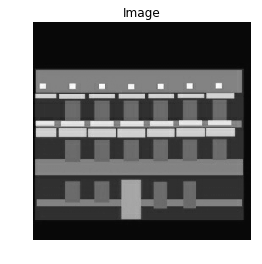

facade real_image:-


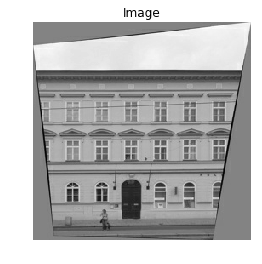

facade generated_image:-


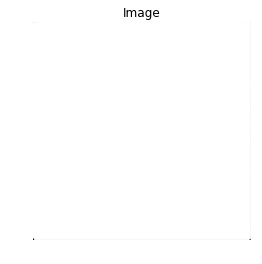

facade label:-


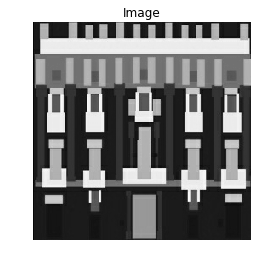

facade real_image:-


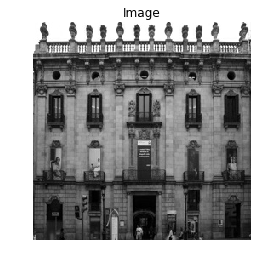

facade generated_image:-


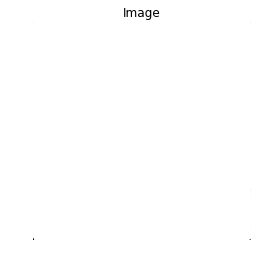

facade label:-


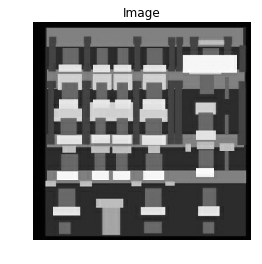

facade real_image:-


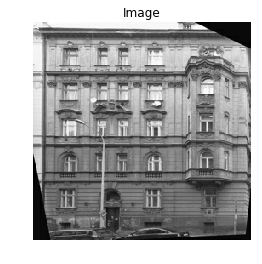

facade generated_image:-


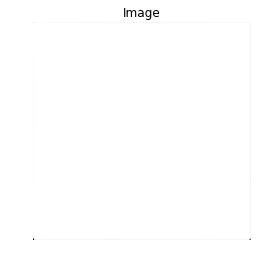

facade label:-


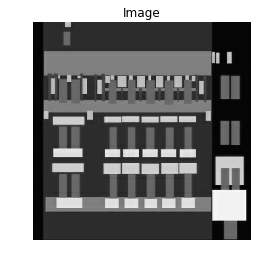

facade real_image:-


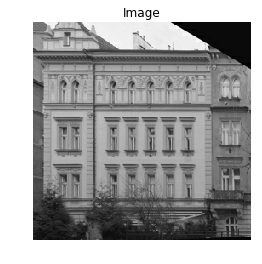

facade generated_image:-


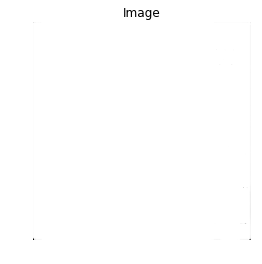

facade label:-


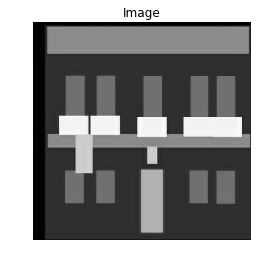

facade real_image:-


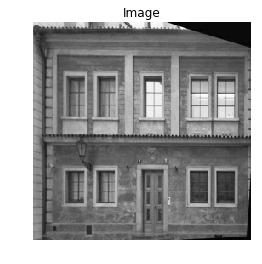

facade generated_image:-


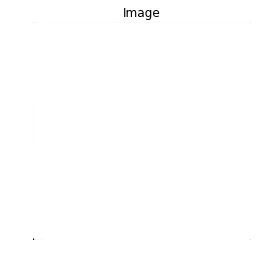

Epoch 1
Batch:0
Discriminator loss: 0.6919681
Generator loss: [12894.452, 128.9376, 0.6913078]
Batch:1
Discriminator loss: 0.6949895
Generator loss: [12784.178, 127.834854, 0.6920137]
Batch:2
Discriminator loss: 0.6920137
Generator loss: [10592.848, 105.92156, 0.691353]
Batch:3
Discriminator loss: 0.69494414
Generator loss: [10824.573, 108.23881, 0.6920577]
Batch:4
Discriminator loss: 0.6920577
Generator loss: [8691.126, 86.90434, 0.6913961]
Batch:5
Discriminator loss: 0.6949009
Generator loss: [12107.312, 121.06619, 0.69210035]
Batch:6
Discriminator loss: 0.69210035
Generator loss: [13485.939, 134.85248, 0.69143856]
Batch:7
Discriminator loss: 0.6948583
Generator loss: [12278.125, 122.77432, 0.69214153]
Batch:8
Discriminator loss: 0.69214153
Generator loss: [13569.6, 135.68909, 0.6914794]
Batch:9
Discriminator loss: 0.6948173
Generator loss: [5819.7246, 58.190323, 0.6921819]
Batch:10
Discriminator loss: 0.6921819
Generator loss: [11318.139, 113.17447, 0.6915198]
Batch:11
Discriminator

Discriminator loss: 0.6931012
Generator loss: [8245.393, 82.44701, 0.69243276]
Batch:93
Discriminator loss: 0.69386166
Generator loss: [9616.199, 96.15506, 0.6931119]
Batch:94
Discriminator loss: 0.6931119
Generator loss: [11630.25, 116.29558, 0.6924436]
Batch:95
Discriminator loss: 0.69385076
Generator loss: [14189.301, 141.88608, 0.69312286]
Batch:96
Discriminator loss: 0.69312286
Generator loss: [14751.319, 147.50627, 0.6924545]
Batch:97
Discriminator loss: 0.6938399
Generator loss: [15558.723, 155.58029, 0.6931333]
Batch:98
Discriminator loss: 0.6931333
Generator loss: [12953.701, 129.53009, 0.69246507]
Batch:99
Discriminator loss: 0.6938294
Generator loss: [13214.305, 132.13611, 0.6931431]
Batch:100
Discriminator loss: 0.6931431
Generator loss: [8959.022, 89.5833, 0.6924749]
Batch:101
Discriminator loss: 0.6938195
Generator loss: [12744.689, 127.439964, 0.6931528]
Batch:102
Discriminator loss: 0.6931528
Generator loss: [10909.356, 109.08664, 0.6924845]
Batch:103
Discriminator loss

Discriminator loss: 0.6935791
Generator loss: [9838.45, 98.37757, 0.69338083]
Batch:184
Discriminator loss: 0.69338083
Generator loss: [7713.9155, 77.132225, 0.69271815]
Batch:185
Discriminator loss: 0.693576
Generator loss: [14094.126, 140.93433, 0.6933838]
Batch:186
Discriminator loss: 0.6933838
Generator loss: [12057.533, 120.568405, 0.6927211]
Batch:187
Discriminator loss: 0.69357306
Generator loss: [6247.3647, 62.466713, 0.6933865]
Batch:188
Discriminator loss: 0.6933865
Generator loss: [14035.133, 140.3444, 0.69272393]
Batch:189
Discriminator loss: 0.69357026
Generator loss: [13865.288, 138.64595, 0.6933885]
Batch:190
Discriminator loss: 0.6933885
Generator loss: [11709.801, 117.09109, 0.6927261]
Batch:191
Discriminator loss: 0.693568
Generator loss: [10043.151, 100.424576, 0.6933906]
Batch:192
Discriminator loss: 0.6933906
Generator loss: [10369.169, 103.68477, 0.69272846]
Batch:193
Discriminator loss: 0.6935656
Generator loss: [10434.019, 104.33325, 0.6933929]
Batch:194
Discrim

Discriminator loss: 0.69344735
Generator loss: [12309.642, 123.08949, 0.6927927]
Batch:275
Discriminator loss: 0.69350135
Generator loss: [12713.346, 127.126526, 0.6934477]
Batch:276
Discriminator loss: 0.6934477
Generator loss: [12317.217, 123.165245, 0.69279367]
Batch:277
Discriminator loss: 0.6935004
Generator loss: [11185.928, 111.85234, 0.69344866]
Batch:278
Discriminator loss: 0.69344866
Generator loss: [10985.589, 109.84897, 0.6927946]
Batch:279
Discriminator loss: 0.69349945
Generator loss: [15081.14, 150.80446, 0.6934496]
Batch:280
Discriminator loss: 0.6934496
Generator loss: [10306.462, 103.05769, 0.69279575]
Batch:281
Discriminator loss: 0.6934984
Generator loss: [11760.888, 117.601944, 0.6934507]
Batch:282
Discriminator loss: 0.6934507
Generator loss: [13260.474, 132.59781, 0.692797]
Batch:283
Discriminator loss: 0.69349706
Generator loss: [13306.076, 133.05383, 0.6934509]
Batch:284
Discriminator loss: 0.6934509
Generator loss: [9502.543, 95.0185, 0.69279736]
Batch:285
Dis

Discriminator loss: 0.69347763
Generator loss: [11245.715, 112.45022, 0.6934625]
Batch:366
Discriminator loss: 0.6934625
Generator loss: [11966.59, 119.65897, 0.69281656]
Batch:367
Discriminator loss: 0.6934775
Generator loss: [13701.874, 137.01181, 0.6934626]
Batch:368
Discriminator loss: 0.6934626
Generator loss: [11277.03, 112.763374, 0.69281703]
Batch:369
Discriminator loss: 0.69347703
Generator loss: [10850.137, 108.49444, 0.6934627]
Batch:370
Discriminator loss: 0.6934627
Generator loss: [6904.72, 69.040276, 0.69281733]
Batch:371
Discriminator loss: 0.6934767
Generator loss: [12050.526, 120.49833, 0.69346285]
Batch:372
Discriminator loss: 0.69346285
Generator loss: [15059.262, 150.5857, 0.6928179]
Batch:373
Discriminator loss: 0.6934762
Generator loss: [14631.024, 146.30331, 0.69346356]
Batch:374
Discriminator loss: 0.69346356
Generator loss: [10899.587, 108.988945, 0.6928187]
Batch:375
Discriminator loss: 0.69347537
Generator loss: [13902.909, 139.02216, 0.69346356]
Batch:376
Di

Discriminator loss: 0.6934674
Generator loss: [7539.9976, 75.39304, 0.69346404]
Batch:58
Discriminator loss: 0.69346404
Generator loss: [11442.516, 114.41823, 0.6928267]
Batch:59
Discriminator loss: 0.6934674
Generator loss: [10090.342, 100.896484, 0.6934637]
Batch:60
Discriminator loss: 0.6934637
Generator loss: [11478.186, 114.77493, 0.6928267]
Batch:61
Discriminator loss: 0.6934674
Generator loss: [9838.174, 98.37481, 0.6934637]
Batch:62
Discriminator loss: 0.6934637
Generator loss: [10968.652, 109.6796, 0.6928268]
Batch:63
Discriminator loss: 0.69346726
Generator loss: [15174.119, 151.73425, 0.6934637]
Batch:64
Discriminator loss: 0.6934637
Generator loss: [8673.521, 86.72829, 0.6928268]
Batch:65
Discriminator loss: 0.69346726
Generator loss: [11037.082, 110.36389, 0.6934637]
Batch:66
Discriminator loss: 0.6934637
Generator loss: [12048.634, 120.479416, 0.69282687]
Batch:67
Discriminator loss: 0.69346714
Generator loss: [11459.555, 114.588615, 0.6934637]
Batch:68
Discriminator loss

Discriminator loss: 0.69346297
Generator loss: [9876.321, 98.75628, 0.69346046]
Batch:150
Discriminator loss: 0.69346046
Generator loss: [9635.071, 96.34379, 0.6928311]
Batch:151
Discriminator loss: 0.69346297
Generator loss: [12292.762, 122.920685, 0.69346046]
Batch:152
Discriminator loss: 0.69346046
Generator loss: [11284.132, 112.8344, 0.6928311]
Batch:153
Discriminator loss: 0.69346297
Generator loss: [13036.823, 130.3613, 0.69346046]
Batch:154
Discriminator loss: 0.69346046
Generator loss: [10659.306, 106.586136, 0.6928313]
Batch:155
Discriminator loss: 0.69346285
Generator loss: [9042.157, 90.41464, 0.69346035]
Batch:156
Discriminator loss: 0.69346035
Generator loss: [13026.883, 130.2619, 0.69283134]
Batch:157
Discriminator loss: 0.6934627
Generator loss: [8384.437, 83.83743, 0.69346035]
Batch:158
Discriminator loss: 0.69346035
Generator loss: [13491.711, 134.91019, 0.6928314]
Batch:159
Discriminator loss: 0.6934626
Generator loss: [14120.17, 141.19476, 0.69346035]
Batch:160
Disc

Discriminator loss: 0.6934588
Generator loss: [10158.127, 101.57434, 0.69345737]
Batch:242
Discriminator loss: 0.69345737
Generator loss: [12690.496, 126.89804, 0.69283545]
Batch:243
Discriminator loss: 0.69345856
Generator loss: [14669.291, 146.68597, 0.69345737]
Batch:244
Discriminator loss: 0.69345737
Generator loss: [9519.549, 95.18856, 0.69283545]
Batch:245
Discriminator loss: 0.69345856
Generator loss: [9551.304, 95.5061, 0.69345725]
Batch:246
Discriminator loss: 0.69345725
Generator loss: [12435.78, 124.35088, 0.69283545]
Batch:247
Discriminator loss: 0.69345856
Generator loss: [10496.755, 104.96062, 0.69345725]
Batch:248
Discriminator loss: 0.69345725
Generator loss: [12930.127, 129.29434, 0.6928356]
Batch:249
Discriminator loss: 0.69345844
Generator loss: [14423.143, 144.22449, 0.69345725]
Batch:250
Discriminator loss: 0.69345725
Generator loss: [8197.649, 81.969574, 0.6928356]
Batch:251
Discriminator loss: 0.69345844
Generator loss: [10212.518, 102.11824, 0.6934571]
Batch:252

Discriminator loss: 0.69345427
Generator loss: [9513.358, 95.12666, 0.69283855]
Batch:333
Discriminator loss: 0.69345546
Generator loss: [13337.232, 133.36539, 0.69345415]
Batch:334
Discriminator loss: 0.69345415
Generator loss: [11519.902, 115.1921, 0.69283855]
Batch:335
Discriminator loss: 0.69345546
Generator loss: [7683.3, 76.826065, 0.69345415]
Batch:336
Discriminator loss: 0.69345415
Generator loss: [11215.544, 112.14851, 0.69283867]
Batch:337
Discriminator loss: 0.69345546
Generator loss: [10923.951, 109.232574, 0.69345415]
Batch:338
Discriminator loss: 0.69345415
Generator loss: [12006.612, 120.059204, 0.69283944]
Batch:339
Discriminator loss: 0.6934546
Generator loss: [12366.2, 123.65507, 0.69345415]
Batch:340
Discriminator loss: 0.69345415
Generator loss: [13025.726, 130.25034, 0.69283944]
Batch:341
Discriminator loss: 0.6934546
Generator loss: [9252.052, 92.51359, 0.693454]
Batch:342
Discriminator loss: 0.693454
Generator loss: [14122.25, 141.21558, 0.69283944]
Batch:343
Dis

Discriminator loss: 0.69345224
Generator loss: [11520.115, 115.19423, 0.69284314]
Batch:25
Discriminator loss: 0.6934509
Generator loss: [11280.91, 112.80217, 0.69345224]
Batch:26
Discriminator loss: 0.69345224
Generator loss: [12732.3, 127.31608, 0.6928435]
Batch:27
Discriminator loss: 0.69345057
Generator loss: [11006.841, 110.06148, 0.693452]
Batch:28
Discriminator loss: 0.693452
Generator loss: [10463.524, 104.62832, 0.6928435]
Batch:29
Discriminator loss: 0.69345057
Generator loss: [15709.892, 157.09198, 0.6934519]
Batch:30
Discriminator loss: 0.6934519
Generator loss: [13752.298, 137.51605, 0.6928435]
Batch:31
Discriminator loss: 0.69345057
Generator loss: [9786.4, 97.85707, 0.6934519]
Batch:32
Discriminator loss: 0.6934519
Generator loss: [11266.968, 112.66275, 0.69284374]
Batch:33
Discriminator loss: 0.69345033
Generator loss: [9032.729, 90.32035, 0.6934519]
Batch:34
Discriminator loss: 0.6934519
Generator loss: [9890.0205, 98.89328, 0.69284374]
Batch:35
Discriminator loss: 0.6

Discriminator loss: 0.69344795
Generator loss: [12223.408, 122.22716, 0.6928447]
Batch:117
Discriminator loss: 0.6934494
Generator loss: [12970.246, 129.69553, 0.69344795]
Batch:118
Discriminator loss: 0.69344795
Generator loss: [10716.849, 107.16156, 0.6928447]
Batch:119
Discriminator loss: 0.6934494
Generator loss: [12871.923, 128.7123, 0.69344795]
Batch:120
Discriminator loss: 0.69344795
Generator loss: [14811.877, 148.11185, 0.69284475]
Batch:121
Discriminator loss: 0.69344926
Generator loss: [9339.829, 93.39136, 0.69344795]
Batch:122
Discriminator loss: 0.69344795
Generator loss: [13791.372, 137.9068, 0.6928454]
Batch:123
Discriminator loss: 0.69344866
Generator loss: [11509.47, 115.08776, 0.69344795]
Batch:124
Discriminator loss: 0.69344795
Generator loss: [13902.331, 139.01639, 0.6928455]
Batch:125
Discriminator loss: 0.69344854
Generator loss: [11819.197, 118.18504, 0.69344795]
Batch:126
Discriminator loss: 0.69344795
Generator loss: [12673.954, 126.73262, 0.6928455]
Batch:127


Discriminator loss: 0.6934451
Generator loss: [10682.0625, 106.81369, 0.69344664]
Batch:208
Discriminator loss: 0.69344664
Generator loss: [10211.145, 102.10452, 0.6928491]
Batch:209
Discriminator loss: 0.69344497
Generator loss: [9732.415, 97.317215, 0.69344664]
Batch:210
Discriminator loss: 0.69344664
Generator loss: [13113.974, 131.13281, 0.6928491]
Batch:211
Discriminator loss: 0.69344497
Generator loss: [10549.483, 105.4879, 0.6934465]
Batch:212
Discriminator loss: 0.6934465
Generator loss: [10216.051, 102.15358, 0.6928491]
Batch:213
Discriminator loss: 0.69344497
Generator loss: [8975.965, 89.752716, 0.6934465]
Batch:214
Discriminator loss: 0.6934465
Generator loss: [12875.256, 128.74564, 0.69284916]
Batch:215
Discriminator loss: 0.69344497
Generator loss: [5974.869, 59.74176, 0.6934464]
Batch:216
Discriminator loss: 0.6934464
Generator loss: [11099.001, 110.983086, 0.69284916]
Batch:217
Discriminator loss: 0.69344497
Generator loss: [11577.399, 115.76706, 0.6934464]
Batch:218
Di

Discriminator loss: 0.69344366
Generator loss: [13533.981, 135.33289, 0.6928509]
Batch:299
Discriminator loss: 0.6934432
Generator loss: [12544.156, 125.43463, 0.69344366]
Batch:300
Discriminator loss: 0.69344366
Generator loss: [10811.582, 108.108894, 0.6928509]
Batch:301
Discriminator loss: 0.6934432
Generator loss: [14525.028, 145.24335, 0.69344366]
Batch:302
Discriminator loss: 0.69344366
Generator loss: [11731.373, 117.30681, 0.69285107]
Batch:303
Discriminator loss: 0.69344306
Generator loss: [9430.528, 94.29835, 0.69344366]
Batch:304
Discriminator loss: 0.69344366
Generator loss: [10920.319, 109.19627, 0.69285107]
Batch:305
Discriminator loss: 0.69344306
Generator loss: [13921.361, 139.20668, 0.69344366]
Batch:306
Discriminator loss: 0.69344366
Generator loss: [12343.623, 123.429306, 0.6928511]
Batch:307
Discriminator loss: 0.69344294
Generator loss: [12133.817, 121.33124, 0.69344366]
Batch:308
Discriminator loss: 0.69344366
Generator loss: [14461.552, 144.6086, 0.6928511]
Batch

Discriminator loss: 0.69344187
Generator loss: [7807.082, 78.06389, 0.6934404]
Batch:390
Discriminator loss: 0.6934404
Generator loss: [11822.82, 118.22128, 0.69285226]
Batch:391
Discriminator loss: 0.69344187
Generator loss: [11357.455, 113.56762, 0.6934404]
Batch:392
Discriminator loss: 0.6934404
Generator loss: [9178.193, 91.77501, 0.69285256]
Batch:393
Discriminator loss: 0.6934415
Generator loss: [9631.823, 96.3113, 0.6934404]
Batch:394
Discriminator loss: 0.6934404
Generator loss: [10132.599, 101.31906, 0.69285256]
Batch:395
Discriminator loss: 0.6934415
Generator loss: [8311.045, 83.103516, 0.6934404]
Batch:396
Discriminator loss: 0.6934404
Generator loss: [11984.565, 119.83873, 0.6928526]
Batch:397
Discriminator loss: 0.69344145
Generator loss: [6803.873, 68.0318, 0.6934404]
Batch:398
Discriminator loss: 0.6934404
Generator loss: [13870.121, 138.69429, 0.6928527]
Batch:399
Discriminator loss: 0.6934414
Generator loss: [9516.805, 95.16111, 0.6934404]
Epoch 4
Batch:0
Discriminato

Discriminator loss: 0.6934385
Generator loss: [11855.749, 118.55056, 0.69343925]
Batch:82
Discriminator loss: 0.69343925
Generator loss: [9665.884, 96.65192, 0.6928556]
Batch:83
Discriminator loss: 0.6934385
Generator loss: [13397.913, 133.9722, 0.69343925]
Batch:84
Discriminator loss: 0.69343925
Generator loss: [10464.568, 104.638756, 0.6928556]
Batch:85
Discriminator loss: 0.6934385
Generator loss: [9105.674, 91.049805, 0.69343925]
Batch:86
Discriminator loss: 0.69343925
Generator loss: [11456.093, 114.55401, 0.6928556]
Batch:87
Discriminator loss: 0.6934385
Generator loss: [6797.788, 67.97095, 0.69343925]
Batch:88
Discriminator loss: 0.69343925
Generator loss: [9909.857, 99.09165, 0.6928556]
Batch:89
Discriminator loss: 0.6934385
Generator loss: [13380.207, 133.79514, 0.69343925]
Batch:90
Discriminator loss: 0.69343925
Generator loss: [10166.295, 101.65602, 0.6928556]
Batch:91
Discriminator loss: 0.6934385
Generator loss: [13286.469, 132.85776, 0.69343895]
Batch:92
Discriminator los

Discriminator loss: 0.69343674
Generator loss: [11630.289, 116.29596, 0.693437]
Batch:174
Discriminator loss: 0.693437
Generator loss: [12603.741, 126.03049, 0.6928573]
Batch:175
Discriminator loss: 0.69343674
Generator loss: [12488.638, 124.87945, 0.693437]
Batch:176
Discriminator loss: 0.693437
Generator loss: [13382.08, 133.81387, 0.69285744]
Batch:177
Discriminator loss: 0.6934366
Generator loss: [11974.315, 119.73622, 0.693437]
Batch:178
Discriminator loss: 0.693437
Generator loss: [12938.689, 129.37997, 0.6928575]
Batch:179
Discriminator loss: 0.6934366
Generator loss: [10592.13, 105.91437, 0.693437]
Batch:180
Discriminator loss: 0.693437
Generator loss: [13453.86, 134.53168, 0.69285756]
Batch:181
Discriminator loss: 0.6934365
Generator loss: [10353.493, 103.528, 0.693437]
Batch:182
Discriminator loss: 0.693437
Generator loss: [9625.806, 96.25113, 0.69285756]
Batch:183
Discriminator loss: 0.6934365
Generator loss: [9838.449, 98.377556, 0.693437]
Batch:184
Discriminator loss: 0.69

Discriminator loss: 0.6934353
Generator loss: [9340.808, 93.40115, 0.6928592]
Batch:265
Discriminator loss: 0.6934349
Generator loss: [6548.687, 65.479935, 0.6934353]
Batch:266
Discriminator loss: 0.6934353
Generator loss: [9593.759, 95.930664, 0.6928592]
Batch:267
Discriminator loss: 0.6934349
Generator loss: [13201.957, 132.01263, 0.6934353]
Batch:268
Discriminator loss: 0.6934353
Generator loss: [12710.114, 127.094215, 0.6928592]
Batch:269
Discriminator loss: 0.6934349
Generator loss: [14631.404, 146.30711, 0.6934353]
Batch:270
Discriminator loss: 0.6934353
Generator loss: [9872.332, 98.71639, 0.6928592]
Batch:271
Discriminator loss: 0.6934349
Generator loss: [5164.1807, 51.634872, 0.6934353]
Batch:272
Discriminator loss: 0.6934353
Generator loss: [12058.074, 120.57382, 0.6928592]
Batch:273
Discriminator loss: 0.6934349
Generator loss: [11466.406, 114.65713, 0.6934352]
Batch:274
Discriminator loss: 0.6934352
Generator loss: [12309.642, 123.08949, 0.6928592]
Batch:275
Discriminator l

Discriminator loss: 0.6934329
Generator loss: [9871.624, 98.709305, 0.69343436]
Batch:356
Discriminator loss: 0.69343436
Generator loss: [12002.513, 120.0182, 0.69286114]
Batch:357
Discriminator loss: 0.6934329
Generator loss: [11864.585, 118.638916, 0.69343424]
Batch:358
Discriminator loss: 0.69343424
Generator loss: [12083.305, 120.82612, 0.6928612]
Batch:359
Discriminator loss: 0.69343287
Generator loss: [9939.907, 99.392136, 0.69343424]
Batch:360
Discriminator loss: 0.69343424
Generator loss: [10639.527, 106.38835, 0.6928612]
Batch:361
Discriminator loss: 0.69343287
Generator loss: [12292.588, 122.918945, 0.69343424]
Batch:362
Discriminator loss: 0.69343424
Generator loss: [15011.093, 150.104, 0.6928612]
Batch:363
Discriminator loss: 0.69343287
Generator loss: [13552.152, 135.51459, 0.69343406]
Batch:364
Discriminator loss: 0.69343406
Generator loss: [16240.11, 162.39418, 0.6928612]
Batch:365
Discriminator loss: 0.69343287
Generator loss: [11245.715, 112.45022, 0.69343406]
Batch:36

Discriminator loss: 0.6934325
Generator loss: [10321.741, 103.21048, 0.69343174]
Batch:48
Discriminator loss: 0.69343174
Generator loss: [10682.348, 106.81655, 0.69286174]
Batch:49
Discriminator loss: 0.69343233
Generator loss: [11656.235, 116.55542, 0.69343174]
Batch:50
Discriminator loss: 0.69343174
Generator loss: [15213.348, 152.12656, 0.69286174]
Batch:51
Discriminator loss: 0.69343233
Generator loss: [10709.756, 107.09062, 0.69343174]
Batch:52
Discriminator loss: 0.69343174
Generator loss: [12413.429, 124.127365, 0.69286174]
Batch:53
Discriminator loss: 0.69343233
Generator loss: [15823.756, 158.23062, 0.69343174]
Batch:54
Discriminator loss: 0.69343174
Generator loss: [10777.453, 107.76761, 0.69286203]
Batch:55
Discriminator loss: 0.69343203
Generator loss: [9393.567, 93.92874, 0.69343174]
Batch:56
Discriminator loss: 0.69343174
Generator loss: [7517.601, 75.16908, 0.69286203]
Batch:57
Discriminator loss: 0.69343203
Generator loss: [7539.9976, 75.39304, 0.69343174]
Batch:58
Disc

Discriminator loss: 0.6934304
Generator loss: [11522.685, 115.21991, 0.6934309]
Batch:140
Discriminator loss: 0.6934309
Generator loss: [8131.2534, 81.3056, 0.6928637]
Batch:141
Discriminator loss: 0.6934304
Generator loss: [9247.565, 92.46872, 0.6934309]
Batch:142
Discriminator loss: 0.6934309
Generator loss: [12408.071, 124.07379, 0.6928637]
Batch:143
Discriminator loss: 0.6934304
Generator loss: [9850.207, 98.49514, 0.6934309]
Batch:144
Discriminator loss: 0.6934309
Generator loss: [10798.785, 107.98093, 0.6928637]
Batch:145
Discriminator loss: 0.6934304
Generator loss: [12666.083, 126.65389, 0.6934309]
Batch:146
Discriminator loss: 0.6934309
Generator loss: [12006.062, 120.053696, 0.69286376]
Batch:147
Discriminator loss: 0.6934303
Generator loss: [11626.803, 116.26109, 0.6934309]
Batch:148
Discriminator loss: 0.6934309
Generator loss: [8600.44, 85.99748, 0.6928639]
Batch:149
Discriminator loss: 0.6934302
Generator loss: [9876.321, 98.75628, 0.6934309]
Batch:150
Discriminator loss:

Discriminator loss: 0.6934291
Generator loss: [10137.676, 101.36982, 0.6934291]
Batch:232
Discriminator loss: 0.6934291
Generator loss: [13868.314, 138.67622, 0.69286495]
Batch:233
Discriminator loss: 0.6934291
Generator loss: [10070.655, 100.699615, 0.6934291]
Batch:234
Discriminator loss: 0.6934291
Generator loss: [10918.992, 109.183, 0.69286495]
Batch:235
Discriminator loss: 0.6934291
Generator loss: [8906.887, 89.061935, 0.6934291]
Batch:236
Discriminator loss: 0.6934291
Generator loss: [12403.966, 124.03273, 0.69286495]
Batch:237
Discriminator loss: 0.6934291
Generator loss: [11681.613, 116.8092, 0.693429]
Batch:238
Discriminator loss: 0.693429
Generator loss: [11685.512, 116.84819, 0.69286495]
Batch:239
Discriminator loss: 0.6934291
Generator loss: [10866.847, 108.66154, 0.693429]
Batch:240
Discriminator loss: 0.693429
Generator loss: [11901.729, 119.01036, 0.69286495]
Batch:241
Discriminator loss: 0.6934291
Generator loss: [10158.127, 101.57434, 0.693429]
Batch:242
Discriminator

Discriminator loss: 0.69342804
Generator loss: [12009.525, 120.08833, 0.69286567]
Batch:323
Discriminator loss: 0.6934284
Generator loss: [11606.613, 116.059204, 0.69342804]
Batch:324
Discriminator loss: 0.69342804
Generator loss: [10787.11, 107.86418, 0.69286567]
Batch:325
Discriminator loss: 0.6934284
Generator loss: [10993.518, 109.92824, 0.69342804]
Batch:326
Discriminator loss: 0.69342804
Generator loss: [10653.842, 106.531494, 0.6928658]
Batch:327
Discriminator loss: 0.6934283
Generator loss: [9301.949, 93.01256, 0.69342804]
Batch:328
Discriminator loss: 0.69342804
Generator loss: [13223.843, 132.2315, 0.6928658]
Batch:329
Discriminator loss: 0.6934283
Generator loss: [14201.215, 142.00522, 0.69342804]
Batch:330
Discriminator loss: 0.69342804
Generator loss: [11436.768, 114.36075, 0.6928658]
Batch:331
Discriminator loss: 0.6934283
Generator loss: [12104.839, 121.04146, 0.69342804]
Batch:332
Discriminator loss: 0.69342804
Generator loss: [9513.358, 95.12666, 0.6928658]
Batch:333
D

Discriminator loss: 0.6934267
Generator loss: [11901.843, 119.01149, 0.6934271]
Batch:14
Discriminator loss: 0.6934271
Generator loss: [12942.007, 129.41315, 0.69286734]
Batch:15
Discriminator loss: 0.6934267
Generator loss: [9310.036, 93.09343, 0.6934271]
Batch:16
Discriminator loss: 0.6934271
Generator loss: [10741.135, 107.40443, 0.69286734]
Batch:17
Discriminator loss: 0.6934267
Generator loss: [14974.503, 149.7381, 0.6934271]
Batch:18
Discriminator loss: 0.6934271
Generator loss: [9818.366, 98.17674, 0.69286734]
Batch:19
Discriminator loss: 0.6934267
Generator loss: [9385.529, 93.84836, 0.6934271]
Batch:20
Discriminator loss: 0.6934271
Generator loss: [11725.565, 117.24873, 0.69286734]
Batch:21
Discriminator loss: 0.6934267
Generator loss: [13615.48, 136.14787, 0.6934271]
Batch:22
Discriminator loss: 0.6934271
Generator loss: [11995.3, 119.946075, 0.69286734]
Batch:23
Discriminator loss: 0.6934267
Generator loss: [8227.567, 82.26874, 0.69342685]
Batch:24
Discriminator loss: 0.6934

Discriminator loss: 0.6934256
Generator loss: [12644.115, 126.43422, 0.6934264]
Batch:106
Discriminator loss: 0.6934264
Generator loss: [8721.228, 87.20535, 0.6928685]
Batch:107
Discriminator loss: 0.6934256
Generator loss: [9711.675, 97.10982, 0.69342625]
Batch:108
Discriminator loss: 0.69342625
Generator loss: [13899.011, 138.98318, 0.6928685]
Batch:109
Discriminator loss: 0.6934256
Generator loss: [11037.852, 110.37158, 0.69342625]
Batch:110
Discriminator loss: 0.69342625
Generator loss: [10671.884, 106.711914, 0.6928685]
Batch:111
Discriminator loss: 0.6934256
Generator loss: [12740.269, 127.39575, 0.69342625]
Batch:112
Discriminator loss: 0.69342625
Generator loss: [10783.766, 107.830734, 0.6928685]
Batch:113
Discriminator loss: 0.6934256
Generator loss: [14592.806, 145.92113, 0.69342625]
Batch:114
Discriminator loss: 0.69342625
Generator loss: [9972.476, 99.717834, 0.6928685]
Batch:115
Discriminator loss: 0.6934256
Generator loss: [11916.742, 119.160484, 0.69342625]
Batch:116
Dis

Discriminator loss: 0.69342554
Generator loss: [9989.14, 99.884476, 0.6928692]
Batch:197
Discriminator loss: 0.69342494
Generator loss: [14215.04, 142.14346, 0.69342554]
Batch:198
Discriminator loss: 0.69342554
Generator loss: [13947.787, 139.47095, 0.6928692]
Batch:199
Discriminator loss: 0.69342494
Generator loss: [9854.3955, 98.53702, 0.69342554]
Batch:200
Discriminator loss: 0.69342554
Generator loss: [11747.684, 117.46991, 0.6928692]
Batch:201
Discriminator loss: 0.69342494
Generator loss: [11697.254, 116.96561, 0.69342554]
Batch:202
Discriminator loss: 0.69342554
Generator loss: [14104.263, 141.0357, 0.6928692]
Batch:203
Discriminator loss: 0.69342494
Generator loss: [11895.007, 118.94313, 0.69342554]
Batch:204
Discriminator loss: 0.69342554
Generator loss: [9873.142, 98.724495, 0.6928692]
Batch:205
Discriminator loss: 0.69342494
Generator loss: [16230.097, 162.29404, 0.69342554]
Batch:206
Discriminator loss: 0.69342554
Generator loss: [7861.8135, 78.611206, 0.6928692]
Batch:207


Discriminator loss: 0.69342434
Generator loss: [11265.518, 112.64824, 0.69342446]
Batch:288
Discriminator loss: 0.69342446
Generator loss: [10723.664, 107.22972, 0.6928697]
Batch:289
Discriminator loss: 0.69342434
Generator loss: [12397.134, 123.96441, 0.69342446]
Batch:290
Discriminator loss: 0.69342446
Generator loss: [11721.219, 117.20526, 0.6928697]
Batch:291
Discriminator loss: 0.69342434
Generator loss: [11472.7295, 114.72036, 0.69342446]
Batch:292
Discriminator loss: 0.69342446
Generator loss: [8695.105, 86.94413, 0.6928697]
Batch:293
Discriminator loss: 0.69342434
Generator loss: [12309.979, 123.09285, 0.69342446]
Batch:294
Discriminator loss: 0.69342446
Generator loss: [11695.4375, 116.94745, 0.6928699]
Batch:295
Discriminator loss: 0.6934242
Generator loss: [11181.246, 111.80553, 0.69342446]
Batch:296
Discriminator loss: 0.69342446
Generator loss: [10848.672, 108.4798, 0.6928699]
Batch:297
Discriminator loss: 0.6934242
Generator loss: [9805.638, 98.049446, 0.69342446]
Batch:2

Discriminator loss: 0.69342333
Generator loss: [10553.143, 105.52449, 0.693424]
Batch:380
Discriminator loss: 0.693424
Generator loss: [8593.758, 85.93066, 0.69287074]
Batch:381
Discriminator loss: 0.69342333
Generator loss: [9928.728, 99.28034, 0.693424]
Batch:382
Discriminator loss: 0.693424
Generator loss: [12849.667, 128.48975, 0.69287074]
Batch:383
Discriminator loss: 0.69342333
Generator loss: [11202.088, 112.01395, 0.693424]
Batch:384
Discriminator loss: 0.693424
Generator loss: [14551.202, 145.5051, 0.69287074]
Batch:385
Discriminator loss: 0.69342333
Generator loss: [11466.918, 114.66225, 0.693424]
Batch:386
Discriminator loss: 0.693424
Generator loss: [8665.666, 86.649734, 0.6928709]
Batch:387
Discriminator loss: 0.69342315
Generator loss: [14045.045, 140.44351, 0.693424]
Batch:388
Discriminator loss: 0.693424
Generator loss: [9620.221, 96.19528, 0.6928709]
Batch:389
Discriminator loss: 0.69342315
Generator loss: [7807.082, 78.06389, 0.693424]
Batch:390
Discriminator loss: 0.

Discriminator loss: 0.69342226
Generator loss: [14240.439, 142.39746, 0.69342357]
Batch:72
Discriminator loss: 0.69342357
Generator loss: [11903.579, 119.02886, 0.6928718]
Batch:73
Discriminator loss: 0.69342226
Generator loss: [9763.955, 97.632614, 0.6934235]
Batch:74
Discriminator loss: 0.6934235
Generator loss: [13871.388, 138.70694, 0.6928718]
Batch:75
Discriminator loss: 0.69342226
Generator loss: [11390.268, 113.895744, 0.6934235]
Batch:76
Discriminator loss: 0.6934235
Generator loss: [11332.775, 113.32082, 0.6928718]
Batch:77
Discriminator loss: 0.69342226
Generator loss: [11946.728, 119.46034, 0.6934235]
Batch:78
Discriminator loss: 0.6934235
Generator loss: [13443.098, 134.42404, 0.6928718]
Batch:79
Discriminator loss: 0.69342226
Generator loss: [10291.457, 102.90764, 0.6934235]
Batch:80
Discriminator loss: 0.6934235
Generator loss: [12187.142, 121.86449, 0.6928718]
Batch:81
Discriminator loss: 0.69342226
Generator loss: [11855.749, 118.55056, 0.69342345]
Batch:82
Discriminato

Discriminator loss: 0.69342196
Generator loss: [11855.546, 118.54852, 0.69342244]
Batch:164
Discriminator loss: 0.69342244
Generator loss: [9977.533, 99.768394, 0.6928721]
Batch:165
Discriminator loss: 0.69342196
Generator loss: [9303.151, 93.02458, 0.69342244]
Batch:166
Discriminator loss: 0.69342244
Generator loss: [10362.33, 103.61636, 0.6928721]
Batch:167
Discriminator loss: 0.69342196
Generator loss: [9713.247, 97.125534, 0.69342244]
Batch:168
Discriminator loss: 0.69342244
Generator loss: [13726.816, 137.26123, 0.6928721]
Batch:169
Discriminator loss: 0.69342196
Generator loss: [12413.27, 124.12576, 0.69342244]
Batch:170
Discriminator loss: 0.69342244
Generator loss: [8212.887, 82.12193, 0.6928721]
Batch:171
Discriminator loss: 0.69342196
Generator loss: [11508.57, 115.078766, 0.69342244]
Batch:172
Discriminator loss: 0.69342244
Generator loss: [9128.604, 91.279106, 0.6928721]
Batch:173
Discriminator loss: 0.69342196
Generator loss: [11630.289, 116.29596, 0.69342244]
Batch:174
Di

Discriminator loss: 0.69342136
Generator loss: [10639.385, 106.38691, 0.6928723]
Batch:255
Discriminator loss: 0.69342184
Generator loss: [10587.8545, 105.87161, 0.69342136]
Batch:256
Discriminator loss: 0.69342136
Generator loss: [11005.152, 110.044586, 0.6928723]
Batch:257
Discriminator loss: 0.69342184
Generator loss: [13434.154, 134.33461, 0.69342136]
Batch:258
Discriminator loss: 0.69342136
Generator loss: [14390.714, 143.9002, 0.6928723]
Batch:259
Discriminator loss: 0.69342184
Generator loss: [11010.649, 110.09956, 0.69342136]
Batch:260
Discriminator loss: 0.69342136
Generator loss: [12642.886, 126.42192, 0.69287246]
Batch:261
Discriminator loss: 0.6934216
Generator loss: [10743.27, 107.42576, 0.69342136]
Batch:262
Discriminator loss: 0.69342136
Generator loss: [12578.662, 125.779686, 0.69287246]
Batch:263
Discriminator loss: 0.6934216
Generator loss: [9482.542, 94.81849, 0.69342136]
Batch:264
Discriminator loss: 0.69342136
Generator loss: [9340.809, 93.40115, 0.69287246]
Batch:

Discriminator loss: 0.69342124
Generator loss: [9955.245, 99.54552, 0.6928728]
Batch:345
Discriminator loss: 0.69342124
Generator loss: [14056.474, 140.5578, 0.69342124]
Batch:346
Discriminator loss: 0.69342124
Generator loss: [13200.538, 131.99844, 0.6928728]
Batch:347
Discriminator loss: 0.69342124
Generator loss: [13134.696, 131.34003, 0.69342124]
Batch:348
Discriminator loss: 0.69342124
Generator loss: [11452.257, 114.51563, 0.6928728]
Batch:349
Discriminator loss: 0.69342124
Generator loss: [11808.904, 118.08211, 0.69342124]
Batch:350
Discriminator loss: 0.69342124
Generator loss: [10651.076, 106.50383, 0.6928728]
Batch:351
Discriminator loss: 0.69342124
Generator loss: [11968.236, 119.67543, 0.6934212]
Batch:352
Discriminator loss: 0.6934212
Generator loss: [8898.547, 88.97853, 0.6928728]
Batch:353
Discriminator loss: 0.69342124
Generator loss: [12589.422, 125.88728, 0.6934212]
Batch:354
Discriminator loss: 0.6934212
Generator loss: [7247.6274, 72.469345, 0.6928728]
Batch:355
Dis

Discriminator loss: 0.693421
Generator loss: [10175.324, 101.74631, 0.69342035]
Batch:36
Discriminator loss: 0.69342035
Generator loss: [14306.429, 143.05736, 0.69287306]
Batch:37
Discriminator loss: 0.693421
Generator loss: [14214.338, 142.13644, 0.69342035]
Batch:38
Discriminator loss: 0.69342035
Generator loss: [12336.076, 123.35383, 0.69287306]
Batch:39
Discriminator loss: 0.693421
Generator loss: [12720.686, 127.19992, 0.69342035]
Batch:40
Discriminator loss: 0.69342035
Generator loss: [11540.453, 115.3976, 0.6928731]
Batch:41
Discriminator loss: 0.69342095
Generator loss: [13594.926, 135.94232, 0.69342035]
Batch:42
Discriminator loss: 0.69342035
Generator loss: [11261.626, 112.60932, 0.6928731]
Batch:43
Discriminator loss: 0.69342095
Generator loss: [10090.619, 100.89926, 0.69342035]
Batch:44
Discriminator loss: 0.69342035
Generator loss: [9747.236, 97.46543, 0.6928731]
Batch:45
Discriminator loss: 0.69342095
Generator loss: [13570.773, 135.7008, 0.69342035]
Batch:46
Discriminato

Discriminator loss: 0.6934203
Generator loss: [12673.955, 126.73262, 0.69287425]
Batch:127
Discriminator loss: 0.6934198
Generator loss: [10822.643, 108.21949, 0.6934203]
Batch:128
Discriminator loss: 0.6934203
Generator loss: [9596.182, 95.95488, 0.6928744]
Batch:129
Discriminator loss: 0.6934197
Generator loss: [14599.578, 145.98885, 0.6934203]
Batch:130
Discriminator loss: 0.6934203
Generator loss: [12192.053, 121.9136, 0.6928744]
Batch:131
Discriminator loss: 0.6934197
Generator loss: [12804.469, 128.03775, 0.6934203]
Batch:132
Discriminator loss: 0.6934203
Generator loss: [13030.118, 130.29425, 0.6928744]
Batch:133
Discriminator loss: 0.6934197
Generator loss: [14537.748, 145.37054, 0.6934203]
Batch:134
Discriminator loss: 0.6934203
Generator loss: [10130.63, 101.29936, 0.6928744]
Batch:135
Discriminator loss: 0.6934197
Generator loss: [10343.116, 103.42423, 0.6934203]
Batch:136
Discriminator loss: 0.6934203
Generator loss: [8925.878, 89.25185, 0.6928744]
Batch:137
Discriminator l

Discriminator loss: 0.6934201
Generator loss: [7077.0034, 70.76311, 0.69287443]
Batch:219
Discriminator loss: 0.6934197
Generator loss: [10640.017, 106.393234, 0.6934201]
Batch:220
Discriminator loss: 0.6934201
Generator loss: [10479.549, 104.78855, 0.69287443]
Batch:221
Discriminator loss: 0.6934197
Generator loss: [11680.139, 116.79445, 0.6934201]
Batch:222
Discriminator loss: 0.6934201
Generator loss: [13225.129, 132.24435, 0.69287443]
Batch:223
Discriminator loss: 0.6934197
Generator loss: [12474.331, 124.736374, 0.6934201]
Batch:224
Discriminator loss: 0.6934201
Generator loss: [10018.214, 100.1752, 0.69287443]
Batch:225
Discriminator loss: 0.6934197
Generator loss: [14313.315, 143.12622, 0.69342005]
Batch:226
Discriminator loss: 0.69342005
Generator loss: [11796.457, 117.95764, 0.69287443]
Batch:227
Discriminator loss: 0.6934197
Generator loss: [13874.021, 138.73328, 0.69342005]
Batch:228
Discriminator loss: 0.69342005
Generator loss: [8857.528, 88.56835, 0.69287443]
Batch:229
Di

Discriminator loss: 0.69341946
Generator loss: [13563.703, 135.6301, 0.6934192]
Batch:310
Discriminator loss: 0.6934192
Generator loss: [10117.404, 101.167114, 0.6928746]
Batch:311
Discriminator loss: 0.69341946
Generator loss: [15638.114, 156.3742, 0.6934192]
Batch:312
Discriminator loss: 0.6934192
Generator loss: [13930.822, 139.30128, 0.6928746]
Batch:313
Discriminator loss: 0.69341946
Generator loss: [12998.35, 129.97656, 0.6934192]
Batch:314
Discriminator loss: 0.6934192
Generator loss: [12741.098, 127.404045, 0.6928746]
Batch:315
Discriminator loss: 0.69341946
Generator loss: [8191.3716, 81.906784, 0.6934192]
Batch:316
Discriminator loss: 0.6934192
Generator loss: [9455.794, 94.55101, 0.6928746]
Batch:317
Discriminator loss: 0.69341946
Generator loss: [9858.712, 98.580185, 0.6934192]
Batch:318
Discriminator loss: 0.6934192
Generator loss: [12566.677, 125.659836, 0.6928746]
Batch:319
Discriminator loss: 0.69341946
Generator loss: [13654.673, 136.5398, 0.6934192]
Batch:320
Discrimi

Discriminator loss: 0.69341934
Generator loss: [12784.179, 127.834854, 0.693419]
Batch:2
Discriminator loss: 0.693419
Generator loss: [10592.85, 105.92156, 0.6928747]
Batch:3
Discriminator loss: 0.69341934
Generator loss: [10824.574, 108.23881, 0.693419]
Batch:4
Discriminator loss: 0.693419
Generator loss: [8691.126, 86.90433, 0.6928747]
Batch:5
Discriminator loss: 0.69341934
Generator loss: [12107.3125, 121.06619, 0.693419]
Batch:6
Discriminator loss: 0.693419
Generator loss: [13485.941, 134.85248, 0.6928747]
Batch:7
Discriminator loss: 0.69341934
Generator loss: [12278.125, 122.774315, 0.693419]
Batch:8
Discriminator loss: 0.693419
Generator loss: [13569.599, 135.68906, 0.6928747]
Batch:9
Discriminator loss: 0.69341934
Generator loss: [5819.7256, 58.190323, 0.69341886]
Batch:10
Discriminator loss: 0.69341886
Generator loss: [11318.141, 113.17447, 0.6928747]
Batch:11
Discriminator loss: 0.69341934
Generator loss: [10004.937, 100.04243, 0.69341886]
Batch:12
Discriminator loss: 0.693418

Discriminator loss: 0.693419
Generator loss: [9616.198, 96.15505, 0.69341826]
Batch:94
Discriminator loss: 0.69341826
Generator loss: [11630.251, 116.29558, 0.6928751]
Batch:95
Discriminator loss: 0.693419
Generator loss: [14189.3, 141.88606, 0.69341826]
Batch:96
Discriminator loss: 0.69341826
Generator loss: [14751.319, 147.50626, 0.6928751]
Batch:97
Discriminator loss: 0.693419
Generator loss: [15558.72, 155.58026, 0.69341826]
Batch:98
Discriminator loss: 0.69341826
Generator loss: [12953.702, 129.53009, 0.6928751]
Batch:99
Discriminator loss: 0.693419
Generator loss: [13214.305, 132.13611, 0.69341826]
Batch:100
Discriminator loss: 0.69341826
Generator loss: [8959.0205, 89.58327, 0.6928751]
Batch:101
Discriminator loss: 0.693419
Generator loss: [12744.689, 127.43996, 0.69341826]
Batch:102
Discriminator loss: 0.69341826
Generator loss: [10909.357, 109.08664, 0.6928751]
Batch:103
Discriminator loss: 0.693419
Generator loss: [9574.614, 95.739204, 0.69341826]
Batch:104
Discriminator loss

Discriminator loss: 0.69341826
Generator loss: [7713.9146, 77.13222, 0.69287556]
Batch:185
Discriminator loss: 0.6934185
Generator loss: [14094.124, 140.93431, 0.69341815]
Batch:186
Discriminator loss: 0.69341815
Generator loss: [12057.532, 120.56839, 0.69287556]
Batch:187
Discriminator loss: 0.6934185
Generator loss: [6247.3647, 62.466713, 0.69341815]
Batch:188
Discriminator loss: 0.69341815
Generator loss: [14035.131, 140.34438, 0.69287556]
Batch:189
Discriminator loss: 0.6934185
Generator loss: [13865.287, 138.64594, 0.69341815]
Batch:190
Discriminator loss: 0.69341815
Generator loss: [11709.802, 117.09109, 0.69287556]
Batch:191
Discriminator loss: 0.6934185
Generator loss: [10043.151, 100.424576, 0.69341815]
Batch:192
Discriminator loss: 0.69341815
Generator loss: [10369.17, 103.68477, 0.69287556]
Batch:193
Discriminator loss: 0.6934185
Generator loss: [10434.019, 104.33325, 0.69341815]
Batch:194
Discriminator loss: 0.69341815
Generator loss: [13742.137, 137.41443, 0.69287556]
Batc

Discriminator loss: 0.6934185
Generator loss: [12713.346, 127.126526, 0.6934181]
Batch:276
Discriminator loss: 0.6934181
Generator loss: [12317.218, 123.165245, 0.69287556]
Batch:277
Discriminator loss: 0.6934185
Generator loss: [11185.928, 111.85234, 0.6934181]
Batch:278
Discriminator loss: 0.6934181
Generator loss: [10985.589, 109.84895, 0.69287556]
Batch:279
Discriminator loss: 0.6934185
Generator loss: [15081.138, 150.80444, 0.6934181]
Batch:280
Discriminator loss: 0.6934181
Generator loss: [10306.463, 103.05769, 0.69287556]
Batch:281
Discriminator loss: 0.6934185
Generator loss: [11760.888, 117.601944, 0.6934181]
Batch:282
Discriminator loss: 0.6934181
Generator loss: [13260.475, 132.59781, 0.69287556]
Batch:283
Discriminator loss: 0.6934185
Generator loss: [13306.076, 133.05383, 0.6934181]
Batch:284
Discriminator loss: 0.6934181
Generator loss: [9502.544, 95.0185, 0.69287556]
Batch:285
Discriminator loss: 0.6934185
Generator loss: [12633.45, 126.32757, 0.6934181]
Batch:286
Discri

Discriminator loss: 0.6934181
Generator loss: [11966.591, 119.65897, 0.6928765]
Batch:367
Discriminator loss: 0.69341755
Generator loss: [13701.874, 137.01181, 0.6934181]
Batch:368
Discriminator loss: 0.6934181
Generator loss: [11277.03, 112.76337, 0.6928765]
Batch:369
Discriminator loss: 0.69341755
Generator loss: [10850.137, 108.49443, 0.6934181]
Batch:370
Discriminator loss: 0.6934181
Generator loss: [6904.72, 69.040276, 0.6928765]
Batch:371
Discriminator loss: 0.69341755
Generator loss: [12050.526, 120.49833, 0.6934181]
Batch:372
Discriminator loss: 0.6934181
Generator loss: [15059.263, 150.5857, 0.6928765]
Batch:373
Discriminator loss: 0.69341755
Generator loss: [14631.024, 146.30331, 0.6934181]
Batch:374
Discriminator loss: 0.6934181
Generator loss: [10899.588, 108.988945, 0.6928765]
Batch:375
Discriminator loss: 0.69341755
Generator loss: [13902.909, 139.02216, 0.6934181]
Batch:376
Discriminator loss: 0.6934181
Generator loss: [12529.046, 125.28352, 0.6928765]
Batch:377
Discrimi

Discriminator loss: 0.69341755
Generator loss: [10090.341, 100.89648, 0.6934177]
Batch:60
Discriminator loss: 0.6934177
Generator loss: [11478.187, 114.77493, 0.6928765]
Batch:61
Discriminator loss: 0.69341755
Generator loss: [9838.174, 98.37481, 0.6934177]
Batch:62
Discriminator loss: 0.6934177
Generator loss: [10968.653, 109.679596, 0.6928765]
Batch:63
Discriminator loss: 0.69341755
Generator loss: [15174.117, 151.73424, 0.6934177]
Batch:64
Discriminator loss: 0.6934177
Generator loss: [8673.522, 86.72829, 0.6928765]
Batch:65
Discriminator loss: 0.69341755
Generator loss: [11037.082, 110.36389, 0.6934177]
Batch:66
Discriminator loss: 0.6934177
Generator loss: [12048.635, 120.479416, 0.6928765]
Batch:67
Discriminator loss: 0.69341755
Generator loss: [11459.555, 114.588615, 0.6934177]
Batch:68
Discriminator loss: 0.6934177
Generator loss: [12625.896, 126.25203, 0.6928765]
Batch:69
Discriminator loss: 0.69341755
Generator loss: [11519.078, 115.183846, 0.6934177]
Batch:70
Discriminator l

Discriminator loss: 0.69341767
Generator loss: [9635.071, 96.34378, 0.6928765]
Batch:151
Discriminator loss: 0.69341755
Generator loss: [12292.761, 122.92068, 0.69341767]
Batch:152
Discriminator loss: 0.69341767
Generator loss: [11284.133, 112.8344, 0.6928765]
Batch:153
Discriminator loss: 0.69341755
Generator loss: [13036.823, 130.3613, 0.69341767]
Batch:154
Discriminator loss: 0.69341767
Generator loss: [10659.307, 106.586136, 0.6928765]
Batch:155
Discriminator loss: 0.69341755
Generator loss: [9042.157, 90.41464, 0.69341767]
Batch:156
Discriminator loss: 0.69341767
Generator loss: [13026.884, 130.2619, 0.6928765]
Batch:157
Discriminator loss: 0.69341755
Generator loss: [8384.437, 83.83743, 0.69341767]
Batch:158
Discriminator loss: 0.69341767
Generator loss: [13491.712, 134.91019, 0.6928765]
Batch:159
Discriminator loss: 0.69341755
Generator loss: [14120.17, 141.19476, 0.69341767]
Batch:160
Discriminator loss: 0.69341767
Generator loss: [12555.507, 125.548134, 0.6928765]
Batch:161
Di

Discriminator loss: 0.69341755
Generator loss: [10158.127, 101.57434, 0.6934173]
Batch:242
Discriminator loss: 0.6934173
Generator loss: [12690.497, 126.89804, 0.6928766]
Batch:243
Discriminator loss: 0.69341755
Generator loss: [14669.289, 146.68596, 0.6934173]
Batch:244
Discriminator loss: 0.6934173
Generator loss: [9519.55, 95.18857, 0.6928766]
Batch:245
Discriminator loss: 0.69341755
Generator loss: [9551.304, 95.5061, 0.6934173]
Batch:246
Discriminator loss: 0.6934173
Generator loss: [12435.781, 124.35088, 0.6928766]
Batch:247
Discriminator loss: 0.69341755
Generator loss: [10496.754, 104.96061, 0.6934173]
Batch:248
Discriminator loss: 0.6934173
Generator loss: [12930.128, 129.29434, 0.6928766]
Batch:249
Discriminator loss: 0.69341755
Generator loss: [14423.141, 144.22447, 0.6934173]
Batch:250
Discriminator loss: 0.6934173
Generator loss: [8197.649, 81.96956, 0.6928766]
Batch:251
Discriminator loss: 0.69341755
Generator loss: [10212.518, 102.11824, 0.6934173]
Batch:252
Discriminato

Discriminator loss: 0.6934173
Generator loss: [9513.359, 95.12666, 0.69287735]
Batch:333
Discriminator loss: 0.6934167
Generator loss: [13337.232, 133.36539, 0.6934173]
Batch:334
Discriminator loss: 0.6934173
Generator loss: [11519.903, 115.1921, 0.69287735]
Batch:335
Discriminator loss: 0.6934167
Generator loss: [7683.3, 76.826065, 0.6934173]
Batch:336
Discriminator loss: 0.6934173
Generator loss: [11215.545, 112.14851, 0.69287735]
Batch:337
Discriminator loss: 0.6934167
Generator loss: [10923.951, 109.232574, 0.6934173]
Batch:338
Discriminator loss: 0.6934173
Generator loss: [12006.613, 120.059204, 0.69287735]
Batch:339
Discriminator loss: 0.6934167
Generator loss: [12366.199, 123.65506, 0.6934173]
Batch:340
Discriminator loss: 0.6934173
Generator loss: [13025.727, 130.25034, 0.69287735]
Batch:341
Discriminator loss: 0.6934167
Generator loss: [9252.052, 92.51359, 0.6934173]
Batch:342
Discriminator loss: 0.6934173
Generator loss: [14122.251, 141.21558, 0.69287735]
Batch:343
Discrimina

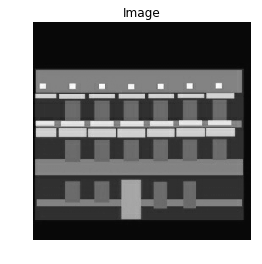

facade real_image:-


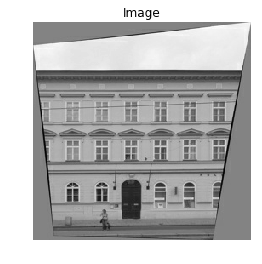

facade generated_image:-


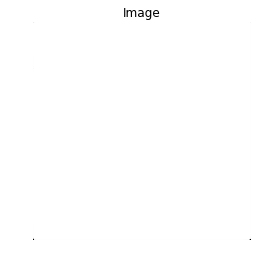

facade label:-


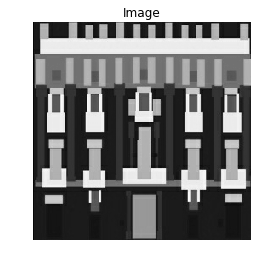

facade real_image:-


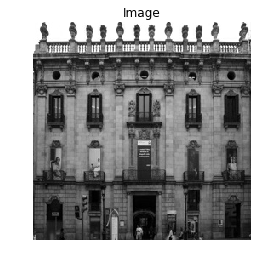

facade generated_image:-


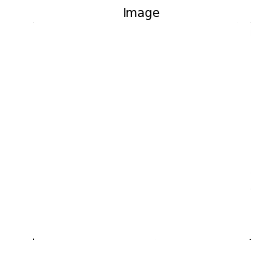

facade label:-


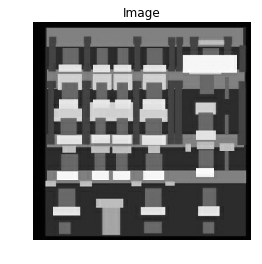

facade real_image:-


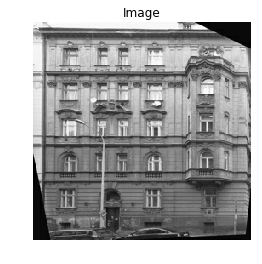

facade generated_image:-


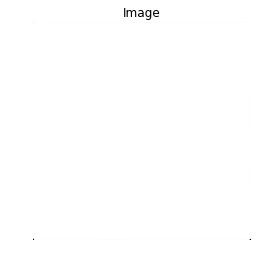

facade label:-


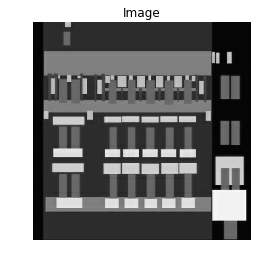

facade real_image:-


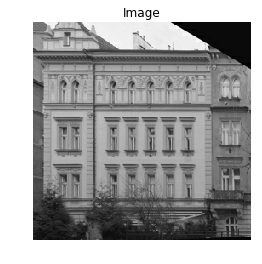

facade generated_image:-


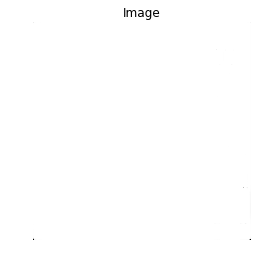

facade label:-


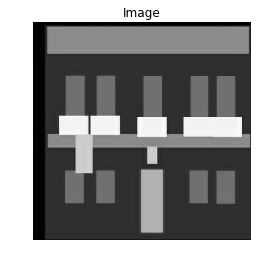

facade real_image:-


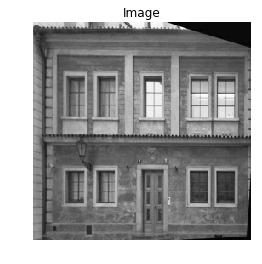

facade generated_image:-


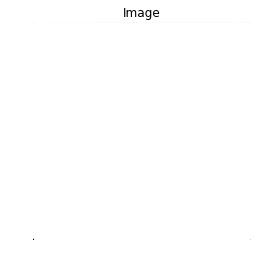

Epoch 11
Batch:0
Discriminator loss: 0.69341713
Generator loss: [12894.454, 128.9376, 0.69287735]
Batch:1
Discriminator loss: 0.6934167
Generator loss: [12784.179, 127.834854, 0.69341713]
Batch:2
Discriminator loss: 0.69341713
Generator loss: [10592.85, 105.92156, 0.69287735]
Batch:3
Discriminator loss: 0.6934167
Generator loss: [10824.574, 108.23881, 0.69341713]
Batch:4
Discriminator loss: 0.69341713
Generator loss: [8691.126, 86.90433, 0.69287735]
Batch:5
Discriminator loss: 0.6934167
Generator loss: [12107.3125, 121.06619, 0.69341713]
Batch:6
Discriminator loss: 0.69341713
Generator loss: [13485.941, 134.85248, 0.69287735]
Batch:7
Discriminator loss: 0.6934167
Generator loss: [12278.125, 122.774315, 0.69341713]
Batch:8
Discriminator loss: 0.69341713
Generator loss: [13569.599, 135.68906, 0.6928773]
Batch:9
Discriminator loss: 0.6934168
Generator loss: [5819.7256, 58.190323, 0.6934171]
Batch:10
Discriminator loss: 0.6934171
Generator loss: [11318.141, 113.17447, 0.6928773]
Batch:11
D

Discriminator loss: 0.6934169
Generator loss: [8245.393, 82.44699, 0.69287723]
Batch:93
Discriminator loss: 0.69341683
Generator loss: [9616.198, 96.15505, 0.6934169]
Batch:94
Discriminator loss: 0.6934169
Generator loss: [11630.251, 116.29558, 0.69287723]
Batch:95
Discriminator loss: 0.69341683
Generator loss: [14189.3, 141.88606, 0.6934169]
Batch:96
Discriminator loss: 0.6934169
Generator loss: [14751.319, 147.50626, 0.69287723]
Batch:97
Discriminator loss: 0.69341683
Generator loss: [15558.72, 155.58026, 0.6934169]
Batch:98
Discriminator loss: 0.6934169
Generator loss: [12953.702, 129.53009, 0.69287723]
Batch:99
Discriminator loss: 0.69341683
Generator loss: [13214.305, 132.13611, 0.6934169]
Batch:100
Discriminator loss: 0.6934169
Generator loss: [8959.0205, 89.58327, 0.69287723]
Batch:101
Discriminator loss: 0.69341683
Generator loss: [12744.689, 127.43996, 0.69341683]
Batch:102
Discriminator loss: 0.69341683
Generator loss: [10909.357, 109.08664, 0.69287723]
Batch:103
Discriminato

Discriminator loss: 0.69341683
Generator loss: [9625.807, 96.25113, 0.69287723]
Batch:183
Discriminator loss: 0.69341683
Generator loss: [9838.449, 98.377556, 0.69341683]
Batch:184
Discriminator loss: 0.69341683
Generator loss: [7713.9146, 77.13222, 0.69287723]
Batch:185
Discriminator loss: 0.69341683
Generator loss: [14094.124, 140.93431, 0.69341683]
Batch:186
Discriminator loss: 0.69341683
Generator loss: [12057.532, 120.56839, 0.69287723]
Batch:187
Discriminator loss: 0.69341683
Generator loss: [6247.3647, 62.466713, 0.69341683]
Batch:188
Discriminator loss: 0.69341683
Generator loss: [14035.131, 140.34438, 0.69287723]
Batch:189
Discriminator loss: 0.69341683
Generator loss: [13865.287, 138.64594, 0.69341683]
Batch:190
Discriminator loss: 0.69341683
Generator loss: [11709.802, 117.09109, 0.69287723]
Batch:191
Discriminator loss: 0.69341683
Generator loss: [10043.151, 100.424576, 0.69341683]
Batch:192
Discriminator loss: 0.69341683
Generator loss: [10369.17, 103.68477, 0.69287723]
Ba

Discriminator loss: 0.69341683
Generator loss: [12058.075, 120.57382, 0.6928773]
Batch:273
Discriminator loss: 0.69341683
Generator loss: [11466.406, 114.65713, 0.69341683]
Batch:274
Discriminator loss: 0.69341683
Generator loss: [12309.643, 123.08949, 0.6928773]
Batch:275
Discriminator loss: 0.69341683
Generator loss: [12713.346, 127.126526, 0.69341683]
Batch:276
Discriminator loss: 0.69341683
Generator loss: [12317.218, 123.165245, 0.6928773]
Batch:277
Discriminator loss: 0.69341683
Generator loss: [11185.928, 111.85234, 0.69341683]
Batch:278
Discriminator loss: 0.69341683
Generator loss: [10985.589, 109.84895, 0.6928773]
Batch:279
Discriminator loss: 0.69341683
Generator loss: [15081.138, 150.80444, 0.69341683]
Batch:280
Discriminator loss: 0.69341683
Generator loss: [10306.463, 103.05769, 0.6928773]
Batch:281
Discriminator loss: 0.69341683
Generator loss: [11760.888, 117.601944, 0.69341683]
Batch:282
Discriminator loss: 0.69341683
Generator loss: [13260.475, 132.59781, 0.6928773]
B

Discriminator loss: 0.69341683
Generator loss: [13552.152, 135.51459, 0.6934166]
Batch:364
Discriminator loss: 0.6934166
Generator loss: [16240.111, 162.39418, 0.6928773]
Batch:365
Discriminator loss: 0.69341683
Generator loss: [11245.715, 112.45022, 0.6934166]
Batch:366
Discriminator loss: 0.6934166
Generator loss: [11966.591, 119.65897, 0.6928773]
Batch:367
Discriminator loss: 0.69341683
Generator loss: [13701.874, 137.01181, 0.6934166]
Batch:368
Discriminator loss: 0.6934166
Generator loss: [11277.03, 112.76337, 0.6928773]
Batch:369
Discriminator loss: 0.69341683
Generator loss: [10850.137, 108.49443, 0.6934166]
Batch:370
Discriminator loss: 0.6934166
Generator loss: [6904.72, 69.040276, 0.6928773]
Batch:371
Discriminator loss: 0.69341683
Generator loss: [12050.526, 120.49833, 0.6934166]
Batch:372
Discriminator loss: 0.6934166
Generator loss: [15059.263, 150.5857, 0.6928773]
Batch:373
Discriminator loss: 0.69341683
Generator loss: [14631.024, 146.30331, 0.6934166]
Batch:374
Discrimi

Discriminator loss: 0.6934167
Generator loss: [9393.567, 93.92874, 0.6934166]
Batch:56
Discriminator loss: 0.6934166
Generator loss: [7517.601, 75.16908, 0.69287735]
Batch:57
Discriminator loss: 0.6934167
Generator loss: [7539.9976, 75.39304, 0.6934166]
Batch:58
Discriminator loss: 0.6934166
Generator loss: [11442.517, 114.41823, 0.69287735]
Batch:59
Discriminator loss: 0.6934167
Generator loss: [10090.341, 100.89648, 0.6934166]
Batch:60
Discriminator loss: 0.6934166
Generator loss: [11478.187, 114.77493, 0.69287735]
Batch:61
Discriminator loss: 0.6934167
Generator loss: [9838.174, 98.37481, 0.6934166]
Batch:62
Discriminator loss: 0.6934166
Generator loss: [10968.653, 109.679596, 0.69287735]
Batch:63
Discriminator loss: 0.6934167
Generator loss: [15174.117, 151.73424, 0.6934166]
Batch:64
Discriminator loss: 0.6934166
Generator loss: [8673.522, 86.72829, 0.69287735]
Batch:65
Discriminator loss: 0.6934167
Generator loss: [11037.082, 110.36389, 0.6934166]
Batch:66
Discriminator loss: 0.69

Discriminator loss: 0.693416
Generator loss: [11626.801, 116.26107, 0.6934166]
Batch:148
Discriminator loss: 0.6934166
Generator loss: [8600.441, 85.99748, 0.69287807]
Batch:149
Discriminator loss: 0.693416
Generator loss: [9876.321, 98.75628, 0.6934166]
Batch:150
Discriminator loss: 0.6934166
Generator loss: [9635.071, 96.34378, 0.69287807]
Batch:151
Discriminator loss: 0.693416
Generator loss: [12292.761, 122.92068, 0.6934166]
Batch:152
Discriminator loss: 0.6934166
Generator loss: [11284.133, 112.8344, 0.69287807]
Batch:153
Discriminator loss: 0.693416
Generator loss: [13036.823, 130.3613, 0.6934166]
Batch:154
Discriminator loss: 0.6934166
Generator loss: [10659.307, 106.586136, 0.69287807]
Batch:155
Discriminator loss: 0.693416
Generator loss: [9042.157, 90.41464, 0.6934166]
Batch:156
Discriminator loss: 0.6934166
Generator loss: [13026.884, 130.2619, 0.69287807]
Batch:157
Discriminator loss: 0.693416
Generator loss: [8384.437, 83.83743, 0.6934166]
Batch:158
Discriminator loss: 0.6

Discriminator loss: 0.6934161
Generator loss: [10866.847, 108.66154, 0.6934165]
Batch:240
Discriminator loss: 0.6934165
Generator loss: [11901.7295, 119.01036, 0.69287795]
Batch:241
Discriminator loss: 0.6934161
Generator loss: [10158.127, 101.57434, 0.6934165]
Batch:242
Discriminator loss: 0.6934165
Generator loss: [12690.497, 126.89804, 0.69287795]
Batch:243
Discriminator loss: 0.6934161
Generator loss: [14669.289, 146.68596, 0.6934165]
Batch:244
Discriminator loss: 0.6934165
Generator loss: [9519.55, 95.18857, 0.69287795]
Batch:245
Discriminator loss: 0.6934161
Generator loss: [9551.304, 95.5061, 0.6934165]
Batch:246
Discriminator loss: 0.6934165
Generator loss: [12435.781, 124.35088, 0.69287795]
Batch:247
Discriminator loss: 0.6934161
Generator loss: [10496.754, 104.96061, 0.6934165]
Batch:248
Discriminator loss: 0.6934165
Generator loss: [12930.128, 129.29434, 0.69287795]
Batch:249
Discriminator loss: 0.6934161
Generator loss: [14423.141, 144.22447, 0.6934165]
Batch:250
Discrimina

Discriminator loss: 0.6934161
Generator loss: [11436.769, 114.36075, 0.6928778]
Batch:331
Discriminator loss: 0.69341624
Generator loss: [12104.839, 121.04146, 0.6934161]
Batch:332
Discriminator loss: 0.6934161
Generator loss: [9513.359, 95.12666, 0.6928778]
Batch:333
Discriminator loss: 0.69341624
Generator loss: [13337.232, 133.36539, 0.6934161]
Batch:334
Discriminator loss: 0.6934161
Generator loss: [11519.903, 115.1921, 0.6928778]
Batch:335
Discriminator loss: 0.69341624
Generator loss: [7683.3, 76.826065, 0.6934161]
Batch:336
Discriminator loss: 0.6934161
Generator loss: [11215.545, 112.14851, 0.6928778]
Batch:337
Discriminator loss: 0.69341624
Generator loss: [10923.951, 109.232574, 0.6934161]
Batch:338
Discriminator loss: 0.6934161
Generator loss: [12006.613, 120.059204, 0.6928778]
Batch:339
Discriminator loss: 0.69341624
Generator loss: [12366.199, 123.65506, 0.6934161]
Batch:340
Discriminator loss: 0.6934161
Generator loss: [13025.727, 130.25034, 0.6928778]
Batch:341
Discrimin

Discriminator loss: 0.6934161
Generator loss: [11995.301, 119.946075, 0.6928778]
Batch:23
Discriminator loss: 0.69341624
Generator loss: [8227.567, 82.26874, 0.6934161]
Batch:24
Discriminator loss: 0.6934161
Generator loss: [11520.116, 115.19423, 0.6928778]
Batch:25
Discriminator loss: 0.69341624
Generator loss: [11280.91, 112.80217, 0.6934161]
Batch:26
Discriminator loss: 0.6934161
Generator loss: [12732.301, 127.31608, 0.6928778]
Batch:27
Discriminator loss: 0.69341624
Generator loss: [11006.841, 110.06148, 0.6934161]
Batch:28
Discriminator loss: 0.6934161
Generator loss: [10463.525, 104.62832, 0.6928778]
Batch:29
Discriminator loss: 0.69341624
Generator loss: [15709.892, 157.09198, 0.6934161]
Batch:30
Discriminator loss: 0.6934161
Generator loss: [13752.299, 137.51605, 0.6928778]
Batch:31
Discriminator loss: 0.69341624
Generator loss: [9786.4, 97.85707, 0.6934161]
Batch:32
Discriminator loss: 0.6934161
Generator loss: [11266.969, 112.66275, 0.6928778]
Batch:33
Discriminator loss: 0.

Discriminator loss: 0.6934161
Generator loss: [9972.477, 99.717834, 0.69287795]
Batch:115
Discriminator loss: 0.6934161
Generator loss: [11916.742, 119.160484, 0.6934161]
Batch:116
Discriminator loss: 0.6934161
Generator loss: [12223.409, 122.22716, 0.69287795]
Batch:117
Discriminator loss: 0.6934161
Generator loss: [12970.246, 129.69553, 0.6934161]
Batch:118
Discriminator loss: 0.6934161
Generator loss: [10716.85, 107.16156, 0.69287795]
Batch:119
Discriminator loss: 0.6934161
Generator loss: [12871.923, 128.7123, 0.6934161]
Batch:120
Discriminator loss: 0.6934161
Generator loss: [14811.878, 148.11185, 0.69287795]
Batch:121
Discriminator loss: 0.6934161
Generator loss: [9339.829, 93.39136, 0.6934161]
Batch:122
Discriminator loss: 0.6934161
Generator loss: [13791.372, 137.90678, 0.69287795]
Batch:123
Discriminator loss: 0.6934161
Generator loss: [11509.47, 115.08776, 0.6934161]
Batch:124
Discriminator loss: 0.6934161
Generator loss: [13902.331, 139.01637, 0.69287795]
Batch:125
Discrimin

Discriminator loss: 0.6934161
Generator loss: [7861.8135, 78.611206, 0.692878]
Batch:207
Discriminator loss: 0.6934161
Generator loss: [10682.0625, 106.81369, 0.6934161]
Batch:208
Discriminator loss: 0.6934161
Generator loss: [10211.1455, 102.10452, 0.692878]
Batch:209
Discriminator loss: 0.6934161
Generator loss: [9732.415, 97.317215, 0.6934161]
Batch:210
Discriminator loss: 0.6934161
Generator loss: [13113.975, 131.13281, 0.692878]
Batch:211
Discriminator loss: 0.6934161
Generator loss: [10549.483, 105.4879, 0.6934161]
Batch:212
Discriminator loss: 0.6934161
Generator loss: [10216.052, 102.15358, 0.692878]
Batch:213
Discriminator loss: 0.6934161
Generator loss: [8975.965, 89.752716, 0.6934161]
Batch:214
Discriminator loss: 0.6934161
Generator loss: [12875.257, 128.74564, 0.692878]
Batch:215
Discriminator loss: 0.6934161
Generator loss: [5974.869, 59.74176, 0.6934161]
Batch:216
Discriminator loss: 0.6934161
Generator loss: [11099.002, 110.983086, 0.692878]
Batch:217
Discriminator loss

Discriminator loss: 0.6934161
Generator loss: [13533.982, 135.33289, 0.692878]
Batch:299
Discriminator loss: 0.6934161
Generator loss: [12544.156, 125.43463, 0.6934161]
Batch:300
Discriminator loss: 0.6934161
Generator loss: [10811.583, 108.108894, 0.692878]
Batch:301
Discriminator loss: 0.6934161
Generator loss: [14525.025, 145.24332, 0.6934161]
Batch:302
Discriminator loss: 0.6934161
Generator loss: [11731.374, 117.30681, 0.692878]
Batch:303
Discriminator loss: 0.6934161
Generator loss: [9430.528, 94.29835, 0.6934161]
Batch:304
Discriminator loss: 0.6934161
Generator loss: [10920.32, 109.19627, 0.692878]
Batch:305
Discriminator loss: 0.6934161
Generator loss: [13921.361, 139.20668, 0.6934161]
Batch:306
Discriminator loss: 0.6934161
Generator loss: [12343.624, 123.429306, 0.692878]
Batch:307
Discriminator loss: 0.6934161
Generator loss: [12133.816, 121.33123, 0.6934161]
Batch:308
Discriminator loss: 0.6934161
Generator loss: [14461.552, 144.60858, 0.692878]
Batch:309
Discriminator los

Discriminator loss: 0.6934161
Generator loss: [11822.822, 118.22129, 0.692878]
Batch:391
Discriminator loss: 0.69341606
Generator loss: [11357.455, 113.56762, 0.6934161]
Batch:392
Discriminator loss: 0.6934161
Generator loss: [9178.194, 91.77501, 0.692878]
Batch:393
Discriminator loss: 0.69341606
Generator loss: [9631.823, 96.3113, 0.6934161]
Batch:394
Discriminator loss: 0.6934161
Generator loss: [10132.599, 101.31905, 0.692878]
Batch:395
Discriminator loss: 0.69341606
Generator loss: [8311.045, 83.103516, 0.6934161]
Batch:396
Discriminator loss: 0.6934161
Generator loss: [11984.566, 119.83873, 0.692878]
Batch:397
Discriminator loss: 0.69341606
Generator loss: [6803.873, 68.0318, 0.6934161]
Batch:398
Discriminator loss: 0.6934161
Generator loss: [13870.121, 138.69427, 0.692878]
Batch:399
Discriminator loss: 0.69341606
Generator loss: [9516.805, 95.16111, 0.6934161]
Epoch 14
Batch:0
Discriminator loss: 0.6934161
Generator loss: [12894.454, 128.9376, 0.692878]
Batch:1
Discriminator loss

Discriminator loss: 0.69341606
Generator loss: [13397.91, 133.97217, 0.6934161]
Batch:84
Discriminator loss: 0.6934161
Generator loss: [10464.569, 104.638756, 0.692878]
Batch:85
Discriminator loss: 0.69341606
Generator loss: [9105.674, 91.049805, 0.6934161]
Batch:86
Discriminator loss: 0.6934161
Generator loss: [11456.094, 114.55401, 0.692878]
Batch:87
Discriminator loss: 0.69341606
Generator loss: [6797.788, 67.97095, 0.6934161]
Batch:88
Discriminator loss: 0.6934161
Generator loss: [9909.858, 99.09165, 0.692878]
Batch:89
Discriminator loss: 0.69341606
Generator loss: [13380.207, 133.79514, 0.6934161]
Batch:90
Discriminator loss: 0.6934161
Generator loss: [10166.296, 101.65602, 0.692878]
Batch:91
Discriminator loss: 0.69341606
Generator loss: [13286.469, 132.85776, 0.6934161]
Batch:92
Discriminator loss: 0.6934161
Generator loss: [8245.393, 82.44699, 0.692878]
Batch:93
Discriminator loss: 0.69341606
Generator loss: [9616.198, 96.15505, 0.6934161]
Batch:94
Discriminator loss: 0.6934161

Discriminator loss: 0.6934161
Generator loss: [12488.638, 124.87945, 0.69341564]
Batch:176
Discriminator loss: 0.69341564
Generator loss: [13382.081, 133.81387, 0.692878]
Batch:177
Discriminator loss: 0.6934161
Generator loss: [11974.315, 119.73622, 0.6934157]
Batch:178
Discriminator loss: 0.6934157
Generator loss: [12938.69, 129.37997, 0.692878]
Batch:179
Discriminator loss: 0.6934161
Generator loss: [10592.13, 105.91437, 0.6934157]
Batch:180
Discriminator loss: 0.6934157
Generator loss: [13453.861, 134.53168, 0.692878]
Batch:181
Discriminator loss: 0.6934161
Generator loss: [10353.493, 103.528, 0.6934157]
Batch:182
Discriminator loss: 0.6934157
Generator loss: [9625.807, 96.25113, 0.692878]
Batch:183
Discriminator loss: 0.6934161
Generator loss: [9838.449, 98.377556, 0.6934157]
Batch:184
Discriminator loss: 0.6934157
Generator loss: [7713.9146, 77.13222, 0.692878]
Batch:185
Discriminator loss: 0.6934161
Generator loss: [14094.124, 140.93431, 0.6934157]
Batch:186
Discriminator loss: 0

Discriminator loss: 0.69341606
Generator loss: [13201.957, 132.01263, 0.69341576]
Batch:268
Discriminator loss: 0.69341576
Generator loss: [12710.114, 127.09421, 0.692878]
Batch:269
Discriminator loss: 0.69341606
Generator loss: [14631.404, 146.30711, 0.69341576]
Batch:270
Discriminator loss: 0.69341576
Generator loss: [9872.333, 98.71639, 0.692878]
Batch:271
Discriminator loss: 0.69341606
Generator loss: [5164.1807, 51.634872, 0.69341576]
Batch:272
Discriminator loss: 0.69341576
Generator loss: [12058.075, 120.57382, 0.692878]
Batch:273
Discriminator loss: 0.69341606
Generator loss: [11466.406, 114.65713, 0.69341576]
Batch:274
Discriminator loss: 0.69341576
Generator loss: [12309.643, 123.08949, 0.692878]
Batch:275
Discriminator loss: 0.69341606
Generator loss: [12713.346, 127.126526, 0.69341576]
Batch:276
Discriminator loss: 0.69341576
Generator loss: [12317.218, 123.165245, 0.692878]
Batch:277
Discriminator loss: 0.69341606
Generator loss: [11185.928, 111.85234, 0.69341576]
Batch:27

Discriminator loss: 0.69341576
Generator loss: [12083.306, 120.82612, 0.692878]
Batch:359
Discriminator loss: 0.69341606
Generator loss: [9939.907, 99.392136, 0.69341576]
Batch:360
Discriminator loss: 0.69341576
Generator loss: [10639.528, 106.38835, 0.692878]
Batch:361
Discriminator loss: 0.69341606
Generator loss: [12292.588, 122.918945, 0.69341576]
Batch:362
Discriminator loss: 0.69341576
Generator loss: [15011.094, 150.104, 0.692878]
Batch:363
Discriminator loss: 0.69341606
Generator loss: [13552.152, 135.51459, 0.69341576]
Batch:364
Discriminator loss: 0.69341576
Generator loss: [16240.111, 162.39418, 0.692878]
Batch:365
Discriminator loss: 0.69341606
Generator loss: [11245.715, 112.45022, 0.69341576]
Batch:366
Discriminator loss: 0.69341576
Generator loss: [11966.591, 119.65897, 0.692878]
Batch:367
Discriminator loss: 0.69341606
Generator loss: [13701.874, 137.01181, 0.69341576]
Batch:368
Discriminator loss: 0.69341576
Generator loss: [11277.03, 112.76337, 0.692878]
Batch:369
Dis

Discriminator loss: 0.693416
Generator loss: [15213.349, 152.12656, 0.6928782]
Batch:51
Discriminator loss: 0.6934159
Generator loss: [10709.756, 107.09062, 0.693416]
Batch:52
Discriminator loss: 0.693416
Generator loss: [12413.43, 124.127365, 0.6928782]
Batch:53
Discriminator loss: 0.6934159
Generator loss: [15823.756, 158.23062, 0.693416]
Batch:54
Discriminator loss: 0.693416
Generator loss: [10777.454, 107.76761, 0.6928782]
Batch:55
Discriminator loss: 0.6934159
Generator loss: [9393.567, 93.92874, 0.693416]
Batch:56
Discriminator loss: 0.693416
Generator loss: [7517.601, 75.16908, 0.6928782]
Batch:57
Discriminator loss: 0.6934159
Generator loss: [7539.9976, 75.39304, 0.693416]
Batch:58
Discriminator loss: 0.693416
Generator loss: [11442.517, 114.41823, 0.6928782]
Batch:59
Discriminator loss: 0.6934159
Generator loss: [10090.341, 100.89648, 0.693416]
Batch:60
Discriminator loss: 0.693416
Generator loss: [11478.187, 114.77493, 0.6928782]
Batch:61
Discriminator loss: 0.6934159
Generat

Discriminator loss: 0.693416
Generator loss: [10798.785, 107.98092, 0.6928782]
Batch:145
Discriminator loss: 0.6934159
Generator loss: [12666.083, 126.65389, 0.693416]
Batch:146
Discriminator loss: 0.693416
Generator loss: [12006.0625, 120.053696, 0.6928782]
Batch:147
Discriminator loss: 0.6934159
Generator loss: [11626.801, 116.26107, 0.693416]
Batch:148
Discriminator loss: 0.693416
Generator loss: [8600.441, 85.99748, 0.6928782]
Batch:149
Discriminator loss: 0.6934159
Generator loss: [9876.321, 98.75628, 0.693416]
Batch:150
Discriminator loss: 0.693416
Generator loss: [9635.071, 96.34378, 0.6928782]
Batch:151
Discriminator loss: 0.6934159
Generator loss: [12292.761, 122.92068, 0.693416]
Batch:152
Discriminator loss: 0.693416
Generator loss: [11284.133, 112.8344, 0.6928782]
Batch:153
Discriminator loss: 0.6934159
Generator loss: [13036.823, 130.3613, 0.693416]
Batch:154
Discriminator loss: 0.693416
Generator loss: [10659.307, 106.586136, 0.6928782]
Batch:155
Discriminator loss: 0.6934

Discriminator loss: 0.6934159
Generator loss: [11681.612, 116.80919, 0.693416]
Batch:238
Discriminator loss: 0.693416
Generator loss: [11685.513, 116.84819, 0.6928782]
Batch:239
Discriminator loss: 0.6934159
Generator loss: [10866.847, 108.66154, 0.693416]
Batch:240
Discriminator loss: 0.693416
Generator loss: [11901.7295, 119.01036, 0.6928782]
Batch:241
Discriminator loss: 0.6934159
Generator loss: [10158.127, 101.57434, 0.693416]
Batch:242
Discriminator loss: 0.693416
Generator loss: [12690.497, 126.89804, 0.6928782]
Batch:243
Discriminator loss: 0.6934159
Generator loss: [14669.289, 146.68596, 0.693416]
Batch:244
Discriminator loss: 0.693416
Generator loss: [9519.55, 95.18857, 0.6928782]
Batch:245
Discriminator loss: 0.6934159
Generator loss: [9551.304, 95.5061, 0.693416]
Batch:246
Discriminator loss: 0.693416
Generator loss: [12435.781, 124.35088, 0.6928782]
Batch:247
Discriminator loss: 0.6934159
Generator loss: [10496.754, 104.96061, 0.693416]
Batch:248
Discriminator loss: 0.6934

Discriminator loss: 0.693416
Generator loss: [11436.769, 114.36075, 0.6928782]
Batch:331
Discriminator loss: 0.6934159
Generator loss: [12104.839, 121.04146, 0.693416]
Batch:332
Discriminator loss: 0.693416
Generator loss: [9513.359, 95.12666, 0.6928782]
Batch:333
Discriminator loss: 0.6934159
Generator loss: [13337.232, 133.36539, 0.693416]
Batch:334
Discriminator loss: 0.693416
Generator loss: [11519.903, 115.1921, 0.6928782]
Batch:335
Discriminator loss: 0.6934159
Generator loss: [7683.3, 76.826065, 0.693416]
Batch:336
Discriminator loss: 0.693416
Generator loss: [11215.545, 112.14851, 0.6928782]
Batch:337
Discriminator loss: 0.6934159
Generator loss: [10923.951, 109.232574, 0.693416]
Batch:338
Discriminator loss: 0.693416
Generator loss: [12006.613, 120.059204, 0.6928782]
Batch:339
Discriminator loss: 0.6934159
Generator loss: [12366.199, 123.65506, 0.693416]
Batch:340
Discriminator loss: 0.693416
Generator loss: [13025.727, 130.25034, 0.6928782]
Batch:341
Discriminator loss: 0.693

Discriminator loss: 0.69341564
Generator loss: [11995.301, 119.946075, 0.69287854]
Batch:23
Discriminator loss: 0.6934155
Generator loss: [8227.567, 82.26874, 0.69341564]
Batch:24
Discriminator loss: 0.69341564
Generator loss: [11520.116, 115.19423, 0.69287854]
Batch:25
Discriminator loss: 0.6934155
Generator loss: [11280.91, 112.80217, 0.69341564]
Batch:26
Discriminator loss: 0.69341564
Generator loss: [12732.301, 127.31608, 0.69287854]
Batch:27
Discriminator loss: 0.6934155
Generator loss: [11006.841, 110.06148, 0.69341564]
Batch:28
Discriminator loss: 0.69341564
Generator loss: [10463.525, 104.62832, 0.69287854]
Batch:29
Discriminator loss: 0.6934155
Generator loss: [15709.892, 157.09198, 0.69341564]
Batch:30
Discriminator loss: 0.69341564
Generator loss: [13752.299, 137.51605, 0.69287854]
Batch:31
Discriminator loss: 0.6934155
Generator loss: [9786.4, 97.85707, 0.69341564]
Batch:32
Discriminator loss: 0.69341564
Generator loss: [11266.969, 112.66275, 0.69287854]
Batch:33
Discrimina

Discriminator loss: 0.6934155
Generator loss: [14592.806, 145.92113, 0.69341564]
Batch:114
Discriminator loss: 0.69341564
Generator loss: [9972.477, 99.717834, 0.69287854]
Batch:115
Discriminator loss: 0.6934155
Generator loss: [11916.742, 119.160484, 0.69341564]
Batch:116
Discriminator loss: 0.69341564
Generator loss: [12223.409, 122.22716, 0.69287854]
Batch:117
Discriminator loss: 0.6934155
Generator loss: [12970.246, 129.69553, 0.69341564]
Batch:118
Discriminator loss: 0.69341564
Generator loss: [10716.85, 107.16156, 0.69287854]
Batch:119
Discriminator loss: 0.6934155
Generator loss: [12871.923, 128.7123, 0.69341564]
Batch:120
Discriminator loss: 0.69341564
Generator loss: [14811.878, 148.11185, 0.69287854]
Batch:121
Discriminator loss: 0.6934155
Generator loss: [9339.829, 93.39136, 0.69341564]
Batch:122
Discriminator loss: 0.69341564
Generator loss: [13791.372, 137.90678, 0.69287854]
Batch:123
Discriminator loss: 0.6934155
Generator loss: [11509.47, 115.08776, 0.69341564]
Batch:124

Discriminator loss: 0.69341564
Generator loss: [9873.143, 98.72449, 0.69287854]
Batch:205
Discriminator loss: 0.6934155
Generator loss: [16230.097, 162.29404, 0.69341564]
Batch:206
Discriminator loss: 0.69341564
Generator loss: [7861.8135, 78.611206, 0.69287854]
Batch:207
Discriminator loss: 0.6934155
Generator loss: [10682.0625, 106.81369, 0.69341564]
Batch:208
Discriminator loss: 0.69341564
Generator loss: [10211.1455, 102.10452, 0.69287854]
Batch:209
Discriminator loss: 0.6934155
Generator loss: [9732.415, 97.317215, 0.69341564]
Batch:210
Discriminator loss: 0.69341564
Generator loss: [13113.975, 131.13281, 0.69287854]
Batch:211
Discriminator loss: 0.6934155
Generator loss: [10549.483, 105.4879, 0.69341564]
Batch:212
Discriminator loss: 0.69341564
Generator loss: [10216.052, 102.15358, 0.69287854]
Batch:213
Discriminator loss: 0.6934155
Generator loss: [8975.965, 89.752716, 0.6934156]
Batch:214
Discriminator loss: 0.6934156
Generator loss: [12875.257, 128.74564, 0.69287854]
Batch:21

Discriminator loss: 0.6934155
Generator loss: [11181.246, 111.80553, 0.6934156]
Batch:296
Discriminator loss: 0.6934156
Generator loss: [10848.673, 108.4798, 0.69287854]
Batch:297
Discriminator loss: 0.6934155
Generator loss: [9805.638, 98.049446, 0.6934156]
Batch:298
Discriminator loss: 0.6934156
Generator loss: [13533.982, 135.33289, 0.69287854]
Batch:299
Discriminator loss: 0.6934155
Generator loss: [12544.156, 125.43463, 0.6934156]
Batch:300
Discriminator loss: 0.6934156
Generator loss: [10811.583, 108.108894, 0.69287854]
Batch:301
Discriminator loss: 0.6934155
Generator loss: [14525.025, 145.24332, 0.6934156]
Batch:302
Discriminator loss: 0.6934156
Generator loss: [11731.374, 117.30681, 0.69287854]
Batch:303
Discriminator loss: 0.6934155
Generator loss: [9430.528, 94.29835, 0.6934156]
Batch:304
Discriminator loss: 0.6934156
Generator loss: [10920.32, 109.19627, 0.69287854]
Batch:305
Discriminator loss: 0.6934155
Generator loss: [13921.361, 139.20668, 0.6934156]
Batch:306
Discrimin

Discriminator loss: 0.6934156
Generator loss: [8665.667, 86.649734, 0.69287854]
Batch:387
Discriminator loss: 0.6934155
Generator loss: [14045.045, 140.44351, 0.6934156]
Batch:388
Discriminator loss: 0.6934156
Generator loss: [9620.222, 96.19528, 0.69287854]
Batch:389
Discriminator loss: 0.6934155
Generator loss: [7807.082, 78.06389, 0.6934156]
Batch:390
Discriminator loss: 0.6934156
Generator loss: [11822.822, 118.22129, 0.69287854]
Batch:391
Discriminator loss: 0.6934155
Generator loss: [11357.455, 113.56762, 0.6934156]
Batch:392
Discriminator loss: 0.6934156
Generator loss: [9178.194, 91.77501, 0.69287854]
Batch:393
Discriminator loss: 0.6934155
Generator loss: [9631.823, 96.3113, 0.6934156]
Batch:394
Discriminator loss: 0.6934156
Generator loss: [10132.599, 101.31905, 0.69287854]
Batch:395
Discriminator loss: 0.6934155
Generator loss: [8311.045, 83.103516, 0.6934156]
Batch:396
Discriminator loss: 0.6934156
Generator loss: [11984.566, 119.83873, 0.69287854]
Batch:397
Discriminator l

Discriminator loss: 0.6934156
Generator loss: [13443.098, 134.42404, 0.69287854]
Batch:79
Discriminator loss: 0.6934155
Generator loss: [10291.457, 102.90764, 0.6934156]
Batch:80
Discriminator loss: 0.6934156
Generator loss: [12187.142, 121.86449, 0.69287854]
Batch:81
Discriminator loss: 0.6934155
Generator loss: [11855.749, 118.55056, 0.6934156]
Batch:82
Discriminator loss: 0.6934156
Generator loss: [9665.884, 96.65191, 0.69287854]
Batch:83
Discriminator loss: 0.6934155
Generator loss: [13397.91, 133.97217, 0.6934156]
Batch:84
Discriminator loss: 0.6934156
Generator loss: [10464.569, 104.638756, 0.69287854]
Batch:85
Discriminator loss: 0.6934155
Generator loss: [9105.674, 91.049805, 0.6934156]
Batch:86
Discriminator loss: 0.6934156
Generator loss: [11456.094, 114.55401, 0.69287854]
Batch:87
Discriminator loss: 0.6934155
Generator loss: [6797.788, 67.97095, 0.6934156]
Batch:88
Discriminator loss: 0.6934156
Generator loss: [9909.858, 99.09165, 0.69287854]
Batch:89
Discriminator loss: 0.

Discriminator loss: 0.6934154
Generator loss: [8212.887, 82.12193, 0.69287854]
Batch:171
Discriminator loss: 0.6934155
Generator loss: [11508.57, 115.078766, 0.6934154]
Batch:172
Discriminator loss: 0.6934154
Generator loss: [9128.604, 91.279106, 0.69287854]
Batch:173
Discriminator loss: 0.6934155
Generator loss: [11630.289, 116.29596, 0.6934154]
Batch:174
Discriminator loss: 0.6934154
Generator loss: [12603.74, 126.03047, 0.69287854]
Batch:175
Discriminator loss: 0.6934155
Generator loss: [12488.638, 124.87945, 0.6934154]
Batch:176
Discriminator loss: 0.6934154
Generator loss: [13382.081, 133.81387, 0.69287854]
Batch:177
Discriminator loss: 0.6934155
Generator loss: [11974.315, 119.73622, 0.6934154]
Batch:178
Discriminator loss: 0.6934154
Generator loss: [12938.69, 129.37997, 0.69287854]
Batch:179
Discriminator loss: 0.6934155
Generator loss: [10592.13, 105.91437, 0.6934154]
Batch:180
Discriminator loss: 0.6934154
Generator loss: [13453.861, 134.53168, 0.69287854]
Batch:181
Discrimina

Discriminator loss: 0.6934155
Generator loss: [10743.27, 107.42576, 0.6934154]
Batch:262
Discriminator loss: 0.6934154
Generator loss: [12578.662, 125.779686, 0.69287854]
Batch:263
Discriminator loss: 0.6934155
Generator loss: [9482.542, 94.81849, 0.6934154]
Batch:264
Discriminator loss: 0.6934154
Generator loss: [9340.809, 93.40115, 0.69287854]
Batch:265
Discriminator loss: 0.6934155
Generator loss: [6548.687, 65.479935, 0.6934154]
Batch:266
Discriminator loss: 0.6934154
Generator loss: [9593.76, 95.930664, 0.69287854]
Batch:267
Discriminator loss: 0.6934155
Generator loss: [13201.957, 132.01263, 0.6934154]
Batch:268
Discriminator loss: 0.6934154
Generator loss: [12710.114, 127.09421, 0.69287854]
Batch:269
Discriminator loss: 0.6934155
Generator loss: [14631.404, 146.30711, 0.6934154]
Batch:270
Discriminator loss: 0.6934154
Generator loss: [9872.333, 98.71639, 0.69287854]
Batch:271
Discriminator loss: 0.6934155
Generator loss: [5164.1807, 51.634872, 0.6934154]
Batch:272
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [8898.547, 88.97853, 0.69287866]
Batch:353
Discriminator loss: 0.6934154
Generator loss: [12589.422, 125.88728, 0.6934154]
Batch:354
Discriminator loss: 0.6934154
Generator loss: [7247.6274, 72.469345, 0.69287866]
Batch:355
Discriminator loss: 0.6934154
Generator loss: [9871.624, 98.709305, 0.6934154]
Batch:356
Discriminator loss: 0.6934154
Generator loss: [12002.514, 120.0182, 0.69287866]
Batch:357
Discriminator loss: 0.6934154
Generator loss: [11864.585, 118.638916, 0.6934154]
Batch:358
Discriminator loss: 0.6934154
Generator loss: [12083.306, 120.82612, 0.69287866]
Batch:359
Discriminator loss: 0.6934154
Generator loss: [9939.907, 99.392136, 0.6934154]
Batch:360
Discriminator loss: 0.6934154
Generator loss: [10639.528, 106.38835, 0.69287866]
Batch:361
Discriminator loss: 0.6934154
Generator loss: [12292.588, 122.918945, 0.6934154]
Batch:362
Discriminator loss: 0.6934154
Generator loss: [15011.094, 150.104, 0.69287866]
Batch:363
Discrimin

Discriminator loss: 0.6934154
Generator loss: [9747.235, 97.46542, 0.69287866]
Batch:45
Discriminator loss: 0.6934154
Generator loss: [13570.773, 135.7008, 0.6934154]
Batch:46
Discriminator loss: 0.6934154
Generator loss: [14218.532, 142.17839, 0.69287866]
Batch:47
Discriminator loss: 0.6934154
Generator loss: [10321.741, 103.21048, 0.6934154]
Batch:48
Discriminator loss: 0.6934154
Generator loss: [10682.349, 106.81655, 0.69287866]
Batch:49
Discriminator loss: 0.6934154
Generator loss: [11656.235, 116.55542, 0.6934154]
Batch:50
Discriminator loss: 0.6934154
Generator loss: [15213.349, 152.12656, 0.69287866]
Batch:51
Discriminator loss: 0.6934154
Generator loss: [10709.756, 107.09062, 0.6934154]
Batch:52
Discriminator loss: 0.6934154
Generator loss: [12413.43, 124.127365, 0.69287866]
Batch:53
Discriminator loss: 0.6934154
Generator loss: [15823.756, 158.23062, 0.6934154]
Batch:54
Discriminator loss: 0.6934154
Generator loss: [10777.454, 107.76761, 0.69287866]
Batch:55
Discriminator loss

Discriminator loss: 0.6934154
Generator loss: [8925.878, 89.25185, 0.69287866]
Batch:137
Discriminator loss: 0.6934154
Generator loss: [9830.94, 98.302475, 0.6934154]
Batch:138
Discriminator loss: 0.6934154
Generator loss: [8355.251, 83.54558, 0.69287866]
Batch:139
Discriminator loss: 0.6934154
Generator loss: [11522.685, 115.21991, 0.6934154]
Batch:140
Discriminator loss: 0.6934154
Generator loss: [8131.2534, 81.3056, 0.69287866]
Batch:141
Discriminator loss: 0.6934154
Generator loss: [9247.565, 92.46872, 0.6934154]
Batch:142
Discriminator loss: 0.6934154
Generator loss: [12408.072, 124.07379, 0.69287866]
Batch:143
Discriminator loss: 0.6934154
Generator loss: [9850.207, 98.49514, 0.6934154]
Batch:144
Discriminator loss: 0.6934154
Generator loss: [10798.785, 107.98092, 0.69287866]
Batch:145
Discriminator loss: 0.6934154
Generator loss: [12666.083, 126.65389, 0.6934154]
Batch:146
Discriminator loss: 0.6934154
Generator loss: [12006.0625, 120.053696, 0.69287866]
Batch:147
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [8857.528, 88.56835, 0.69287866]
Batch:229
Discriminator loss: 0.6934154
Generator loss: [11804.773, 118.0408, 0.6934154]
Batch:230
Discriminator loss: 0.6934154
Generator loss: [12160.356, 121.59663, 0.69287866]
Batch:231
Discriminator loss: 0.6934154
Generator loss: [10137.676, 101.36982, 0.6934154]
Batch:232
Discriminator loss: 0.6934154
Generator loss: [13868.315, 138.67622, 0.69287866]
Batch:233
Discriminator loss: 0.6934154
Generator loss: [10070.654, 100.69961, 0.6934154]
Batch:234
Discriminator loss: 0.6934154
Generator loss: [10918.993, 109.183, 0.69287866]
Batch:235
Discriminator loss: 0.6934154
Generator loss: [8906.887, 89.061935, 0.6934154]
Batch:236
Discriminator loss: 0.6934154
Generator loss: [12403.967, 124.03273, 0.69287866]
Batch:237
Discriminator loss: 0.6934154
Generator loss: [11681.612, 116.80919, 0.6934154]
Batch:238
Discriminator loss: 0.6934154
Generator loss: [11685.513, 116.84819, 0.69287866]
Batch:239
Discrimina

Discriminator loss: 0.6934154
Generator loss: [13654.673, 136.5398, 0.6934154]
Batch:320
Discriminator loss: 0.6934154
Generator loss: [9101.648, 91.00955, 0.69287866]
Batch:321
Discriminator loss: 0.6934154
Generator loss: [12749.364, 127.48671, 0.6934154]
Batch:322
Discriminator loss: 0.6934154
Generator loss: [12009.526, 120.08833, 0.69287866]
Batch:323
Discriminator loss: 0.6934154
Generator loss: [11606.613, 116.059204, 0.6934154]
Batch:324
Discriminator loss: 0.6934154
Generator loss: [10787.111, 107.86418, 0.69287866]
Batch:325
Discriminator loss: 0.6934154
Generator loss: [10993.518, 109.92824, 0.6934154]
Batch:326
Discriminator loss: 0.6934154
Generator loss: [10653.842, 106.53149, 0.69287866]
Batch:327
Discriminator loss: 0.6934154
Generator loss: [9301.949, 93.01256, 0.6934154]
Batch:328
Discriminator loss: 0.6934154
Generator loss: [13223.844, 132.2315, 0.69287866]
Batch:329
Discriminator loss: 0.6934154
Generator loss: [14201.215, 142.00522, 0.6934154]
Batch:330
Discrimina

Discriminator loss: 0.6934154
Generator loss: [10004.937, 100.04243, 0.6934154]
Batch:12
Discriminator loss: 0.6934154
Generator loss: [13520.6, 135.19907, 0.69287866]
Batch:13
Discriminator loss: 0.6934154
Generator loss: [11901.843, 119.01149, 0.6934154]
Batch:14
Discriminator loss: 0.6934154
Generator loss: [12942.008, 129.41315, 0.69287866]
Batch:15
Discriminator loss: 0.6934154
Generator loss: [9310.036, 93.09343, 0.6934154]
Batch:16
Discriminator loss: 0.6934154
Generator loss: [10741.136, 107.40443, 0.69287866]
Batch:17
Discriminator loss: 0.6934154
Generator loss: [14974.503, 149.7381, 0.6934154]
Batch:18
Discriminator loss: 0.6934154
Generator loss: [9818.367, 98.17674, 0.69287866]
Batch:19
Discriminator loss: 0.6934154
Generator loss: [9385.529, 93.84836, 0.6934154]
Batch:20
Discriminator loss: 0.6934154
Generator loss: [11725.566, 117.24873, 0.69287866]
Batch:21
Discriminator loss: 0.6934154
Generator loss: [13615.48, 136.14787, 0.6934154]
Batch:22
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934154]
Batch:104
Discriminator loss: 0.6934154
Generator loss: [13184.938, 131.84245, 0.69287866]
Batch:105
Discriminator loss: 0.6934154
Generator loss: [12644.115, 126.43422, 0.6934154]
Batch:106
Discriminator loss: 0.6934154
Generator loss: [8721.229, 87.20535, 0.69287866]
Batch:107
Discriminator loss: 0.6934154
Generator loss: [9711.675, 97.10982, 0.6934154]
Batch:108
Discriminator loss: 0.6934154
Generator loss: [13899.012, 138.98318, 0.69287866]
Batch:109
Discriminator loss: 0.6934154
Generator loss: [11037.852, 110.37158, 0.6934154]
Batch:110
Discriminator loss: 0.6934154
Generator loss: [10671.885, 106.711914, 0.69287866]
Batch:111
Discriminator loss: 0.6934154
Generator loss: [12740.269, 127.39575, 0.6934154]
Batch:112
Discriminator loss: 0.6934154
Generator loss: [10783.767, 107.830734, 0.69287866]
Batch:113
Discriminator loss: 0.6934154
Generator loss: [14592.806, 145.92113, 0.6934154]
Batch:114
Discrimi

Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934154]
Batch:196
Discriminator loss: 0.6934154
Generator loss: [9989.141, 99.884476, 0.69287866]
Batch:197
Discriminator loss: 0.6934154
Generator loss: [14215.04, 142.14346, 0.6934154]
Batch:198
Discriminator loss: 0.6934154
Generator loss: [13947.788, 139.47095, 0.69287866]
Batch:199
Discriminator loss: 0.6934154
Generator loss: [9854.3955, 98.53702, 0.6934154]
Batch:200
Discriminator loss: 0.6934154
Generator loss: [11747.684, 117.4699, 0.69287866]
Batch:201
Discriminator loss: 0.6934154
Generator loss: [11697.254, 116.96561, 0.6934154]
Batch:202
Discriminator loss: 0.6934154
Generator loss: [14104.264, 141.0357, 0.69287866]
Batch:203
Discriminator loss: 0.6934154
Generator loss: [11895.006, 118.94312, 0.6934154]
Batch:204
Discriminator loss: 0.6934154
Generator loss: [9873.143, 98.72449, 0.69287866]
Batch:205
Discriminator loss: 0.6934154
Generator loss: [16230.097, 162.29404, 0.6934154]
Batch:206
Discriminator

Discriminator loss: 0.6934154
Generator loss: [12546.234, 125.455414, 0.69287866]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934154]
Batch:288
Discriminator loss: 0.6934154
Generator loss: [10723.665, 107.22972, 0.69287866]
Batch:289
Discriminator loss: 0.6934154
Generator loss: [12397.134, 123.96441, 0.6934154]
Batch:290
Discriminator loss: 0.6934154
Generator loss: [11721.22, 117.20526, 0.69287866]
Batch:291
Discriminator loss: 0.6934154
Generator loss: [11472.7295, 114.72036, 0.6934154]
Batch:292
Discriminator loss: 0.6934154
Generator loss: [8695.106, 86.94413, 0.69287866]
Batch:293
Discriminator loss: 0.6934154
Generator loss: [12309.979, 123.09285, 0.6934154]
Batch:294
Discriminator loss: 0.6934154
Generator loss: [11695.438, 116.94745, 0.69287866]
Batch:295
Discriminator loss: 0.6934154
Generator loss: [11181.246, 111.80553, 0.6934154]
Batch:296
Discriminator loss: 0.6934154
Generator loss: [10848.673, 108.4798, 0.69287866]
Batch:297
Discri

Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934154]
Batch:378
Discriminator loss: 0.6934154
Generator loss: [12689.526, 126.88833, 0.69287866]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934154]
Batch:380
Discriminator loss: 0.6934154
Generator loss: [8593.759, 85.93066, 0.69287866]
Batch:381
Discriminator loss: 0.6934154
Generator loss: [9928.728, 99.28034, 0.6934154]
Batch:382
Discriminator loss: 0.6934154
Generator loss: [12849.668, 128.48975, 0.69287866]
Batch:383
Discriminator loss: 0.6934154
Generator loss: [11202.088, 112.01395, 0.6934154]
Batch:384
Discriminator loss: 0.6934154
Generator loss: [14551.203, 145.5051, 0.69287866]
Batch:385
Discriminator loss: 0.6934154
Generator loss: [11466.918, 114.66225, 0.6934154]
Batch:386
Discriminator loss: 0.6934154
Generator loss: [8665.667, 86.649734, 0.69287866]
Batch:387
Discriminator loss: 0.6934154
Generator loss: [14045.045, 140.44351, 0.6934154]
Batch:388
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934154]
Batch:70
Discriminator loss: 0.6934154
Generator loss: [11728.704, 117.280106, 0.69287866]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934154]
Batch:72
Discriminator loss: 0.6934154
Generator loss: [11903.579, 119.02886, 0.69287866]
Batch:73
Discriminator loss: 0.6934154
Generator loss: [9763.955, 97.632614, 0.6934154]
Batch:74
Discriminator loss: 0.6934154
Generator loss: [13871.388, 138.70694, 0.69287866]
Batch:75
Discriminator loss: 0.6934154
Generator loss: [11390.268, 113.895744, 0.6934154]
Batch:76
Discriminator loss: 0.6934154
Generator loss: [11332.775, 113.32082, 0.69287866]
Batch:77
Discriminator loss: 0.6934154
Generator loss: [11946.728, 119.46034, 0.6934154]
Batch:78
Discriminator loss: 0.6934154
Generator loss: [13443.098, 134.42404, 0.69287866]
Batch:79
Discriminator loss: 0.6934154
Generator loss: [10291.457, 102.90764, 0.6934154]
Batch:80
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934154]
Batch:162
Discriminator loss: 0.6934154
Generator loss: [14340.516, 143.39822, 0.69287866]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934154]
Batch:164
Discriminator loss: 0.6934154
Generator loss: [9977.533, 99.768394, 0.69287866]
Batch:165
Discriminator loss: 0.6934154
Generator loss: [9303.151, 93.02458, 0.6934154]
Batch:166
Discriminator loss: 0.6934154
Generator loss: [10362.33, 103.61636, 0.69287866]
Batch:167
Discriminator loss: 0.6934154
Generator loss: [9713.247, 97.125534, 0.6934154]
Batch:168
Discriminator loss: 0.6934154
Generator loss: [13726.816, 137.26123, 0.69287866]
Batch:169
Discriminator loss: 0.6934154
Generator loss: [12413.27, 124.12576, 0.6934154]
Batch:170
Discriminator loss: 0.6934154
Generator loss: [8212.887, 82.12193, 0.69287866]
Batch:171
Discriminator loss: 0.6934154
Generator loss: [11508.57, 115.078766, 0.6934154]
Batch:172
Discriminator

Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934154]
Batch:254
Discriminator loss: 0.6934154
Generator loss: [10639.385, 106.38691, 0.69287866]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934154]
Batch:256
Discriminator loss: 0.6934154
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discriminator loss: 0.6934154
Generator loss: [13434.154, 134.33461, 0.6934155]
Batch:258
Discriminator loss: 0.6934155
Generator loss: [14390.714, 143.9002, 0.6928788]
Batch:259
Discriminator loss: 0.6934153
Generator loss: [11010.649, 110.09956, 0.6934155]
Batch:260
Discriminator loss: 0.6934155
Generator loss: [12642.886, 126.42192, 0.69287866]
Batch:261
Discriminator loss: 0.6934154
Generator loss: [10743.27, 107.42576, 0.69341564]
Batch:262
Discriminator loss: 0.69341564
Generator loss: [12578.662, 125.779686, 0.69287854]
Batch:263
Discriminator loss: 0.6934155
Generator loss: [9482.542, 94.81849, 0.6934154]
Batch:264
Discri

Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.69287866]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.69287866]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.69287866]
Batch:349
Discriminator loss: 0.6934154
Generator loss: [11808.904, 118.08211, 0.6934153]
Batch:350
Discriminator loss: 0.6934153
Generator loss: [10651.076, 106.50383, 0.69287866]
Batch:351
Discriminator loss: 0.6934154
Generator loss: [11968.234, 119.675415, 0.6934153]
Batch:352
Discriminator loss: 0.6934153
Generator loss: [8898.547, 88.97853, 0.69287866]
Batch:353
Discriminator loss: 0.6934154
Generator loss: [12589.422, 125.88728, 0.6934153]
Batch:354
Discriminator loss: 0.6934153
Generator loss: [7247.6274, 72.469345, 0.69287866]
Batch:355
Discrimi

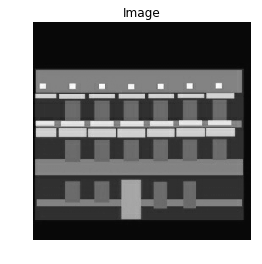

facade real_image:-


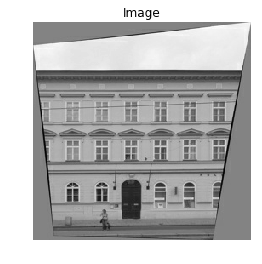

facade generated_image:-


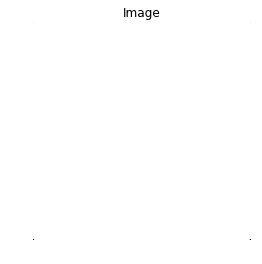

facade label:-


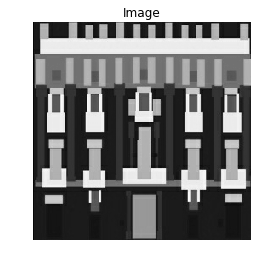

facade real_image:-


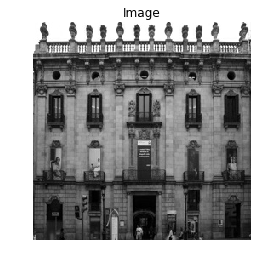

facade generated_image:-


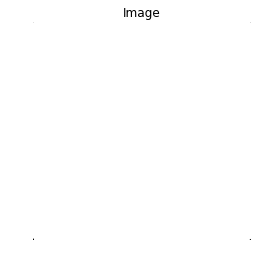

facade label:-


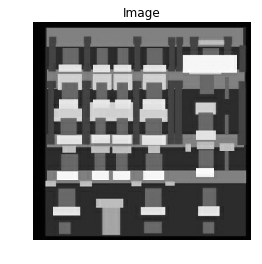

facade real_image:-


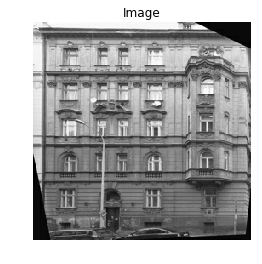

facade generated_image:-


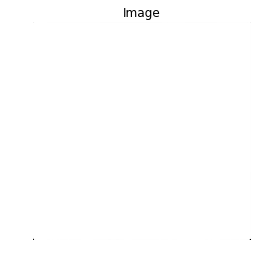

facade label:-


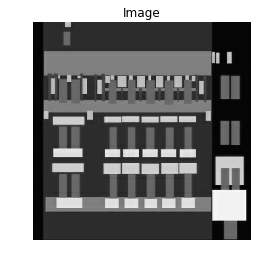

facade real_image:-


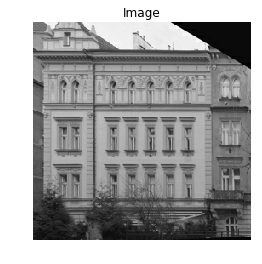

facade generated_image:-


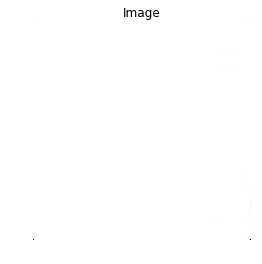

facade label:-


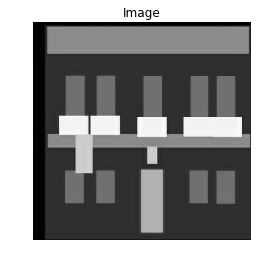

facade real_image:-


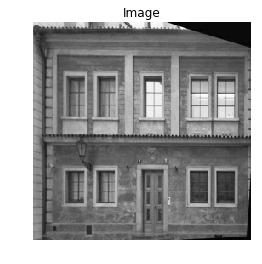

facade generated_image:-


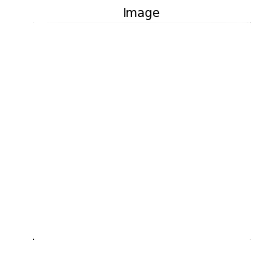

Epoch 21
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.69287866]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.69287866]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.69287866]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.69287866]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.69287866]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.69287866]
Batch:11
Discrimi

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.69287866]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.69287866]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.69287866]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.69287866]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.69287866]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.69287866]
Batch:103
Discriminator loss:

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.69287866]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.69287866]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.69287866]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.69287866]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.69287866]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.69287866]
Batch:195
Discr

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.69287866]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.69287866]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.69287866]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.69287866]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.69287866]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discri

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.69287866]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.69287866]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.69287866]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.69287866]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.69287866]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.69287866]
Batch:377
Discrim

Discriminator loss: 0.6934153
Generator loss: [11442.517, 114.41823, 0.69287866]
Batch:59
Discriminator loss: 0.6934154
Generator loss: [10090.341, 100.89648, 0.6934153]
Batch:60
Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.69287866]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.69287866]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.69287866]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.69287866]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.69287866]
Batch:69
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9635.071, 96.34378, 0.69287866]
Batch:151
Discriminator loss: 0.6934154
Generator loss: [12292.761, 122.92068, 0.6934153]
Batch:152
Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.69287866]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.69287866]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.69287866]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.69287866]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.69287866]
Batch:161
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10158.127, 101.57434, 0.6934153]
Batch:242
Discriminator loss: 0.6934153
Generator loss: [12690.497, 126.89804, 0.69287866]
Batch:243
Discriminator loss: 0.6934154
Generator loss: [14669.289, 146.68596, 0.6934153]
Batch:244
Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.69287866]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.69287866]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.69287866]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.69287866]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator

Discriminator loss: 0.6934153
Generator loss: [9513.359, 95.12666, 0.69287866]
Batch:333
Discriminator loss: 0.6934154
Generator loss: [13337.232, 133.36539, 0.6934153]
Batch:334
Discriminator loss: 0.6934153
Generator loss: [11519.903, 115.1921, 0.69287866]
Batch:335
Discriminator loss: 0.6934154
Generator loss: [7683.3, 76.826065, 0.6934153]
Batch:336
Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.69287866]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.69287866]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.69287866]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.69287866]
Batch:343
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11520.116, 115.19423, 0.69287866]
Batch:25
Discriminator loss: 0.6934154
Generator loss: [11280.91, 112.80217, 0.6934153]
Batch:26
Discriminator loss: 0.6934153
Generator loss: [12732.301, 127.31608, 0.69287866]
Batch:27
Discriminator loss: 0.6934154
Generator loss: [11006.841, 110.06148, 0.6934153]
Batch:28
Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.69287866]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.69287866]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.69287866]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.69287866]
Batch:35
Discriminator loss: 0.69

Discriminator loss: 0.6934153
Generator loss: [12223.409, 122.22716, 0.69287866]
Batch:117
Discriminator loss: 0.6934154
Generator loss: [12970.246, 129.69553, 0.6934153]
Batch:118
Discriminator loss: 0.6934153
Generator loss: [10716.85, 107.16156, 0.69287866]
Batch:119
Discriminator loss: 0.6934154
Generator loss: [12871.923, 128.7123, 0.6934153]
Batch:120
Discriminator loss: 0.6934153
Generator loss: [14811.878, 148.11185, 0.69287866]
Batch:121
Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.69287866]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.69287866]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.69287866]
Batch:127
Discrimin

Discriminator loss: 0.6934153
Generator loss: [10211.1455, 102.10452, 0.69287866]
Batch:209
Discriminator loss: 0.6934154
Generator loss: [9732.415, 97.317215, 0.6934153]
Batch:210
Discriminator loss: 0.6934153
Generator loss: [13113.975, 131.13281, 0.6928787]
Batch:211
Discriminator loss: 0.6934154
Generator loss: [10549.483, 105.4879, 0.6934153]
Batch:212
Discriminator loss: 0.6934153
Generator loss: [10216.052, 102.15358, 0.6928787]
Batch:213
Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator

Discriminator loss: 0.6934153
Generator loss: [10811.583, 108.108894, 0.6928787]
Batch:301
Discriminator loss: 0.6934154
Generator loss: [14525.025, 145.24332, 0.6934153]
Batch:302
Discriminator loss: 0.6934153
Generator loss: [11731.374, 117.30681, 0.6928787]
Batch:303
Discriminator loss: 0.6934154
Generator loss: [9430.528, 94.29835, 0.6934153]
Batch:304
Discriminator loss: 0.6934153
Generator loss: [10920.32, 109.19627, 0.6928787]
Batch:305
Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminat

Discriminator loss: 0.6934153
Generator loss: [9178.194, 91.77501, 0.6928787]
Batch:393
Discriminator loss: 0.6934154
Generator loss: [9631.823, 96.3113, 0.6934153]
Batch:394
Discriminator loss: 0.6934153
Generator loss: [10132.599, 101.31905, 0.6928787]
Batch:395
Discriminator loss: 0.6934154
Generator loss: [8311.045, 83.103516, 0.6934153]
Batch:396
Discriminator loss: 0.6934153
Generator loss: [11984.566, 119.83873, 0.6928787]
Batch:397
Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 24
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0

Discriminator loss: 0.6934154
Generator loss: [9105.674, 91.049805, 0.6934153]
Batch:86
Discriminator loss: 0.6934153
Generator loss: [11456.094, 114.55401, 0.6928787]
Batch:87
Discriminator loss: 0.6934154
Generator loss: [6797.788, 67.97095, 0.6934153]
Batch:88
Discriminator loss: 0.6934153
Generator loss: [9909.858, 99.09165, 0.6928787]
Batch:89
Discriminator loss: 0.6934154
Generator loss: [13380.207, 133.79514, 0.6934153]
Batch:90
Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Ge

Discriminator loss: 0.6934154
Generator loss: [11974.315, 119.73622, 0.6934153]
Batch:178
Discriminator loss: 0.6934153
Generator loss: [12938.69, 129.37997, 0.6928787]
Batch:179
Discriminator loss: 0.6934154
Generator loss: [10592.13, 105.91437, 0.6934153]
Batch:180
Discriminator loss: 0.6934153
Generator loss: [13453.861, 134.53168, 0.6928787]
Batch:181
Discriminator loss: 0.6934154
Generator loss: [10353.493, 103.528, 0.6934153]
Batch:182
Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss

Discriminator loss: 0.6934154
Generator loss: [14631.404, 146.30711, 0.6934153]
Batch:270
Discriminator loss: 0.6934153
Generator loss: [9872.333, 98.71639, 0.6928787]
Batch:271
Discriminator loss: 0.6934154
Generator loss: [5164.1807, 51.634872, 0.6934153]
Batch:272
Discriminator loss: 0.6934153
Generator loss: [12058.075, 120.57382, 0.6928787]
Batch:273
Discriminator loss: 0.6934154
Generator loss: [11466.406, 114.65713, 0.6934153]
Batch:274
Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discrimina

Discriminator loss: 0.6934154
Generator loss: [12292.588, 122.918945, 0.6934153]
Batch:362
Discriminator loss: 0.6934153
Generator loss: [15011.094, 150.104, 0.6928787]
Batch:363
Discriminator loss: 0.6934154
Generator loss: [13552.152, 135.51459, 0.6934153]
Batch:364
Discriminator loss: 0.6934153
Generator loss: [16240.111, 162.39418, 0.6928787]
Batch:365
Discriminator loss: 0.6934154
Generator loss: [11245.715, 112.45022, 0.6934153]
Batch:366
Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [10777.454, 107.76761, 0.6928787]
Batch:55
Discriminator loss: 0.6934154
Generator loss: [9393.567, 93.92874, 0.6934153]
Batch:56
Discriminator loss: 0.6934153
Generator loss: [7517.601, 75.16908, 0.6928787]
Batch:57
Discriminator loss: 0.6934154
Generator loss: [7539.9976, 75.39304, 0.6934153]
Batch:58
Discriminator loss: 0.6934153
Generator loss: [11442.517, 114.41823, 0.6928787]
Batch:59
Discriminator loss: 0.6934154
Generator loss: [10090.341, 100.89648, 0.6934153]
Batch:60
Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [11626.799, 116.261055, 0.6934153]
Batch:148
Discriminator loss: 0.6934153
Generator loss: [8600.441, 85.99748, 0.6928787]
Batch:149
Discriminator loss: 0.6934154
Generator loss: [9876.321, 98.75628, 0.6934153]
Batch:150
Discriminator loss: 0.6934153
Generator loss: [9635.071, 96.34378, 0.6928787]
Batch:151
Discriminator loss: 0.6934154
Generator loss: [12292.761, 122.92068, 0.6934153]
Batch:152
Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0

Discriminator loss: 0.6934153
Generator loss: [10866.847, 108.66154, 0.6934153]
Batch:240
Discriminator loss: 0.6934153
Generator loss: [11901.7295, 119.01036, 0.6928788]
Batch:241
Discriminator loss: 0.6934153
Generator loss: [10158.127, 101.57434, 0.6934153]
Batch:242
Discriminator loss: 0.6934153
Generator loss: [12690.497, 126.89804, 0.6928788]
Batch:243
Discriminator loss: 0.6934153
Generator loss: [14669.289, 146.68596, 0.6934153]
Batch:244
Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928788]
Batch:245
Discriminator loss: 0.6934153
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928788]
Batch:247
Discriminator loss: 0.6934153
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928788]
Batch:249
Discriminator loss: 0.6934153
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12104.839, 121.04146, 0.6934153]
Batch:332
Discriminator loss: 0.6934153
Generator loss: [9513.359, 95.12666, 0.6928788]
Batch:333
Discriminator loss: 0.6934153
Generator loss: [13337.232, 133.36539, 0.6934153]
Batch:334
Discriminator loss: 0.6934153
Generator loss: [11519.903, 115.1921, 0.6928788]
Batch:335
Discriminator loss: 0.6934153
Generator loss: [7683.3, 76.826065, 0.6934153]
Batch:336
Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928788]
Batch:337
Discriminator loss: 0.6934153
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928788]
Batch:339
Discriminator loss: 0.6934153
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928788]
Batch:341
Discriminator loss: 0.6934153
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [8227.567, 82.26874, 0.6934153]
Batch:24
Discriminator loss: 0.6934153
Generator loss: [11520.116, 115.19423, 0.6928788]
Batch:25
Discriminator loss: 0.6934153
Generator loss: [11280.91, 112.80217, 0.6934153]
Batch:26
Discriminator loss: 0.6934153
Generator loss: [12732.301, 127.31608, 0.6928788]
Batch:27
Discriminator loss: 0.6934153
Generator loss: [11006.841, 110.06148, 0.6934153]
Batch:28
Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928788]
Batch:29
Discriminator loss: 0.6934153
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928788]
Batch:31
Discriminator loss: 0.6934153
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928788]
Batch:33
Discriminator loss: 0.6934153
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153


Discriminator loss: 0.6934153
Generator loss: [12223.409, 122.22716, 0.6928788]
Batch:117
Discriminator loss: 0.6934153
Generator loss: [12970.246, 129.69553, 0.6934153]
Batch:118
Discriminator loss: 0.6934153
Generator loss: [10716.85, 107.16156, 0.6928788]
Batch:119
Discriminator loss: 0.6934153
Generator loss: [12871.923, 128.7123, 0.6934153]
Batch:120
Discriminator loss: 0.6934153
Generator loss: [14811.878, 148.11185, 0.6928788]
Batch:121
Discriminator loss: 0.6934153
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928788]
Batch:123
Discriminator loss: 0.6934153
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928788]
Batch:125
Discriminator loss: 0.6934153
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928788]
Batch:127
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [10211.1455, 102.10452, 0.6928788]
Batch:209
Discriminator loss: 0.6934153
Generator loss: [9732.415, 97.317215, 0.6934153]
Batch:210
Discriminator loss: 0.6934153
Generator loss: [13113.975, 131.13281, 0.6928788]
Batch:211
Discriminator loss: 0.6934153
Generator loss: [10549.483, 105.4879, 0.6934153]
Batch:212
Discriminator loss: 0.6934153
Generator loss: [10216.052, 102.15358, 0.6928788]
Batch:213
Discriminator loss: 0.6934153
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928788]
Batch:215
Discriminator loss: 0.6934153
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928788]
Batch:217
Discriminator loss: 0.6934153
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928788]
Batch:219
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [10811.583, 108.108894, 0.6928788]
Batch:301
Discriminator loss: 0.6934153
Generator loss: [14525.025, 145.24332, 0.6934153]
Batch:302
Discriminator loss: 0.6934153
Generator loss: [11731.374, 117.30681, 0.6928788]
Batch:303
Discriminator loss: 0.6934153
Generator loss: [9430.528, 94.29835, 0.6934153]
Batch:304
Discriminator loss: 0.6934153
Generator loss: [10920.32, 109.19627, 0.6928788]
Batch:305
Discriminator loss: 0.6934153
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928788]
Batch:307
Discriminator loss: 0.6934153
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928788]
Batch:309
Discriminator loss: 0.6934153
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928788]
Batch:311
Discriminat

Discriminator loss: 0.6934153
Generator loss: [9178.194, 91.77501, 0.6928788]
Batch:393
Discriminator loss: 0.6934153
Generator loss: [9631.823, 96.3113, 0.6934153]
Batch:394
Discriminator loss: 0.6934153
Generator loss: [10132.599, 101.31905, 0.6928788]
Batch:395
Discriminator loss: 0.6934153
Generator loss: [8311.045, 83.103516, 0.6934153]
Batch:396
Discriminator loss: 0.6934153
Generator loss: [11984.566, 119.83873, 0.6928788]
Batch:397
Discriminator loss: 0.6934153
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928788]
Batch:399
Discriminator loss: 0.6934153
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 27
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928788]
Batch:1
Discriminator loss: 0.6934153
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928788]
Batch:3
Discriminator loss: 0

Discriminator loss: 0.6934153
Generator loss: [9105.674, 91.049805, 0.6934153]
Batch:86
Discriminator loss: 0.6934153
Generator loss: [11456.094, 114.55401, 0.6928788]
Batch:87
Discriminator loss: 0.6934153
Generator loss: [6797.788, 67.97095, 0.6934153]
Batch:88
Discriminator loss: 0.6934153
Generator loss: [9909.858, 99.09165, 0.6928788]
Batch:89
Discriminator loss: 0.6934153
Generator loss: [13380.207, 133.79514, 0.6934153]
Batch:90
Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928788]
Batch:91
Discriminator loss: 0.6934153
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928788]
Batch:93
Discriminator loss: 0.6934153
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928788]
Batch:95
Discriminator loss: 0.6934153
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Ge

Discriminator loss: 0.6934153
Generator loss: [11974.315, 119.73622, 0.6934153]
Batch:178
Discriminator loss: 0.6934153
Generator loss: [12938.69, 129.37997, 0.6928788]
Batch:179
Discriminator loss: 0.6934153
Generator loss: [10592.13, 105.91437, 0.6934153]
Batch:180
Discriminator loss: 0.6934153
Generator loss: [13453.861, 134.53168, 0.6928788]
Batch:181
Discriminator loss: 0.6934153
Generator loss: [10353.493, 103.528, 0.6934153]
Batch:182
Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928788]
Batch:183
Discriminator loss: 0.6934153
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928788]
Batch:185
Discriminator loss: 0.6934153
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928788]
Batch:187
Discriminator loss: 0.6934153
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss

Discriminator loss: 0.6934154
Generator loss: [14631.404, 146.30711, 0.6934153]
Batch:270
Discriminator loss: 0.6934153
Generator loss: [9872.333, 98.71639, 0.6928787]
Batch:271
Discriminator loss: 0.6934154
Generator loss: [5164.1807, 51.634872, 0.6934153]
Batch:272
Discriminator loss: 0.6934153
Generator loss: [12058.075, 120.57382, 0.6928787]
Batch:273
Discriminator loss: 0.6934154
Generator loss: [11466.406, 114.65713, 0.6934153]
Batch:274
Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discrimina

Discriminator loss: 0.6934154
Generator loss: [12292.588, 122.918945, 0.6934153]
Batch:362
Discriminator loss: 0.6934153
Generator loss: [15011.094, 150.104, 0.6928787]
Batch:363
Discriminator loss: 0.6934154
Generator loss: [13552.152, 135.51459, 0.6934153]
Batch:364
Discriminator loss: 0.6934153
Generator loss: [16240.111, 162.39418, 0.6928787]
Batch:365
Discriminator loss: 0.6934154
Generator loss: [11245.715, 112.45022, 0.6934153]
Batch:366
Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [10777.454, 107.76761, 0.6928787]
Batch:55
Discriminator loss: 0.6934154
Generator loss: [9393.567, 93.92874, 0.6934153]
Batch:56
Discriminator loss: 0.6934153
Generator loss: [7517.601, 75.16908, 0.6928787]
Batch:57
Discriminator loss: 0.6934154
Generator loss: [7539.9976, 75.39304, 0.6934153]
Batch:58
Discriminator loss: 0.6934153
Generator loss: [11442.517, 114.41823, 0.6928787]
Batch:59
Discriminator loss: 0.6934154
Generator loss: [10090.341, 100.89648, 0.6934153]
Batch:60
Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [11626.799, 116.261055, 0.6934153]
Batch:148
Discriminator loss: 0.6934153
Generator loss: [8600.441, 85.99748, 0.6928787]
Batch:149
Discriminator loss: 0.6934154
Generator loss: [9876.321, 98.75628, 0.6934153]
Batch:150
Discriminator loss: 0.6934153
Generator loss: [9635.071, 96.34378, 0.6928787]
Batch:151
Discriminator loss: 0.6934154
Generator loss: [12292.761, 122.92068, 0.6934153]
Batch:152
Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0

Discriminator loss: 0.6934154
Generator loss: [10866.847, 108.66154, 0.6934153]
Batch:240
Discriminator loss: 0.6934153
Generator loss: [11901.7295, 119.01036, 0.6928787]
Batch:241
Discriminator loss: 0.6934154
Generator loss: [10158.127, 101.57434, 0.6934153]
Batch:242
Discriminator loss: 0.6934153
Generator loss: [12690.497, 126.89804, 0.6928787]
Batch:243
Discriminator loss: 0.6934154
Generator loss: [14669.289, 146.68596, 0.6934153]
Batch:244
Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [12104.839, 121.04146, 0.6934153]
Batch:332
Discriminator loss: 0.6934153
Generator loss: [9513.359, 95.12666, 0.6928787]
Batch:333
Discriminator loss: 0.6934154
Generator loss: [13337.232, 133.36539, 0.6934153]
Batch:334
Discriminator loss: 0.6934153
Generator loss: [11519.903, 115.1921, 0.6928787]
Batch:335
Discriminator loss: 0.6934154
Generator loss: [7683.3, 76.826065, 0.6934153]
Batch:336
Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8227.567, 82.26874, 0.6934153]
Batch:24
Discriminator loss: 0.6934153
Generator loss: [11520.116, 115.19423, 0.6928787]
Batch:25
Discriminator loss: 0.6934154
Generator loss: [11280.91, 112.80217, 0.6934153]
Batch:26
Discriminator loss: 0.6934153
Generator loss: [12732.301, 127.31608, 0.6928787]
Batch:27
Discriminator loss: 0.6934154
Generator loss: [11006.841, 110.06148, 0.6934153]
Batch:28
Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153


Discriminator loss: 0.6934153
Generator loss: [12223.409, 122.22716, 0.6928787]
Batch:117
Discriminator loss: 0.6934154
Generator loss: [12970.246, 129.69553, 0.6934153]
Batch:118
Discriminator loss: 0.6934153
Generator loss: [10716.85, 107.16156, 0.6928787]
Batch:119
Discriminator loss: 0.6934154
Generator loss: [12871.923, 128.7123, 0.6934153]
Batch:120
Discriminator loss: 0.6934153
Generator loss: [14811.878, 148.11185, 0.6928787]
Batch:121
Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [10211.1455, 102.10452, 0.6928787]
Batch:209
Discriminator loss: 0.6934154
Generator loss: [9732.415, 97.317215, 0.6934153]
Batch:210
Discriminator loss: 0.6934153
Generator loss: [13113.975, 131.13281, 0.6928787]
Batch:211
Discriminator loss: 0.6934154
Generator loss: [10549.483, 105.4879, 0.6934153]
Batch:212
Discriminator loss: 0.6934153
Generator loss: [10216.052, 102.15358, 0.6928787]
Batch:213
Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [10811.583, 108.108894, 0.6928787]
Batch:301
Discriminator loss: 0.6934154
Generator loss: [14525.025, 145.24332, 0.6934153]
Batch:302
Discriminator loss: 0.6934153
Generator loss: [11731.374, 117.30681, 0.6928787]
Batch:303
Discriminator loss: 0.6934154
Generator loss: [9430.528, 94.29835, 0.6934153]
Batch:304
Discriminator loss: 0.6934153
Generator loss: [10920.32, 109.19627, 0.6928787]
Batch:305
Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminat

Discriminator loss: 0.6934153
Generator loss: [9178.194, 91.77501, 0.6928787]
Batch:393
Discriminator loss: 0.6934154
Generator loss: [9631.823, 96.3113, 0.6934153]
Batch:394
Discriminator loss: 0.6934153
Generator loss: [10132.599, 101.31905, 0.6928787]
Batch:395
Discriminator loss: 0.6934154
Generator loss: [8311.045, 83.103516, 0.6934153]
Batch:396
Discriminator loss: 0.6934153
Generator loss: [11984.566, 119.83873, 0.6928787]
Batch:397
Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 30
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0

Discriminator loss: 0.6934154
Generator loss: [9105.674, 91.049805, 0.6934153]
Batch:86
Discriminator loss: 0.6934153
Generator loss: [11456.094, 114.55401, 0.6928787]
Batch:87
Discriminator loss: 0.6934154
Generator loss: [6797.788, 67.97095, 0.6934153]
Batch:88
Discriminator loss: 0.6934153
Generator loss: [9909.858, 99.09165, 0.6928787]
Batch:89
Discriminator loss: 0.6934154
Generator loss: [13380.207, 133.79514, 0.6934153]
Batch:90
Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Ge

Discriminator loss: 0.6934154
Generator loss: [11974.315, 119.73622, 0.6934153]
Batch:178
Discriminator loss: 0.6934153
Generator loss: [12938.69, 129.37997, 0.6928787]
Batch:179
Discriminator loss: 0.6934154
Generator loss: [10592.13, 105.91437, 0.6934153]
Batch:180
Discriminator loss: 0.6934153
Generator loss: [13453.861, 134.53168, 0.6928787]
Batch:181
Discriminator loss: 0.6934154
Generator loss: [10353.493, 103.528, 0.6934153]
Batch:182
Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss

Discriminator loss: 0.6934154
Generator loss: [14631.404, 146.30711, 0.6934153]
Batch:270
Discriminator loss: 0.6934153
Generator loss: [9872.333, 98.71639, 0.6928787]
Batch:271
Discriminator loss: 0.6934154
Generator loss: [5164.1807, 51.634872, 0.6934153]
Batch:272
Discriminator loss: 0.6934153
Generator loss: [12058.075, 120.57382, 0.6928787]
Batch:273
Discriminator loss: 0.6934154
Generator loss: [11466.406, 114.65713, 0.6934153]
Batch:274
Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discrimina

Discriminator loss: 0.6934154
Generator loss: [12292.588, 122.918945, 0.6934153]
Batch:362
Discriminator loss: 0.6934153
Generator loss: [15011.094, 150.104, 0.6928787]
Batch:363
Discriminator loss: 0.6934154
Generator loss: [13552.152, 135.51459, 0.6934153]
Batch:364
Discriminator loss: 0.6934153
Generator loss: [16240.111, 162.39418, 0.6928787]
Batch:365
Discriminator loss: 0.6934154
Generator loss: [11245.715, 112.45022, 0.6934153]
Batch:366
Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator 

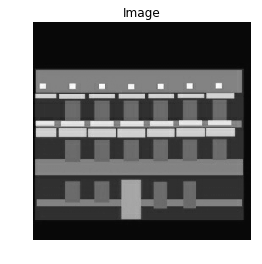

facade real_image:-


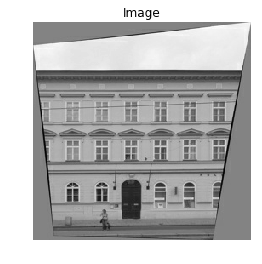

facade generated_image:-


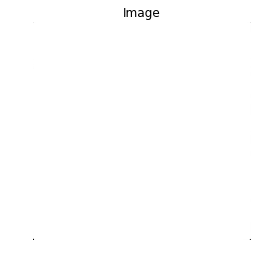

facade label:-


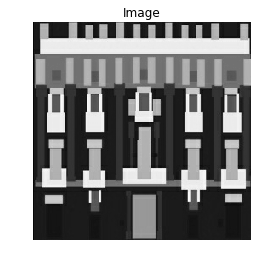

facade real_image:-


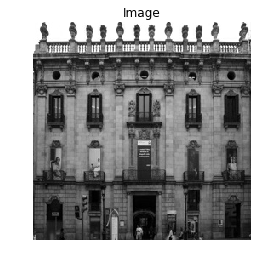

facade generated_image:-


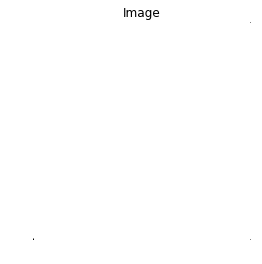

facade label:-


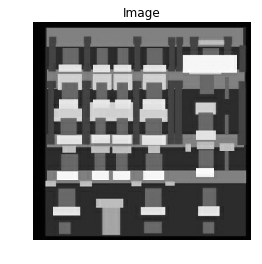

facade real_image:-


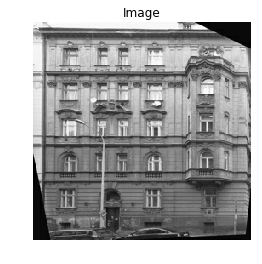

facade generated_image:-


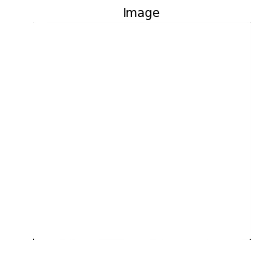

facade label:-


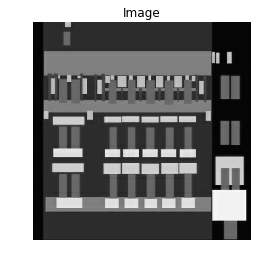

facade real_image:-


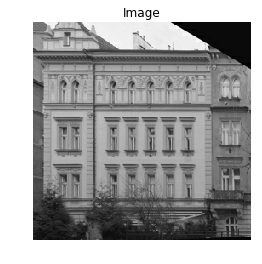

facade generated_image:-


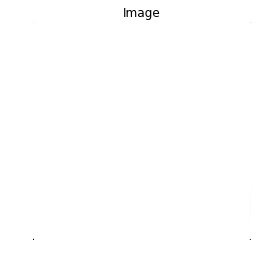

facade label:-


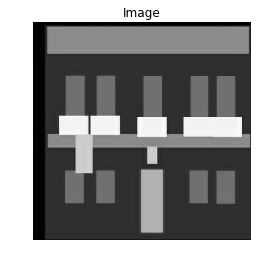

facade real_image:-


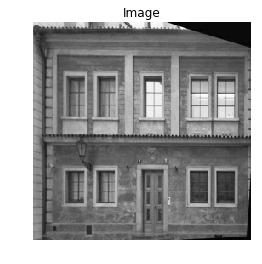

facade generated_image:-


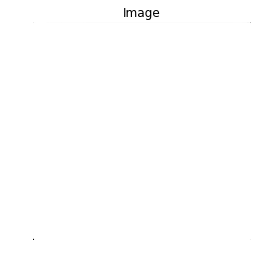

Epoch 31
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 34
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 37
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 40
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

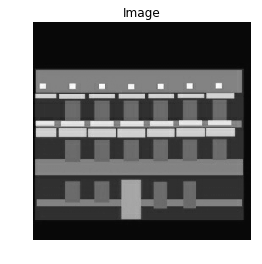

facade real_image:-


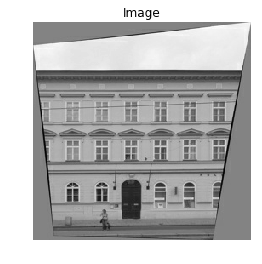

facade generated_image:-


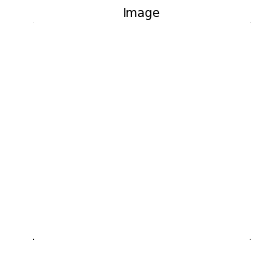

facade label:-


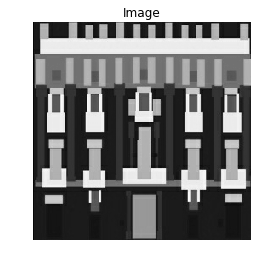

facade real_image:-


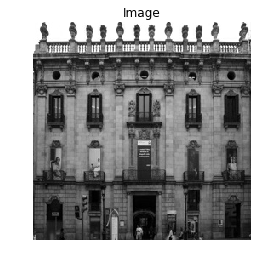

facade generated_image:-


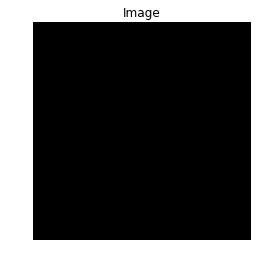

facade label:-


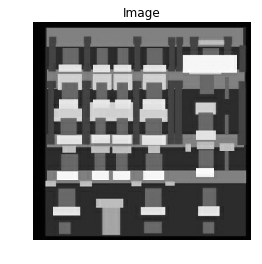

facade real_image:-


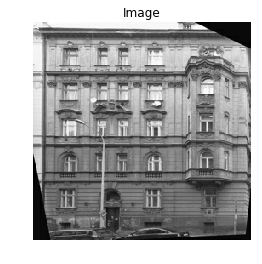

facade generated_image:-


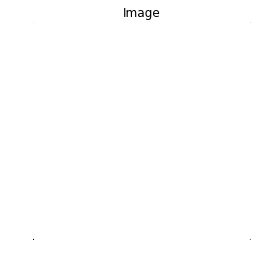

facade label:-


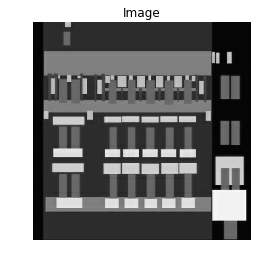

facade real_image:-


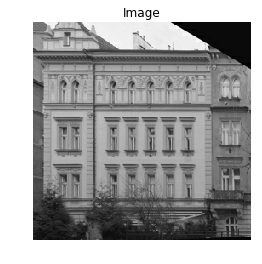

facade generated_image:-


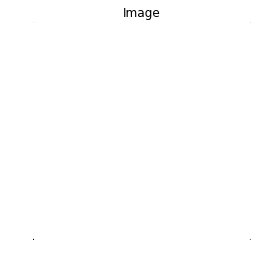

facade label:-


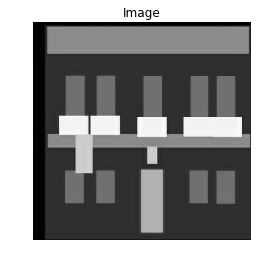

facade real_image:-


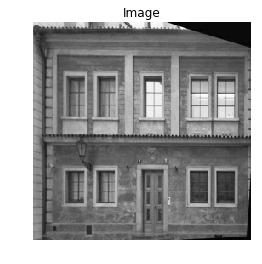

facade generated_image:-


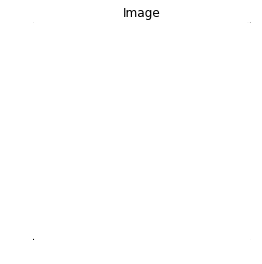

Epoch 41
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 44
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 47
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 50
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

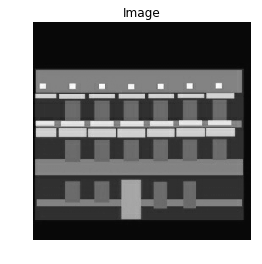

facade real_image:-


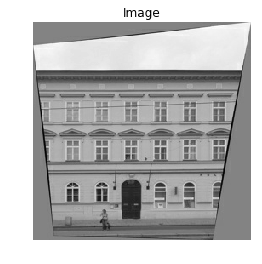

facade generated_image:-


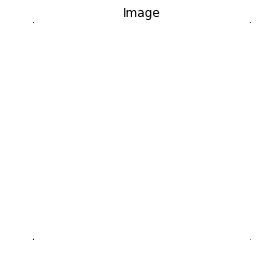

facade label:-


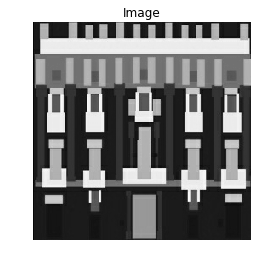

facade real_image:-


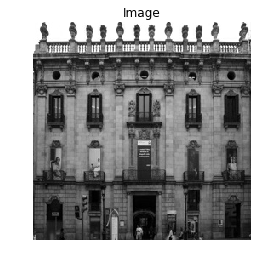

facade generated_image:-


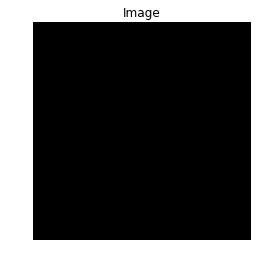

facade label:-


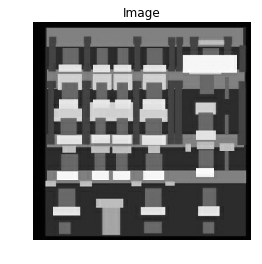

facade real_image:-


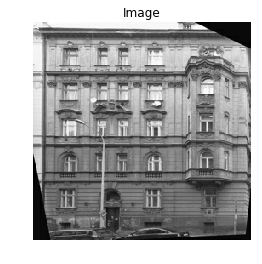

facade generated_image:-


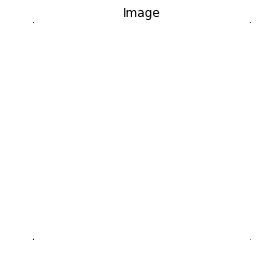

facade label:-


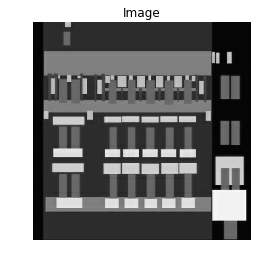

facade real_image:-


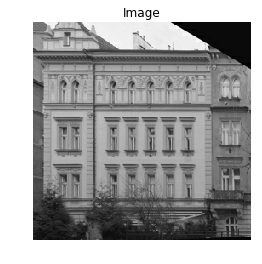

facade generated_image:-


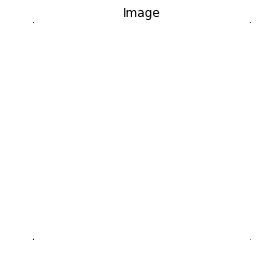

facade label:-


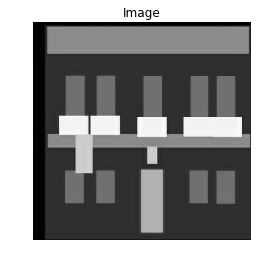

facade real_image:-


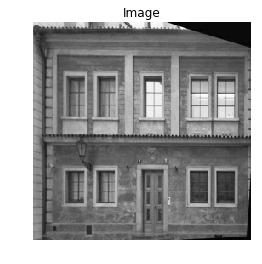

facade generated_image:-


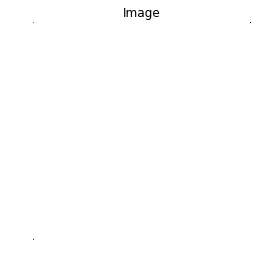

Epoch 51
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 54
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 57
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 60
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

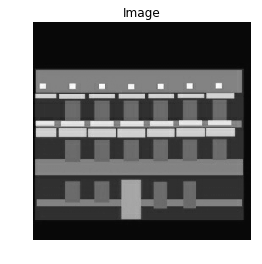

facade real_image:-


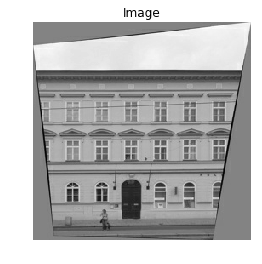

facade generated_image:-


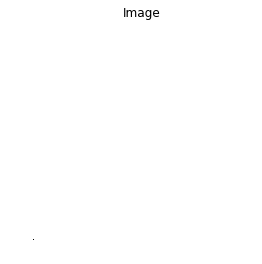

facade label:-


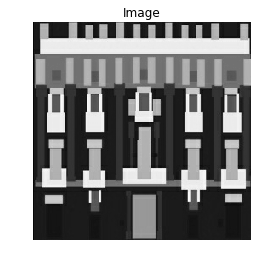

facade real_image:-


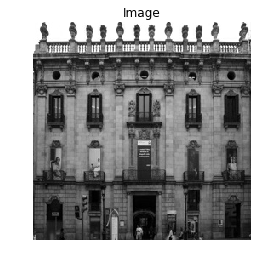

facade generated_image:-


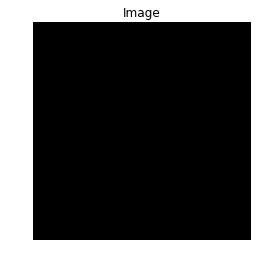

facade label:-


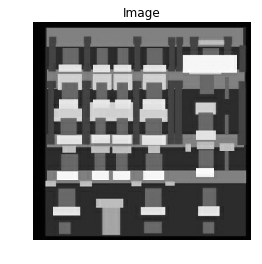

facade real_image:-


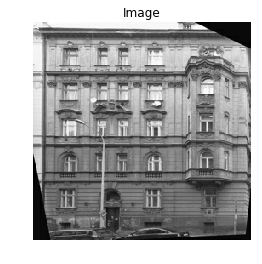

facade generated_image:-


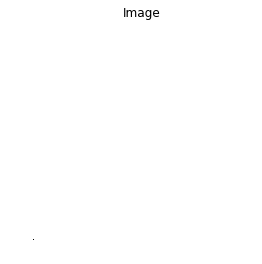

facade label:-


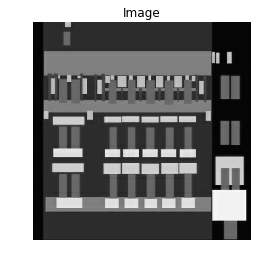

facade real_image:-


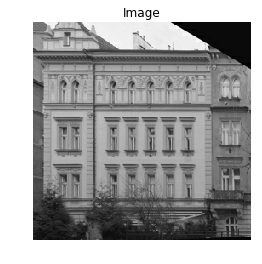

facade generated_image:-


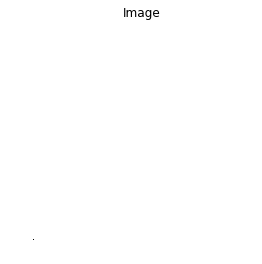

facade label:-


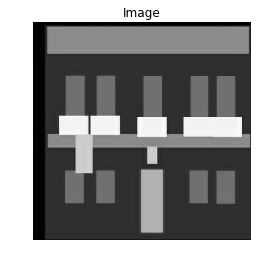

facade real_image:-


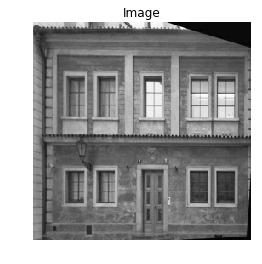

facade generated_image:-


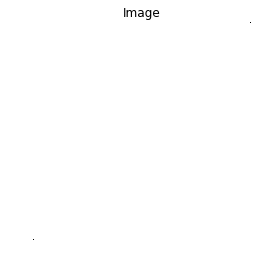

Epoch 61
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 64
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 67
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 70
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

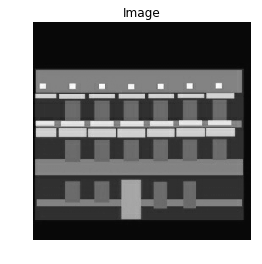

facade real_image:-


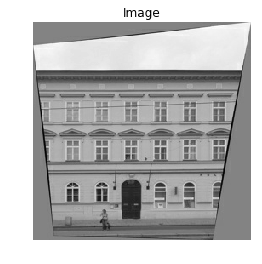

facade generated_image:-


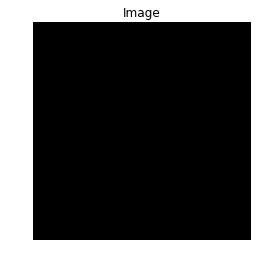

facade label:-


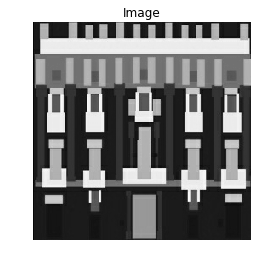

facade real_image:-


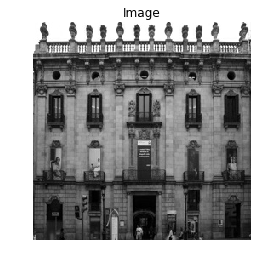

facade generated_image:-


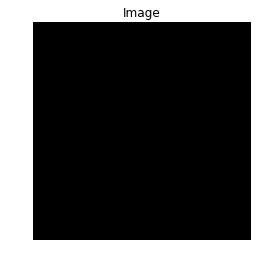

facade label:-


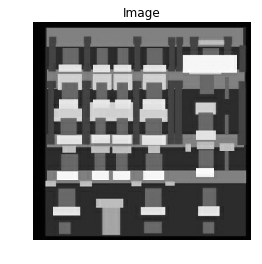

facade real_image:-


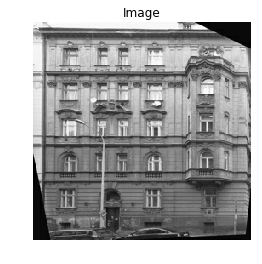

facade generated_image:-


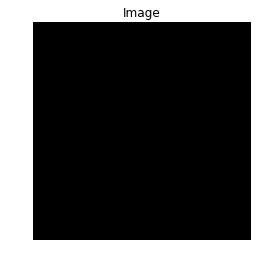

facade label:-


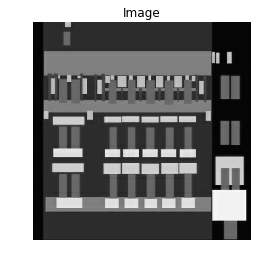

facade real_image:-


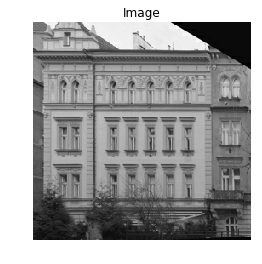

facade generated_image:-


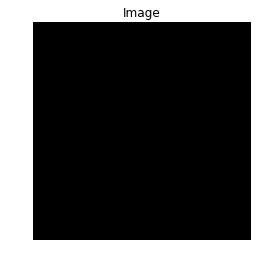

facade label:-


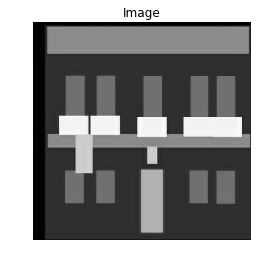

facade real_image:-


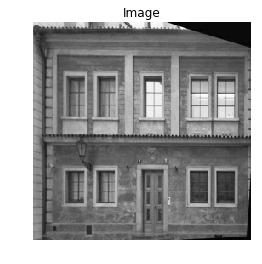

facade generated_image:-


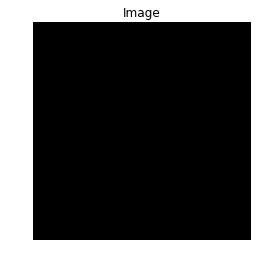

Epoch 71
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928788]
Batch:279
Discriminator loss: 0.6934153
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928788]
Batch:281
Discriminator loss: 0.6934153
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928788]
Batch:283
Discriminator loss: 0.6934153
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928788]
Batch:285
Discriminator loss: 0.6934153
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928788]
Batch:287
Discriminator loss: 0.6934153
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928788]
Batch:371
Discriminator loss: 0.6934153
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928788]
Batch:373
Discriminator loss: 0.6934153
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928788]
Batch:375
Discriminator loss: 0.6934153
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928788]
Batch:377
Discriminator loss: 0.6934153
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928788]
Batch:379
Discriminator loss: 0.6934153
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928788]
Batch:63
Discriminator loss: 0.6934153
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928788]
Batch:65
Discriminator loss: 0.6934153
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928788]
Batch:67
Discriminator loss: 0.6934153
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928788]
Batch:69
Discriminator loss: 0.6934153
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928788]
Batch:71
Discriminator loss: 0.6934153
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928788]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928788]
Batch:155
Discriminator loss: 0.6934153
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928788]
Batch:157
Discriminator loss: 0.6934153
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928788]
Batch:159
Discriminator loss: 0.6934153
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928788]
Batch:161
Discriminator loss: 0.6934153
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928788]
Batch:163
Discriminator loss: 0.6934153
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928788]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928788]
Batch:247
Discriminator loss: 0.6934153
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928788]
Batch:249
Discriminator loss: 0.6934153
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928788]
Batch:251
Discriminator loss: 0.6934153
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928788]
Batch:253
Discriminator loss: 0.6934153
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928788]
Batch:255
Discriminator loss: 0.6934153
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928788]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928788]
Batch:339
Discriminator loss: 0.6934153
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928788]
Batch:341
Discriminator loss: 0.6934153
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928788]
Batch:343
Discriminator loss: 0.6934153
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928788]
Batch:345
Discriminator loss: 0.6934153
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928788]
Batch:347
Discriminator loss: 0.6934153
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928788]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928788]
Batch:31
Discriminator loss: 0.6934153
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928788]
Batch:33
Discriminator loss: 0.6934153
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928788]
Batch:35
Discriminator loss: 0.6934153
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928788]
Batch:37
Discriminator loss: 0.6934153
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928788]
Batch:39
Discriminator loss: 0.6934153
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928788]
Batch:41
Discriminator loss: 0.6934153


Discriminator loss: 0.6934153
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928788]
Batch:125
Discriminator loss: 0.6934153
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928788]
Batch:127
Discriminator loss: 0.6934153
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928788]
Batch:129
Discriminator loss: 0.6934153
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928788]
Batch:131
Discriminator loss: 0.6934153
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928788]
Batch:133
Discriminator loss: 0.6934153
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928788]
Batch:217
Discriminator loss: 0.6934153
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928788]
Batch:219
Discriminator loss: 0.6934153
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928788]
Batch:221
Discriminator loss: 0.6934153
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928788]
Batch:223
Discriminator loss: 0.6934153
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928788]
Batch:225
Discriminator loss: 0.6934153
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928788]
Batch:309
Discriminator loss: 0.6934153
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928788]
Batch:311
Discriminator loss: 0.6934153
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928788]
Batch:313
Discriminator loss: 0.6934153
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928788]
Batch:315
Discriminator loss: 0.6934153
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928788]
Batch:317
Discriminator loss: 0.6934153
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 74
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928788]
Batch:1
Discriminator loss: 0.6934153
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928788]
Batch:3
Discriminator loss: 0.6934153
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928788]
Batch:5
Discriminator loss: 0.6934153
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928788]
Batch:7
Discriminator loss: 0.6934153
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928788]
Batch:9
Discriminator loss: 0.6934153
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 77
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 80
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

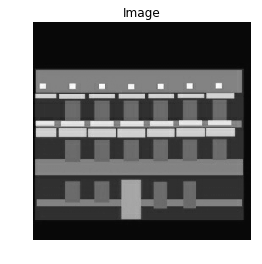

facade real_image:-


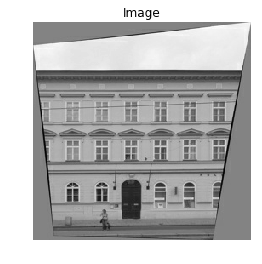

facade generated_image:-


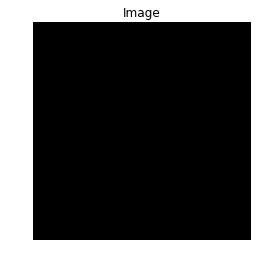

facade label:-


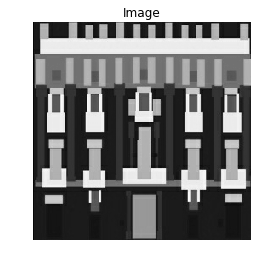

facade real_image:-


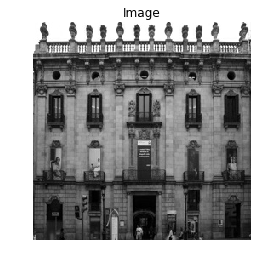

facade generated_image:-


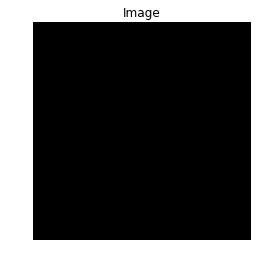

facade label:-


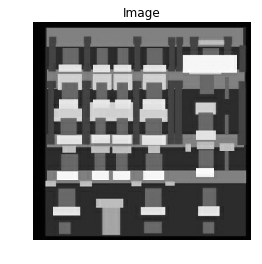

facade real_image:-


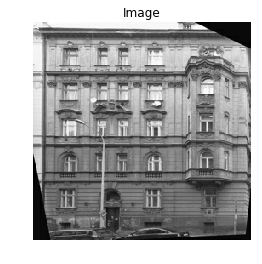

facade generated_image:-


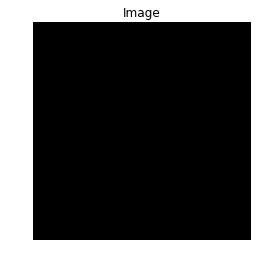

facade label:-


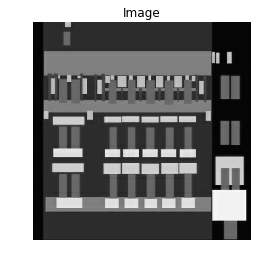

facade real_image:-


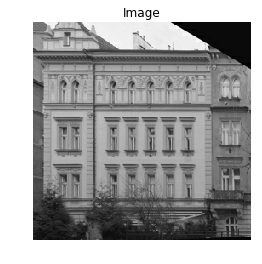

facade generated_image:-


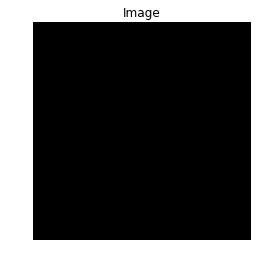

facade label:-


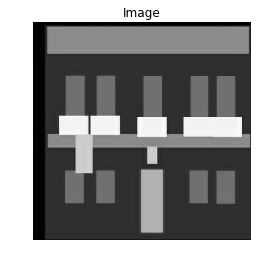

facade real_image:-


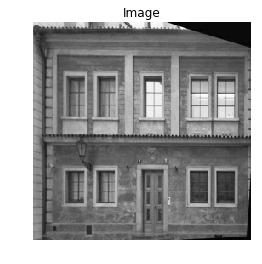

facade generated_image:-


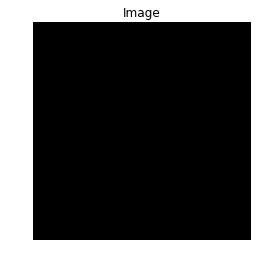

Epoch 81
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 84
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 87
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 90
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

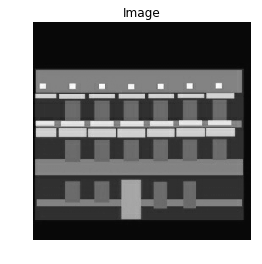

facade real_image:-


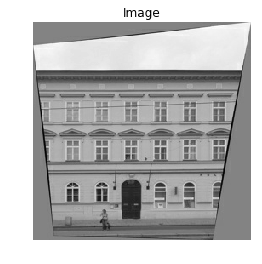

facade generated_image:-


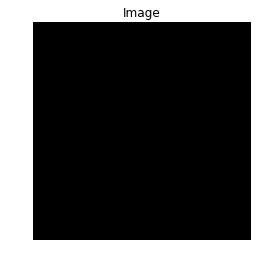

facade label:-


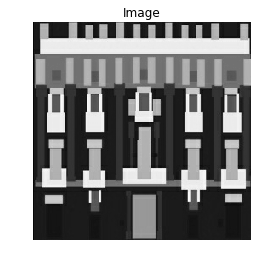

facade real_image:-


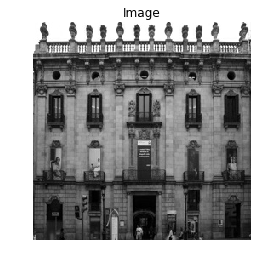

facade generated_image:-


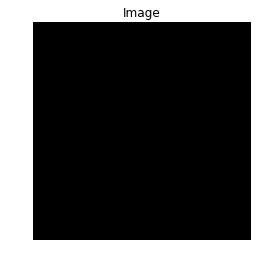

facade label:-


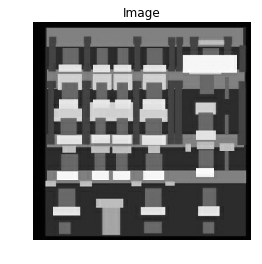

facade real_image:-


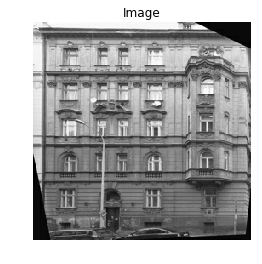

facade generated_image:-


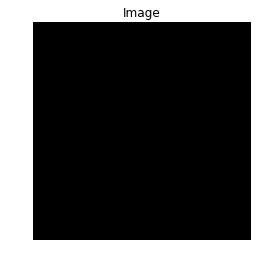

facade label:-


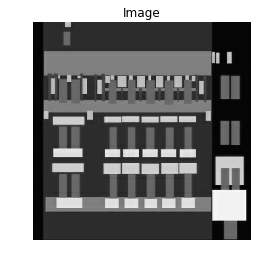

facade real_image:-


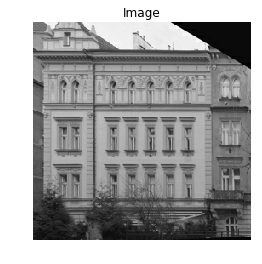

facade generated_image:-


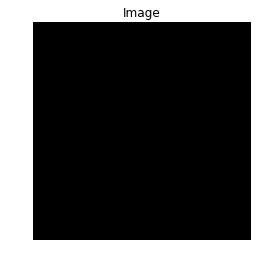

facade label:-


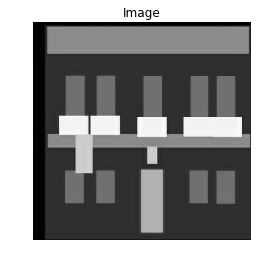

facade real_image:-


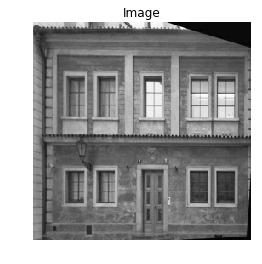

facade generated_image:-


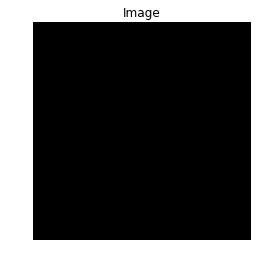

Epoch 91
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.6934154
Generator loss: [9574.614, 95.739204, 0.6934153]
Batch:104
Discriminator loss: 0.6

Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminator loss: 0.6934154
Generator loss: [14107.953, 141.0726, 0.6934153]
Batch:196
Discriminat

Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminator loss: 0.6934154
Generator loss: [11265.518, 112.64824, 0.6934153]
Batch:288
Discriminato

Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator loss: 0.6934154
Generator loss: [10553.143, 105.52449, 0.6934153]
Batch:380
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 0.6934153
Generator loss: [11903.579, 119.02886, 0.6928787]
Batch:73
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator loss: 0.6934153
Generator loss: [9977.533, 99.768394, 0.6928787]
Batch:165
Discriminator l

Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator loss: 0.6934153
Generator loss: [11005.152, 110.044586, 0.6928787]
Batch:257
Discrimina

Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminator loss: 0.6934153
Generator loss: [11452.257, 114.51563, 0.6928787]
Batch:349
Discriminator

Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153
Generator loss: [11540.453, 115.3976, 0.6928787]
Batch:41
Discriminator loss: 0.6934154


Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator loss: 0.6934154
Generator loss: [14537.748, 145.37054, 0.6934153]
Batch:134
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminator loss: 0.6934154
Generator loss: [14313.315, 143.12622, 0.6934153]
Batch:226
Discriminat

Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminator loss: 0.6934154
Generator loss: [9858.712, 98.580185, 0.6934153]
Batch:318
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 94
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934153
Generator loss: [10909.357, 109.08664, 0.6928787]
Batch:103
Discriminator loss: 0.693

Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminator loss: 0.6934153
Generator loss: [13742.137, 137.41443, 0.6928787]
Batch:195
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminator loss: 0.6934153
Generator loss: [12546.234, 125.455414, 0.6928787]
Batch:287
Discriminat

Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator loss: 0.6934153
Generator loss: [12689.526, 126.88833, 0.6928787]
Batch:379
Discriminator

Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 0.6934154
Generator loss: [14240.439, 142.39746, 0.6934153]
Batch:72
Discriminator loss: 

Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator loss: 0.6934154
Generator loss: [11855.546, 118.54852, 0.6934153]
Batch:164
Discriminator l

Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss: 0.6934154
Generator loss: [10587.8545, 105.87161, 0.6934153]
Batch:256
Discriminator 

Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminator loss: 0.6934154
Generator loss: [13134.696, 131.34003, 0.6934153]
Batch:348
Discriminato

Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154
Generator loss: [12720.686, 127.19992, 0.6934153]
Batch:40
Discriminator loss: 0.6934153

Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator loss: 0.6934153
Generator loss: [13030.118, 130.29425, 0.6928787]
Batch:133
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminator loss: 0.6934153
Generator loss: [10018.214, 100.1752, 0.6928787]
Batch:225
Discriminat

Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discriminator loss: 0.6934153
Generator loss: [9455.794, 94.55101, 0.6928787]
Batch:317
Discriminato

Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 97
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.69

Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.6934154
Generator loss: [12744.689, 127.43996, 0.6934153]
Batch:102
Discriminator loss: 0.6934

Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator loss: 0.6934154
Generator loss: [10434.019, 104.33325, 0.6934153]
Batch:194
Discriminato

Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discriminator loss: 0.6934154
Generator loss: [12633.45, 126.32757, 0.6934153]
Batch:286
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator loss: 0.6934154
Generator loss: [13034.055, 130.33362, 0.6934153]
Batch:378
Discriminator

Discriminator loss: 0.6934153
Generator loss: [11478.187, 114.77493, 0.6928787]
Batch:61
Discriminator loss: 0.6934154
Generator loss: [9838.174, 98.37481, 0.6934153]
Batch:62
Discriminator loss: 0.6934153
Generator loss: [10968.653, 109.679596, 0.6928787]
Batch:63
Discriminator loss: 0.6934154
Generator loss: [15174.117, 151.73424, 0.6934153]
Batch:64
Discriminator loss: 0.6934153
Generator loss: [8673.522, 86.72829, 0.6928787]
Batch:65
Discriminator loss: 0.6934154
Generator loss: [11037.082, 110.36389, 0.6934153]
Batch:66
Discriminator loss: 0.6934153
Generator loss: [12048.635, 120.479416, 0.6928787]
Batch:67
Discriminator loss: 0.6934154
Generator loss: [11459.555, 114.588615, 0.6934153]
Batch:68
Discriminator loss: 0.6934153
Generator loss: [12625.896, 126.25203, 0.6928787]
Batch:69
Discriminator loss: 0.6934154
Generator loss: [11519.078, 115.183846, 0.6934153]
Batch:70
Discriminator loss: 0.6934153
Generator loss: [11728.704, 117.280106, 0.6928787]
Batch:71
Discriminator loss: 

Discriminator loss: 0.6934153
Generator loss: [11284.133, 112.8344, 0.6928787]
Batch:153
Discriminator loss: 0.6934154
Generator loss: [13036.823, 130.3613, 0.6934153]
Batch:154
Discriminator loss: 0.6934153
Generator loss: [10659.307, 106.586136, 0.6928787]
Batch:155
Discriminator loss: 0.6934154
Generator loss: [9042.157, 90.41464, 0.6934153]
Batch:156
Discriminator loss: 0.6934153
Generator loss: [13026.884, 130.2619, 0.6928787]
Batch:157
Discriminator loss: 0.6934154
Generator loss: [8384.437, 83.83743, 0.6934153]
Batch:158
Discriminator loss: 0.6934153
Generator loss: [13491.712, 134.91019, 0.6928787]
Batch:159
Discriminator loss: 0.6934154
Generator loss: [14120.17, 141.19476, 0.6934153]
Batch:160
Discriminator loss: 0.6934153
Generator loss: [12555.507, 125.548134, 0.6928787]
Batch:161
Discriminator loss: 0.6934154
Generator loss: [11805.737, 118.05044, 0.6934153]
Batch:162
Discriminator loss: 0.6934153
Generator loss: [14340.516, 143.39822, 0.6928787]
Batch:163
Discriminator lo

Discriminator loss: 0.6934153
Generator loss: [9519.55, 95.18857, 0.6928787]
Batch:245
Discriminator loss: 0.6934154
Generator loss: [9551.304, 95.5061, 0.6934153]
Batch:246
Discriminator loss: 0.6934153
Generator loss: [12435.781, 124.35088, 0.6928787]
Batch:247
Discriminator loss: 0.6934154
Generator loss: [10496.754, 104.96061, 0.6934153]
Batch:248
Discriminator loss: 0.6934153
Generator loss: [12930.128, 129.29434, 0.6928787]
Batch:249
Discriminator loss: 0.6934154
Generator loss: [14423.141, 144.22447, 0.6934153]
Batch:250
Discriminator loss: 0.6934153
Generator loss: [8197.649, 81.96956, 0.6928787]
Batch:251
Discriminator loss: 0.6934154
Generator loss: [10212.517, 102.11823, 0.6934153]
Batch:252
Discriminator loss: 0.6934153
Generator loss: [12198.401, 121.97708, 0.6928787]
Batch:253
Discriminator loss: 0.6934154
Generator loss: [10515.546, 105.14853, 0.6934153]
Batch:254
Discriminator loss: 0.6934153
Generator loss: [10639.385, 106.38691, 0.6928787]
Batch:255
Discriminator loss

Discriminator loss: 0.6934153
Generator loss: [11215.545, 112.14851, 0.6928787]
Batch:337
Discriminator loss: 0.6934154
Generator loss: [10923.951, 109.232574, 0.6934153]
Batch:338
Discriminator loss: 0.6934153
Generator loss: [12006.613, 120.059204, 0.6928787]
Batch:339
Discriminator loss: 0.6934154
Generator loss: [12366.199, 123.65506, 0.6934153]
Batch:340
Discriminator loss: 0.6934153
Generator loss: [13025.727, 130.25034, 0.6928787]
Batch:341
Discriminator loss: 0.6934154
Generator loss: [9252.052, 92.51359, 0.6934153]
Batch:342
Discriminator loss: 0.6934153
Generator loss: [14122.251, 141.21558, 0.6928787]
Batch:343
Discriminator loss: 0.6934154
Generator loss: [10334.5625, 103.33869, 0.6934153]
Batch:344
Discriminator loss: 0.6934153
Generator loss: [9955.245, 99.54552, 0.6928787]
Batch:345
Discriminator loss: 0.6934154
Generator loss: [14056.474, 140.5578, 0.6934153]
Batch:346
Discriminator loss: 0.6934153
Generator loss: [13200.538, 131.99844, 0.6928787]
Batch:347
Discriminato

Discriminator loss: 0.6934153
Generator loss: [10463.525, 104.62832, 0.6928787]
Batch:29
Discriminator loss: 0.6934154
Generator loss: [15709.892, 157.09198, 0.6934153]
Batch:30
Discriminator loss: 0.6934153
Generator loss: [13752.299, 137.51605, 0.6928787]
Batch:31
Discriminator loss: 0.6934154
Generator loss: [9786.4, 97.85707, 0.6934153]
Batch:32
Discriminator loss: 0.6934153
Generator loss: [11266.969, 112.66275, 0.6928787]
Batch:33
Discriminator loss: 0.6934154
Generator loss: [9032.729, 90.32035, 0.6934153]
Batch:34
Discriminator loss: 0.6934153
Generator loss: [9890.021, 98.89328, 0.6928787]
Batch:35
Discriminator loss: 0.6934154
Generator loss: [10175.324, 101.74631, 0.6934153]
Batch:36
Discriminator loss: 0.6934153
Generator loss: [14306.429, 143.05736, 0.6928787]
Batch:37
Discriminator loss: 0.6934154
Generator loss: [14214.338, 142.13644, 0.6934153]
Batch:38
Discriminator loss: 0.6934153
Generator loss: [12336.076, 123.35383, 0.6928787]
Batch:39
Discriminator loss: 0.6934154

Discriminator loss: 0.6934154
Generator loss: [9339.829, 93.39136, 0.6934153]
Batch:122
Discriminator loss: 0.6934153
Generator loss: [13791.372, 137.90678, 0.6928787]
Batch:123
Discriminator loss: 0.6934154
Generator loss: [11509.47, 115.08776, 0.6934153]
Batch:124
Discriminator loss: 0.6934153
Generator loss: [13902.331, 139.01637, 0.6928787]
Batch:125
Discriminator loss: 0.6934154
Generator loss: [11819.197, 118.18504, 0.6934153]
Batch:126
Discriminator loss: 0.6934153
Generator loss: [12673.955, 126.73262, 0.6928787]
Batch:127
Discriminator loss: 0.6934154
Generator loss: [10822.643, 108.21949, 0.6934153]
Batch:128
Discriminator loss: 0.6934153
Generator loss: [9596.182, 95.95488, 0.6928787]
Batch:129
Discriminator loss: 0.6934154
Generator loss: [14599.578, 145.98885, 0.6934153]
Batch:130
Discriminator loss: 0.6934153
Generator loss: [12192.053, 121.9136, 0.6928787]
Batch:131
Discriminator loss: 0.6934154
Generator loss: [12804.469, 128.03775, 0.6934153]
Batch:132
Discriminator lo

Discriminator loss: 0.6934154
Generator loss: [8975.965, 89.752716, 0.6934153]
Batch:214
Discriminator loss: 0.6934153
Generator loss: [12875.257, 128.74564, 0.6928787]
Batch:215
Discriminator loss: 0.6934154
Generator loss: [5974.869, 59.74176, 0.6934153]
Batch:216
Discriminator loss: 0.6934153
Generator loss: [11099.002, 110.983086, 0.6928787]
Batch:217
Discriminator loss: 0.6934154
Generator loss: [11577.399, 115.76706, 0.6934153]
Batch:218
Discriminator loss: 0.6934153
Generator loss: [7077.0034, 70.76311, 0.6928787]
Batch:219
Discriminator loss: 0.6934154
Generator loss: [10640.017, 106.393234, 0.6934153]
Batch:220
Discriminator loss: 0.6934153
Generator loss: [10479.549, 104.78855, 0.6928787]
Batch:221
Discriminator loss: 0.6934154
Generator loss: [11680.139, 116.79445, 0.6934153]
Batch:222
Discriminator loss: 0.6934153
Generator loss: [13225.129, 132.24435, 0.6928787]
Batch:223
Discriminator loss: 0.6934154
Generator loss: [12474.331, 124.736374, 0.6934153]
Batch:224
Discriminat

Discriminator loss: 0.6934154
Generator loss: [13921.361, 139.20668, 0.6934153]
Batch:306
Discriminator loss: 0.6934153
Generator loss: [12343.624, 123.429306, 0.6928787]
Batch:307
Discriminator loss: 0.6934154
Generator loss: [12133.816, 121.33123, 0.6934153]
Batch:308
Discriminator loss: 0.6934153
Generator loss: [14461.552, 144.60858, 0.6928787]
Batch:309
Discriminator loss: 0.6934154
Generator loss: [13563.703, 135.6301, 0.6934153]
Batch:310
Discriminator loss: 0.6934153
Generator loss: [10117.404, 101.167114, 0.6928787]
Batch:311
Discriminator loss: 0.6934154
Generator loss: [15638.114, 156.3742, 0.6934153]
Batch:312
Discriminator loss: 0.6934153
Generator loss: [13930.822, 139.30128, 0.6928787]
Batch:313
Discriminator loss: 0.6934154
Generator loss: [12998.35, 129.97656, 0.6934153]
Batch:314
Discriminator loss: 0.6934153
Generator loss: [12741.098, 127.404045, 0.6928787]
Batch:315
Discriminator loss: 0.6934154
Generator loss: [8191.3716, 81.906784, 0.6934153]
Batch:316
Discrimina

Discriminator loss: 0.6934154
Generator loss: [6803.873, 68.0318, 0.6934153]
Batch:398
Discriminator loss: 0.6934153
Generator loss: [13870.121, 138.69427, 0.6928787]
Batch:399
Discriminator loss: 0.6934154
Generator loss: [9516.805, 95.16111, 0.6934153]
Epoch 100
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.69

Discriminator loss: 0.6934153
Generator loss: [10166.296, 101.65602, 0.6928787]
Batch:91
Discriminator loss: 0.6934154
Generator loss: [13286.469, 132.85776, 0.6934153]
Batch:92
Discriminator loss: 0.6934153
Generator loss: [8245.393, 82.44699, 0.6928787]
Batch:93
Discriminator loss: 0.6934154
Generator loss: [9616.198, 96.15505, 0.6934153]
Batch:94
Discriminator loss: 0.6934153
Generator loss: [11630.251, 116.29558, 0.6928787]
Batch:95
Discriminator loss: 0.6934154
Generator loss: [14189.3, 141.88606, 0.6934153]
Batch:96
Discriminator loss: 0.6934153
Generator loss: [14751.319, 147.50626, 0.6928787]
Batch:97
Discriminator loss: 0.6934154
Generator loss: [15558.72, 155.58026, 0.6934153]
Batch:98
Discriminator loss: 0.6934153
Generator loss: [12953.702, 129.53009, 0.6928787]
Batch:99
Discriminator loss: 0.6934154
Generator loss: [13214.305, 132.13611, 0.6934153]
Batch:100
Discriminator loss: 0.6934153
Generator loss: [8959.0205, 89.58327, 0.6928787]
Batch:101
Discriminator loss: 0.69341

Discriminator loss: 0.6934153
Generator loss: [9625.807, 96.25113, 0.6928787]
Batch:183
Discriminator loss: 0.6934154
Generator loss: [9838.449, 98.377556, 0.6934153]
Batch:184
Discriminator loss: 0.6934153
Generator loss: [7713.9146, 77.13222, 0.6928787]
Batch:185
Discriminator loss: 0.6934154
Generator loss: [14094.124, 140.93431, 0.6934153]
Batch:186
Discriminator loss: 0.6934153
Generator loss: [12057.532, 120.56839, 0.6928787]
Batch:187
Discriminator loss: 0.6934154
Generator loss: [6247.3647, 62.466713, 0.6934153]
Batch:188
Discriminator loss: 0.6934153
Generator loss: [14035.131, 140.34438, 0.6928787]
Batch:189
Discriminator loss: 0.6934154
Generator loss: [13865.287, 138.64594, 0.6934153]
Batch:190
Discriminator loss: 0.6934153
Generator loss: [11709.802, 117.09109, 0.6928787]
Batch:191
Discriminator loss: 0.6934154
Generator loss: [10043.151, 100.424576, 0.6934153]
Batch:192
Discriminator loss: 0.6934153
Generator loss: [10369.17, 103.68477, 0.6928787]
Batch:193
Discriminator 

Discriminator loss: 0.6934153
Generator loss: [12309.643, 123.08949, 0.6928787]
Batch:275
Discriminator loss: 0.6934154
Generator loss: [12713.346, 127.126526, 0.6934153]
Batch:276
Discriminator loss: 0.6934153
Generator loss: [12317.218, 123.165245, 0.6928787]
Batch:277
Discriminator loss: 0.6934154
Generator loss: [11185.928, 111.85234, 0.6934153]
Batch:278
Discriminator loss: 0.6934153
Generator loss: [10985.589, 109.84895, 0.6928787]
Batch:279
Discriminator loss: 0.6934154
Generator loss: [15081.138, 150.80444, 0.6934153]
Batch:280
Discriminator loss: 0.6934153
Generator loss: [10306.463, 103.05769, 0.6928787]
Batch:281
Discriminator loss: 0.6934154
Generator loss: [11760.888, 117.601944, 0.6934153]
Batch:282
Discriminator loss: 0.6934153
Generator loss: [13260.475, 132.59781, 0.6928787]
Batch:283
Discriminator loss: 0.6934154
Generator loss: [13306.076, 133.05383, 0.6934153]
Batch:284
Discriminator loss: 0.6934153
Generator loss: [9502.544, 95.0185, 0.6928787]
Batch:285
Discrimina

Discriminator loss: 0.6934153
Generator loss: [11966.591, 119.65897, 0.6928787]
Batch:367
Discriminator loss: 0.6934154
Generator loss: [13701.874, 137.01181, 0.6934153]
Batch:368
Discriminator loss: 0.6934153
Generator loss: [11277.03, 112.76337, 0.6928787]
Batch:369
Discriminator loss: 0.6934154
Generator loss: [10850.137, 108.49443, 0.6934153]
Batch:370
Discriminator loss: 0.6934153
Generator loss: [6904.72, 69.040276, 0.6928787]
Batch:371
Discriminator loss: 0.6934154
Generator loss: [12050.526, 120.49833, 0.6934153]
Batch:372
Discriminator loss: 0.6934153
Generator loss: [15059.263, 150.5857, 0.6928787]
Batch:373
Discriminator loss: 0.6934154
Generator loss: [14631.024, 146.30331, 0.6934153]
Batch:374
Discriminator loss: 0.6934153
Generator loss: [10899.588, 108.988945, 0.6928787]
Batch:375
Discriminator loss: 0.6934154
Generator loss: [13902.909, 139.02216, 0.6934153]
Batch:376
Discriminator loss: 0.6934153
Generator loss: [12529.046, 125.28352, 0.6928787]
Batch:377
Discriminator

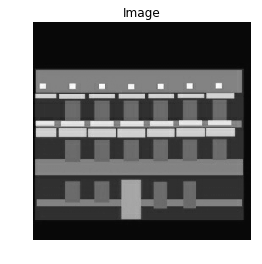

facade real_image:-


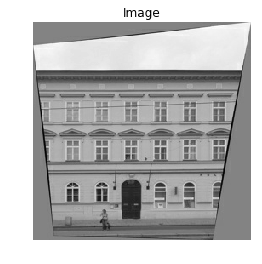

facade generated_image:-


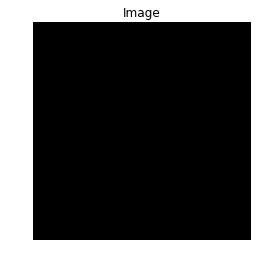

facade label:-


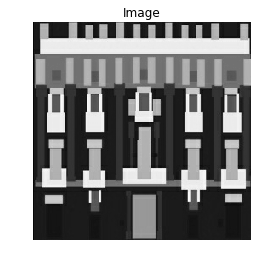

facade real_image:-


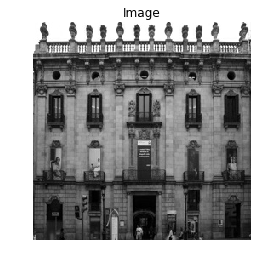

facade generated_image:-


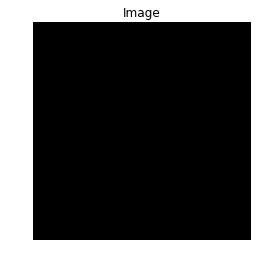

facade label:-


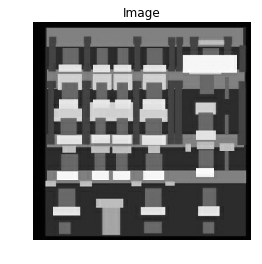

facade real_image:-


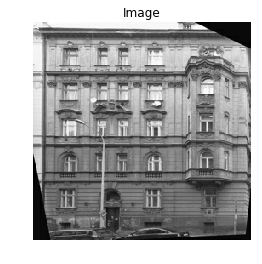

facade generated_image:-


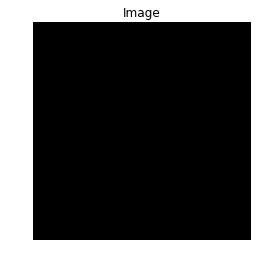

facade label:-


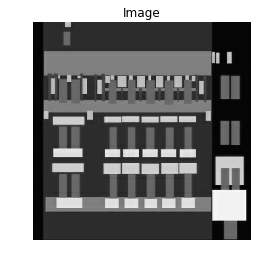

facade real_image:-


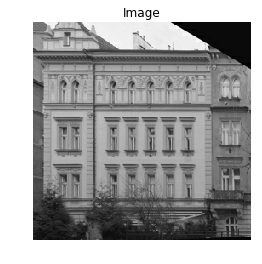

facade generated_image:-


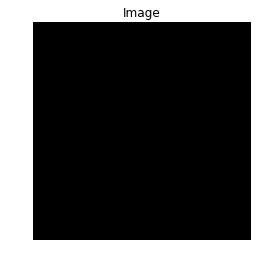

facade label:-


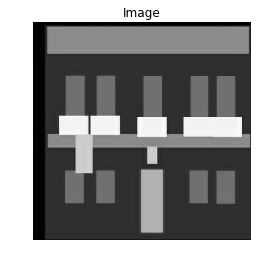

facade real_image:-


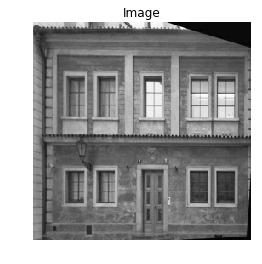

facade generated_image:-


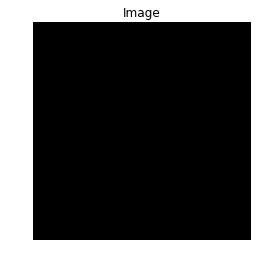

Epoch 101
Batch:0
Discriminator loss: 0.6934153
Generator loss: [12894.454, 128.9376, 0.6928787]
Batch:1
Discriminator loss: 0.6934154
Generator loss: [12784.179, 127.834854, 0.6934153]
Batch:2
Discriminator loss: 0.6934153
Generator loss: [10592.85, 105.92156, 0.6928787]
Batch:3
Discriminator loss: 0.6934154
Generator loss: [10824.574, 108.23881, 0.6934153]
Batch:4
Discriminator loss: 0.6934153
Generator loss: [8691.126, 86.90433, 0.6928787]
Batch:5
Discriminator loss: 0.6934154
Generator loss: [12107.3125, 121.06619, 0.6934153]
Batch:6
Discriminator loss: 0.6934153
Generator loss: [13485.941, 134.85248, 0.6928787]
Batch:7
Discriminator loss: 0.6934154
Generator loss: [12278.125, 122.774315, 0.6934153]
Batch:8
Discriminator loss: 0.6934153
Generator loss: [13569.599, 135.68906, 0.6928787]
Batch:9
Discriminator loss: 0.6934154
Generator loss: [5819.7256, 58.190323, 0.6934153]
Batch:10
Discriminator loss: 0.6934153
Generator loss: [11318.141, 113.17447, 0.6928787]
Batch:11
Discriminator

In [ ]:
    print('Starting the training...')
    for epoch in range(0, epochs):
        print('Epoch {}'.format(epoch))

        dis_losses = []
        gen_losses = []

        batch_counter = 1
        start = time.time()

        num_batches = int(training_facade_photos.shape[0] / batch_size)

        # Train the networks for number of batches
        for index in range(int(training_facade_photos.shape[0] / batch_size)):
            print("Batch:{}".format(index))

            # Sample a batch of training and validation images
            train_facades_batch = training_facade_labels[index * batch_size:(index + 1) * batch_size]
            train_images_batch = training_facade_photos[index * batch_size:(index + 1) * batch_size]

            val_facades_batch = validation_facade_labels[index * batch_size:(index + 1) * batch_size]
            val_images_batch = validation_facade_photos[index * batch_size:(index + 1) * batch_size]

            patches, labels = generate_and_extract_patches(train_images_batch, train_facades_batch, unet_generator,
                                                           batch_counter, patch_dim)

            """
            Train the discriminator model
            """
            d_loss = patchgan_discriminator.train_on_batch(patches, labels)

            labels = np.zeros((train_images_batch.shape[0], 2), dtype=np.uint8)
            labels[:, 1] = 1

            """
            Train the adversarial model
            """
            g_loss = adversarial_model.train_on_batch(train_facades_batch, [train_images_batch, labels])

            # Increase the batch counter
            batch_counter += 1

            print("Discriminator loss:", d_loss)
            print("Generator loss:", g_loss)

            gen_losses.append(g_loss[1])
            dis_losses.append(d_loss)

#         """
#         Save losses to Tensorboard after each epoch
#         """
#         write_log(tensorboard, 'discriminator_loss', np.mean(dis_losses), epoch)
#         write_log(tensorboard, 'generator_loss', np.mean(gen_losses), epoch)

        # After every 10th epoch, generate and save images for visualization
        if epoch % 10 == 0:
            # Sample a batch of validation datasets
            val_facades_batch = validation_facade_labels[0:5]
            val_images_batch = validation_facade_photos[0:5]

            # Generate images
            validation_generated_images = unet_generator.predict(val_facades_batch)
            
            #print(validation_generated_images[0])
            
            for x in range (5):
                print("facade label:-")
                visualize_bw_image(val_facades_batch[x])
                print("facade real_image:-")
                visualize_bw_image(val_images_batch[x])
                print("facade generated_image:-")
                visualize_bw_image(validation_generated_images[x])
                
            # Save images
            save_images(val_images_batch, val_facades_batch, validation_generated_images, epoch, 'validation', limit=5)
            
    # Save models
    unet_generator.save_weights("generator.h5")
    patchgan_discriminator.save_weights("discriminator.h5")


In [ ]:
# train_facades_batch = training_facade_labels[0:1]
# output_images = unet_generator.predict(train_facades_batch)


In [ ]:
for x in range(5):
    print (x)